## Requirements

- Python 3.6.x


In [2]:
!pip list

Package              Version
-------------------- ---------
absl-py              1.3.0
anyio                3.6.2
argon2-cffi          21.3.0
argon2-cffi-bindings 21.2.0
astor                0.8.1
async-generator      1.10
attrs                22.1.0
Babel                2.11.0
backcall             0.2.0
bleach               4.1.0
cached-property      1.5.2
cairocffi            1.2.0
certifi              2022.12.7
cffi                 1.15.1
charset-normalizer   2.0.12
contextvars          2.4
cycler               0.11.0
Cython               0.29.32
dataclasses          0.8
decorator            4.4.2
defusedxml           0.7.1
entrypoints          0.4
fastdtw              0.3.4
gast                 0.5.3
gensim               4.2.0
google-pasta         0.2.0
grpcio               1.48.2
h5py                 3.1.0
hdbscan              0.8.27
idna                 3.4
igraph               0.9.11
immutables           0.19
importlib-metadata   4.8.3
importlib-resources  5.4.0
ipykernel       

## Install

In [5]:
# !apt-get install python3.7

In [1]:
# !sudo update-alternatives --install /usr/bin/python3 python3 /usr/bin/python3.7 1

In [7]:
# !sudo update-alternatives --config python3

In [8]:
!pip install tensorflow==1.14.0

In [9]:
pip install hdbscan

Note: you may need to restart the kernel to use updated packages.


In [10]:
!pip install umap-learn

In [11]:
!pip install python-igraph
!pip install cairocffi

In [12]:
!pip install ipython-autotime

In [13]:
!pip install scipy

In [14]:
!pip install plotly

In [15]:
!pip install --upgrade gensim

In [16]:
# install StellarGraph if running on Google Colab
""" import sys
if 'google.colab' in sys.modules:
  %pip install -q stellargraph[demos]==1.2.1 """

" import sys\nif 'google.colab' in sys.modules:\n  %pip install -q stellargraph[demos]==1.2.1 "

## Import library

In [1]:
from gensim.models import Word2Vec
from hdbscan import HDBSCAN
from matplotlib.colors import ListedColormap
from plotly.subplots import make_subplots
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering, SpectralClustering, OPTICS
from sklearn.datasets import make_blobs
from sklearn.decomposition import PCA, KernelPCA
from sklearn.preprocessing import Normalizer
from sklearn.manifold import TSNE, MDS, Isomap, LocallyLinearEmbedding, SpectralEmbedding
from sklearn.model_selection import train_test_split
from sklearn.metrics import adjusted_rand_score, rand_score, silhouette_samples, silhouette_score
from sklearn.neighbors import NearestNeighbors
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.metrics.pairwise import pairwise_kernels, pairwise_distances, cosine_similarity
# from stellargraph import StellarGraph
# from stellargraph.data import UniformRandomWalk, BiasedRandomWalk
from scipy.spatial import distance
from umap import UMAP
from Utils.utils import *

# import igraph as ig
import math 
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib
import networkx as nx
import numpy as np
import os
import pandas as pd
import plotly.graph_objects as go
import plotly.express as px
import random
import seaborn as sns
import sys

# import plotly.tools as tls
# from plotly.graph_objs import *

%matplotlib inline
%load_ext autotime
# pd.options.display.float_format = "{:.8f}".format
np.random.seed(42)

time: 287 µs (started: 2022-12-10 01:51:48 -05:00)


In [2]:
if "google.colab" in sys.modules:
  from google.colab import drive

  drive.mount("/content/drive")
  dir = "/content/drive/MyDrive/PUCP/Phd/S2/T2/GraphEmbedding"
  py_file_location = "/content/drive/MyDrive/PUCP/Phd/S2/T2/GraphEmbedding/GraphEmbedding-master"
  
else:
  dir = "/home/win7/Project/I.A./GraphEmbedding_Spectrometry"
  py_file_location = "/home/win7/Project/I.A./GraphEmbedding_master"

sys.path.append(os.path.abspath(py_file_location))

time: 1.52 ms (started: 2022-12-10 01:51:48 -05:00)


In [3]:
from GraphEmbedding_master.ge.classify import read_node_label,Classifier
from GraphEmbedding_master.ge import Struc2Vec, Node2Vec, SDNE, LINE, DeepWalk

time: 6.58 ms (started: 2022-12-10 01:51:48 -05:00)


## Load dataset

In [12]:
colors = ["#FF00FF", "#3FFF00", "#00FFFF", "#FFF700", "#FF0000", "#0000FF", "#006600",
          '#00CC96', '#AB63FA', '#FFA15A', '#19D3F3', '#FF6692', '#B6E880', '#FF97FF', 'black',"gray"]
# colors = px.colors.sequential.Rainbow

time: 540 µs (started: 2022-12-10 00:05:17 -05:00)


In [4]:
# Metadata
df_meta = pd.read_csv("{}/inputs/SecondDataset/process_metadata.csv".format(dir), delimiter="|")
df_meta

,Corrected (m/z),Metabolites - Approved by Nicola,Metabolites - Used by Florian,Theoretical - m/z (based on BioCyc),Chemical Formula (based on BioCyc),Adduct (negative mode),Error in mDa (oTOF),Error in PPM (Theoretical vs Corrected)
0,59.0137,Acetic acid,*,59.01357,C2H4O2,H,0.00013,2.24338
1,NaN,Acrylamide,*,70.02955,C3H5NO,H,0.98435,14056.1798
2,71.0139,Acrylic acid,*,71.01357,C3H4O2,H,3.01133,42405.02894
3,NaN,Tetrahydrophurane,*,71.04995,C4H8O,H,13.97965,196758.00293
4,NaN,Propionic acid,*,73.02922,C3H6O2,H,13.97938,191421.77297
...,...,...,...,...,...,...,...,...
186,NaN,C20H27N10O16P3,*,755.07466,C20H27N10O16P3,H,755.07466,1000000
187,766.1076,Coenzyme A,*,766.10765,C21H36N7O16P3S,H,766.10765,1000000
188,784.1495,FAD,*,784.14957,C27H33N9O15P2,H,784.14957,1000000
189,808.1180,Acetyl coenzyme A,*,808.11821,C23H38N7O17P3S,H,808.11821,1000000


time: 28.3 ms (started: 2022-12-10 01:51:48 -05:00)


In [5]:
df_meta = df_meta.dropna(axis=0)
df_meta = df_meta.astype({"Corrected (m/z)": str})
df_meta.set_index("Corrected (m/z)", inplace=True)
df_meta

,Metabolites - Approved by Nicola,Metabolites - Used by Florian,Theoretical - m/z (based on BioCyc),Chemical Formula (based on BioCyc),Adduct (negative mode),Error in mDa (oTOF),Error in PPM (Theoretical vs Corrected)
Corrected (m/z),,,,,,,
59.0137,Acetic acid,*,59.01357,C2H4O2,H,0.00013,2.24338
71.0139,Acrylic acid,*,71.01357,C3H4O2,H,3.01133,42405.02894
74.0249,Glycine,*,74.02447,C2H5NO2,H,14.01603,189343.25348
85.0296,Methyl Acrylate,*,85.02922,C4H6O2,H,3.99528,46987.17023
87.0086,Pyruvic acid,*,87.00848,C3H4O3,H,14.01582,161085.6483
...,...,...,...,...,...,...,...
664.117,Nicotinamide adenine dinucleotide,*,664.11721,C21H29N7O14P2,H,664.11721,1000000
665.2139,C33H36N6O7 + K,*,665.21430,C24H42O21,H,665.2143,1000000
766.1076,Coenzyme A,*,766.10765,C21H36N7O16P3S,H,766.10765,1000000


time: 24.5 ms (started: 2022-12-10 01:51:48 -05:00)


In [6]:
# Load dataset Group 1
df1 = pd.read_csv("{}/inputs/SecondDataset/process_wt.csv".format(dir), delimiter="|")

print(df1.shape)
df1.head()

(230, 92)


,Set,Cluster,ID,ionMz,Label,59.0137,71.0139,74.0249,85.0296,87.0086,...,521.984,545.3994,604.0696,606.0744,611.144,664.117,665.2139,766.1076,784.1495,808.118
0,A,WT,71,0071 / WT 2.2,WT,56523,1438,3904,1167,1646,...,17082,7826,21390,95664,9169,6184,3014,4161,2455,4679
1,A,WT,72,0072 / WT 2.2,WT,24625,570,1531,518,1068,...,10087,5536,11066,44221,3993,3181,2565,1987,1553,2701
2,A,WT,73,0073 / WT 2.2,WT,78586,577,2486,1260,1095,...,21099,9408,24709,105252,9896,8580,5077,5141,2404,5618
3,A,WT,74,0074 / WT 2.2,WT,76559,1272,2501,1565,1673,...,21910,8717,22982,103328,10482,6189,3498,5228,3433,5782
4,A,WT,75,0075 / WT 2.2,WT,67449,1060,2557,1345,1596,...,22226,9082,23236,105020,9024,6370,3947,4743,1996,5418


time: 25.7 ms (started: 2022-12-10 01:51:48 -05:00)


In [ ]:
# df1.set_index("Alignment ID", inplace=True)
# df1.head()

time: 509 µs (started: 2022-12-08 23:36:29 -05:00)


In [7]:
# Load dataset Group 2

df2 = pd.read_csv("{}/inputs/SecondDataset/process_zw.csv".format(dir), delimiter="|")

print(df2.shape)
df2.head()

(150, 92)


,Set,Cluster,ID,ionMz,Label,59.0137,71.0139,74.0249,85.0296,87.0086,...,521.984,545.3994,604.0696,606.0744,611.144,664.117,665.2139,766.1076,784.1495,808.118
0,A,WT,1,0001 / zwf1^ 3.4,zwf1^,53182,641,5734,1042,1294,...,23348,6988,64597,114975,7538,4107,3095,3877,2040,3349
1,A,WT,2,0002 / zwf1^ 3.4,zwf1^,57902,1767,2889,1228,1531,...,26203,5613,75636,131864,8365,4607,4145,5541,2816,6021
2,A,WT,3,0003 / zwf1^ 3.4,zwf1^,51861,491,3540,1054,2448,...,22678,6304,64496,114834,7459,4293,3090,3279,1465,5946
3,A,WT,4,0004 / zwf1^ 3.4,zwf1^,62812,1648,6611,914,2578,...,25871,7033,76118,137734,6667,6285,4698,4961,2726,7357
4,A,WT,5,0005 / zwf1^ 3.4,zwf1^,54291,1525,3965,872,1812,...,22464,6646,67845,121045,8957,5474,4182,5072,2647,5559


time: 24.2 ms (started: 2022-12-10 01:51:48 -05:00)


In [ ]:
# df2.set_index("Alignment ID", inplace=True)
# df2.head()

time: 316 µs (started: 2022-12-08 23:35:06 -05:00)


In [8]:
# Load dataset Group 3

df3 = pd.read_csv("{}/inputs/SecondDataset/process_pc.csv".format(dir), delimiter="|")

print(df3.shape)
df3.head()

(80, 92)


,Set,Cluster,ID,ionMz,Label,59.0137,71.0139,74.0249,85.0296,87.0086,...,521.984,545.3994,604.0696,606.0744,611.144,664.117,665.2139,766.1076,784.1495,808.118
0,A,WT,11,0011 / pck1^ 2.4,pck1^,33968,1496,3792,1289,2829,...,17222,3332,43544,122538,8787,15937,4800,7941,4592,6114
1,A,WT,12,0012 / pck1^ 2.4,pck1^,22565,1443,2265,1072,1470,...,12663,2010,33046,90194,6764,12166,3541,5093,3797,4205
2,A,WT,13,0013 / pck1^ 2.4,pck1^,36285,1810,4060,1329,2535,...,18559,2929,46944,138287,9483,14447,3850,7393,4266,6319
3,A,WT,14,0014 / pck1^ 2.4,pck1^,30275,678,3406,622,981,...,14865,2604,35976,107078,7822,12518,3170,5731,4448,4696
4,A,WT,15,0015 / pck1^ 2.4,pck1^,34858,1257,4116,2149,1629,...,17731,3467,41368,132745,10627,14631,4577,8116,3130,6239


time: 25.9 ms (started: 2022-12-10 01:51:48 -05:00)


## Preprocessing

### Join sub row data

In [9]:
# df_process1 = df1.iloc[:,5:]
# df_process1 = df1[df1["Set"] == "A"].iloc[:, 5:]
df_process1 = df2[df2["Set"] == "A"].iloc[:, 5:]

df_process1

,59.0137,71.0139,74.0249,85.0296,87.0086,88.0405,89.0245,101.0243,102.0562,109.0407,...,521.984,545.3994,604.0696,606.0744,611.144,664.117,665.2139,766.1076,784.1495,808.118
0,53182,641,5734,1042,1294,1940,2755,902,1260,4804,...,23348,6988,64597,114975,7538,4107,3095,3877,2040,3349
1,57902,1767,2889,1228,1531,990,2511,606,1105,2865,...,26203,5613,75636,131864,8365,4607,4145,5541,2816,6021
2,51861,491,3540,1054,2448,1928,1608,677,1154,2347,...,22678,6304,64496,114834,7459,4293,3090,3279,1465,5946
3,62812,1648,6611,914,2578,1633,2480,581,1096,4227,...,25871,7033,76118,137734,6667,6285,4698,4961,2726,7357
4,54291,1525,3965,872,1812,1348,2306,1630,803,2882,...,22464,6646,67845,121045,8957,5474,4182,5072,2647,5559
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115,129628,1838,10490,2012,3117,3222,3176,1507,2917,6393,...,33568,11259,27205,73112,6420,30236,3880,5873,2777,4057
116,127563,1962,7264,1931,2241,1700,3390,997,2262,5885,...,28032,7847,26171,68764,6317,28520,3325,7379,2591,4651
117,116371,2126,6332,1623,1771,1506,1578,1875,2339,4505,...,33070,8290,26751,71346,7152,30316,4474,5283,2820,4332
118,114443,2238,8344,1290,2458,1425,2673,1151,2669,4236,...,26079,8948,26306,62803,6692,24865,3591,6355,3410,4097


time: 17 ms (started: 2022-12-10 01:51:48 -05:00)


In [10]:
# df_process2 = df1.iloc[:,5:]
# df_process2 = df1[df1["Set"] == "B"].iloc[:, 5:]
df_process2 = df2[df2["Set"] == "B"].iloc[:, 5:]

df_process2

,59.0137,71.0139,74.0249,85.0296,87.0086,88.0405,89.0245,101.0243,102.0562,109.0407,...,521.984,545.3994,604.0696,606.0744,611.144,664.117,665.2139,766.1076,784.1495,808.118
120,492151,56202,135042,79787,24972,40786,107219,24729,44919,110903,...,203227,119960,462299,973513,29926,218051,11692,19826,17027,51549
121,266046,41055,96689,65532,20413,33232,70418,21036,39187,104001,...,164996,93711,364985,711231,28342,175572,12965,14337,16680,35998
122,306408,40586,100529,54964,20087,31930,71908,20388,35661,98163,...,189251,114877,448030,883964,29096,208666,11909,20216,19633,50587
123,276418,39405,99356,62804,24145,35215,77343,22901,41558,119314,...,170255,99189,383851,745099,28287,184145,10968,16737,14879,39355
124,103041,20735,57256,48235,16964,27364,65515,19408,32737,97649,...,188685,121449,462978,928661,31392,224556,11413,20382,19302,44526
125,133460,24274,60145,51493,15593,25560,62448,20316,31652,91218,...,214544,127575,474940,992042,31016,227383,11629,22801,18067,53610
126,368665,49215,120697,75953,28352,41205,106466,23647,45147,104827,...,199336,116218,452813,903588,29526,214124,11557,18344,18641,48052
127,290351,40386,93313,60625,20794,33519,79931,21764,36186,111883,...,165600,101544,372805,739842,26682,183264,10073,14865,15444,37419
128,147248,23854,60079,42921,16604,24395,50174,19114,31815,92492,...,198361,128654,475592,971897,32999,222363,12067,21068,19473,48932
129,157700,25667,60569,36160,14401,20856,45682,16076,27443,84241,...,212890,126831,459869,960648,31005,223326,8951,20014,17118,46741


time: 27.5 ms (started: 2022-12-10 01:51:49 -05:00)


### Calculate the logarithm

In [11]:
df_process1_log = df_process1.copy()
for column in df_process1.columns:
  df_process1_log[column] = np.log10(df_process1_log[column])
df_process1_log

,59.0137,71.0139,74.0249,85.0296,87.0086,88.0405,89.0245,101.0243,102.0562,109.0407,...,521.984,545.3994,604.0696,606.0744,611.144,664.117,665.2139,766.1076,784.1495,808.118
0,4.725765,2.806858,3.758458,3.017868,3.111934,3.287802,3.440122,2.955207,3.100371,3.681603,...,4.368250,3.844353,4.810212,5.060603,3.877256,3.613525,3.490661,3.588496,3.309630,3.524915
1,4.762694,3.247237,3.460748,3.089198,3.184975,2.995635,3.399847,2.782473,3.043362,3.457125,...,4.418351,3.749195,4.878729,5.120126,3.922466,3.663418,3.617525,3.743588,3.449633,3.779669
2,4.714841,2.691081,3.549003,3.022841,3.388811,3.285107,3.206286,2.830589,3.062206,3.370513,...,4.355605,3.799616,4.809533,5.060070,3.872681,3.632761,3.489958,3.515741,3.165838,3.774225
3,4.798043,3.216957,3.820267,2.960946,3.411283,3.212986,3.394452,2.764176,3.039811,3.626032,...,4.412813,3.847141,4.881487,5.139041,3.823930,3.798305,3.671913,3.695569,3.435526,3.866701
4,4.734728,3.183270,3.598243,2.940516,3.258158,3.129690,3.362859,3.212188,2.904716,3.459694,...,4.351487,3.822560,4.831518,5.082947,3.952163,3.738305,3.621384,3.705179,3.422754,3.744997
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115,5.112699,3.264346,4.020775,3.303628,3.493737,3.508126,3.501880,3.178113,3.464936,3.805705,...,4.525925,4.051500,4.434649,4.863989,3.807535,4.480524,3.588832,3.768860,3.443576,3.608205
116,5.105725,3.292699,3.861176,3.285782,3.350442,3.230449,3.530200,2.998695,3.354493,3.769746,...,4.447654,3.894704,4.417820,4.837361,3.800511,4.455150,3.521792,3.867998,3.413467,3.667546
117,5.065845,3.327563,3.801541,3.210319,3.248219,3.177825,3.198107,3.273001,3.369030,3.653695,...,4.519434,3.918555,4.427340,4.853370,3.854428,4.481672,3.650696,3.722881,3.450249,3.636688
118,5.058589,3.349860,3.921374,3.110590,3.390582,3.153815,3.426999,3.061075,3.426349,3.626956,...,4.416291,3.951726,4.420055,4.797980,3.825556,4.395588,3.555215,3.803116,3.532754,3.612466


time: 62.4 ms (started: 2022-12-10 01:51:49 -05:00)


In [12]:
df_process2_log = df_process2.copy()
for column in df_process2.columns:
  df_process2_log[column] = np.log10(df_process2_log[column])
df_process2_log

,59.0137,71.0139,74.0249,85.0296,87.0086,88.0405,89.0245,101.0243,102.0562,109.0407,...,521.984,545.3994,604.0696,606.0744,611.144,664.117,665.2139,766.1076,784.1495,808.118
120,5.692098,4.749752,5.130469,4.901932,4.397453,4.610511,5.030272,4.393207,4.652430,5.044943,...,5.307981,5.079036,5.664923,5.988342,4.476049,5.338558,4.067889,4.297235,4.231138,4.712220
121,5.424957,4.613366,4.985377,4.816453,4.309907,4.521556,4.847684,4.322963,4.593142,5.017038,...,5.217473,4.971791,5.562275,5.852011,4.452430,5.244455,4.112773,4.156458,4.222196,4.556278
122,5.486300,4.608376,5.002291,4.740078,4.302915,4.504199,4.856777,4.309375,4.552194,4.991948,...,5.277038,5.060233,5.651307,5.946435,4.463833,5.319452,4.075875,4.305695,4.292987,4.704039
123,5.441566,4.595551,4.997194,4.797987,4.382827,4.546728,4.888421,4.359854,4.618655,5.076691,...,5.231100,4.996464,5.584163,5.872214,4.451587,5.265160,4.040127,4.223678,4.172574,4.595000
124,5.013010,4.316704,4.757821,4.683362,4.229528,4.437180,4.816341,4.287981,4.515039,4.989668,...,5.275737,5.084394,5.665560,5.967857,4.496819,5.351325,4.057400,4.309247,4.285602,4.648614
125,5.125351,4.385141,4.779200,4.711748,4.192930,4.407561,4.795519,4.307838,4.500401,4.960081,...,5.331516,5.105766,5.676639,5.996530,4.491586,5.356758,4.065542,4.357954,4.256886,4.729246
126,5.566632,4.692097,5.081696,4.880545,4.452584,4.614950,5.027211,4.373776,4.654629,5.020473,...,5.299586,5.065273,5.655919,5.955970,4.470205,5.330665,4.062845,4.263494,4.270469,4.681711
127,5.462923,4.606231,4.969942,4.782652,4.317938,4.525291,4.902715,4.337739,4.558541,5.048764,...,5.219060,5.006654,5.571482,5.869139,4.426218,5.263077,4.003159,4.172165,4.188760,4.573092
128,5.168049,4.377561,4.778723,4.632670,4.220213,4.387301,4.700479,4.281352,4.502632,4.966104,...,5.297456,5.109423,5.677235,5.987620,4.518501,5.347063,4.081599,4.323623,4.289433,4.689593
129,5.197832,4.409375,4.782250,4.558228,4.158393,4.319231,4.659745,4.206178,4.438432,4.925524,...,5.328155,5.103225,5.662634,5.982564,4.491432,5.348939,3.951872,4.301334,4.233453,4.669698


time: 75.2 ms (started: 2022-12-10 01:51:49 -05:00)


### Transpose

In [13]:
# df_process1_t = transpose(df_process1_log)
df_process1_t = df_process1_log.copy()
df_process1_t

,59.0137,71.0139,74.0249,85.0296,87.0086,88.0405,89.0245,101.0243,102.0562,109.0407,...,521.984,545.3994,604.0696,606.0744,611.144,664.117,665.2139,766.1076,784.1495,808.118
0,4.725765,2.806858,3.758458,3.017868,3.111934,3.287802,3.440122,2.955207,3.100371,3.681603,...,4.368250,3.844353,4.810212,5.060603,3.877256,3.613525,3.490661,3.588496,3.309630,3.524915
1,4.762694,3.247237,3.460748,3.089198,3.184975,2.995635,3.399847,2.782473,3.043362,3.457125,...,4.418351,3.749195,4.878729,5.120126,3.922466,3.663418,3.617525,3.743588,3.449633,3.779669
2,4.714841,2.691081,3.549003,3.022841,3.388811,3.285107,3.206286,2.830589,3.062206,3.370513,...,4.355605,3.799616,4.809533,5.060070,3.872681,3.632761,3.489958,3.515741,3.165838,3.774225
3,4.798043,3.216957,3.820267,2.960946,3.411283,3.212986,3.394452,2.764176,3.039811,3.626032,...,4.412813,3.847141,4.881487,5.139041,3.823930,3.798305,3.671913,3.695569,3.435526,3.866701
4,4.734728,3.183270,3.598243,2.940516,3.258158,3.129690,3.362859,3.212188,2.904716,3.459694,...,4.351487,3.822560,4.831518,5.082947,3.952163,3.738305,3.621384,3.705179,3.422754,3.744997
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115,5.112699,3.264346,4.020775,3.303628,3.493737,3.508126,3.501880,3.178113,3.464936,3.805705,...,4.525925,4.051500,4.434649,4.863989,3.807535,4.480524,3.588832,3.768860,3.443576,3.608205
116,5.105725,3.292699,3.861176,3.285782,3.350442,3.230449,3.530200,2.998695,3.354493,3.769746,...,4.447654,3.894704,4.417820,4.837361,3.800511,4.455150,3.521792,3.867998,3.413467,3.667546
117,5.065845,3.327563,3.801541,3.210319,3.248219,3.177825,3.198107,3.273001,3.369030,3.653695,...,4.519434,3.918555,4.427340,4.853370,3.854428,4.481672,3.650696,3.722881,3.450249,3.636688
118,5.058589,3.349860,3.921374,3.110590,3.390582,3.153815,3.426999,3.061075,3.426349,3.626956,...,4.416291,3.951726,4.420055,4.797980,3.825556,4.395588,3.555215,3.803116,3.532754,3.612466


time: 24.2 ms (started: 2022-12-10 01:51:49 -05:00)


In [14]:
# df_process1_t = transpose(df_process1_log)
df_process2_t = df_process2_log.copy()
df_process2_t

,59.0137,71.0139,74.0249,85.0296,87.0086,88.0405,89.0245,101.0243,102.0562,109.0407,...,521.984,545.3994,604.0696,606.0744,611.144,664.117,665.2139,766.1076,784.1495,808.118
120,5.692098,4.749752,5.130469,4.901932,4.397453,4.610511,5.030272,4.393207,4.652430,5.044943,...,5.307981,5.079036,5.664923,5.988342,4.476049,5.338558,4.067889,4.297235,4.231138,4.712220
121,5.424957,4.613366,4.985377,4.816453,4.309907,4.521556,4.847684,4.322963,4.593142,5.017038,...,5.217473,4.971791,5.562275,5.852011,4.452430,5.244455,4.112773,4.156458,4.222196,4.556278
122,5.486300,4.608376,5.002291,4.740078,4.302915,4.504199,4.856777,4.309375,4.552194,4.991948,...,5.277038,5.060233,5.651307,5.946435,4.463833,5.319452,4.075875,4.305695,4.292987,4.704039
123,5.441566,4.595551,4.997194,4.797987,4.382827,4.546728,4.888421,4.359854,4.618655,5.076691,...,5.231100,4.996464,5.584163,5.872214,4.451587,5.265160,4.040127,4.223678,4.172574,4.595000
124,5.013010,4.316704,4.757821,4.683362,4.229528,4.437180,4.816341,4.287981,4.515039,4.989668,...,5.275737,5.084394,5.665560,5.967857,4.496819,5.351325,4.057400,4.309247,4.285602,4.648614
125,5.125351,4.385141,4.779200,4.711748,4.192930,4.407561,4.795519,4.307838,4.500401,4.960081,...,5.331516,5.105766,5.676639,5.996530,4.491586,5.356758,4.065542,4.357954,4.256886,4.729246
126,5.566632,4.692097,5.081696,4.880545,4.452584,4.614950,5.027211,4.373776,4.654629,5.020473,...,5.299586,5.065273,5.655919,5.955970,4.470205,5.330665,4.062845,4.263494,4.270469,4.681711
127,5.462923,4.606231,4.969942,4.782652,4.317938,4.525291,4.902715,4.337739,4.558541,5.048764,...,5.219060,5.006654,5.571482,5.869139,4.426218,5.263077,4.003159,4.172165,4.188760,4.573092
128,5.168049,4.377561,4.778723,4.632670,4.220213,4.387301,4.700479,4.281352,4.502632,4.966104,...,5.297456,5.109423,5.677235,5.987620,4.518501,5.347063,4.081599,4.323623,4.289433,4.689593
129,5.197832,4.409375,4.782250,4.558228,4.158393,4.319231,4.659745,4.206178,4.438432,4.925524,...,5.328155,5.103225,5.662634,5.982564,4.491432,5.348939,3.951872,4.301334,4.233453,4.669698


time: 44.6 ms (started: 2022-12-10 01:51:49 -05:00)


### Normal distribution (Done)

In [33]:
# sns.pairplot(df_process1)

time: 217 µs (started: 2022-12-10 00:07:49 -05:00)


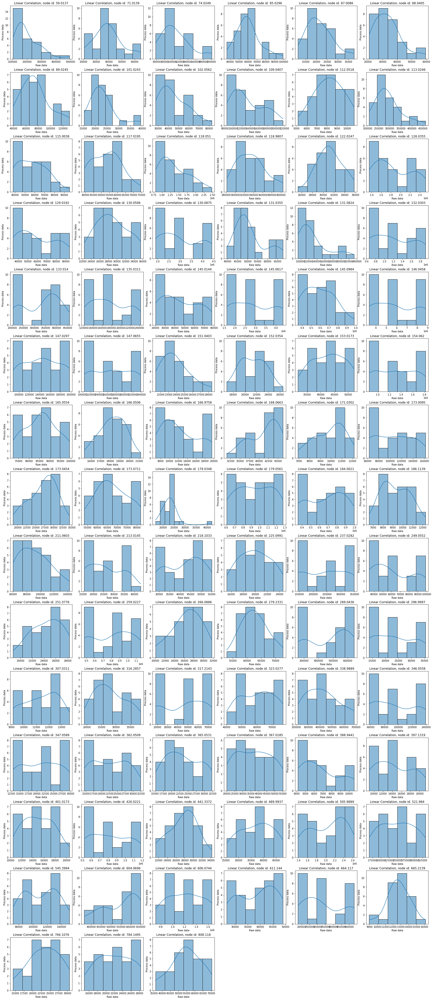

time: 12.2 s (started: 2022-12-08 23:35:08 -05:00)


In [ ]:
df_temp = df_process2
h = 5
w = 5
fig = plt.figure(figsize=(30, h * len(df_temp.columns) / (30 / w)))
fig.subplots_adjust(hspace=0.25, wspace=0.15)

for k, node_id in enumerate(df_temp.columns):
  ax = fig.add_subplot(math.ceil(len(df_temp.columns) / 6), 6, k + 1)
  ax.set_xlabel("Raw data")
  ax.set_ylabel("Process data");
  ax.set_title("Linear Correlation, node id: {}".format(node_id))
  sns.histplot(data=df_temp, x=node_id, kde=True)

In [ ]:
from scipy import stats
from scipy.stats import pearsonr

df_temp = df_raw1.copy()
for k, node_id in enumerate(df_temp.columns[:10]):
  shapiro_test = stats.kstest(df_temp[node_id], "norm")
  print(f"Node id {node_id}: {shapiro_test}")

NameError: name 'df_raw1' is not defined

time: 628 ms (started: 2022-12-08 23:35:20 -05:00)


In [ ]:
# Q-Q plot
""" from statsmodels.graphics.gofplots import qqplot

qqplot(df_raw1[43].values, line="s")
plt.show() """

In [ ]:
# Shapiro-Wilk
from scipy.stats import shapiro

stat, p = shapiro(df_raw1[5].values)
print('Estadisticos=%.3f, p=%.3f' % (stat, p))
# Interpretación
alpha = 0.05
if p > alpha:
   print('La muestra parece Gaussiana o Normal (no se rechaza la hipótesis nula H0)')
else:
   print('La muestra no parece Gaussiana o Normal(se rechaza la hipótesis nula H0)')

In [ ]:
# K^2 de D’Agostino

from scipy.stats import normaltest

stat, p = normaltest(df_raw1[5].values)
print('Estadisticos=%.3f, p=%.3f' % (stat, p))
# Interpretación
alpha = 0.05
if p > alpha:
   print('La muestra parece Gaussiana o Normal (no se rechaza la hipótesis nula H0)')
else:
   print('La muestra no parece Gaussiana o Normal(se rechaza la hipótesis nula H0)')

In [ ]:
import pylab
import scipy.stats as stats

for column in df_raw1.columns[:10]:
  print(column)
  stats.probplot(df_raw1[column].values, dist="norm", plot=pylab)
  pylab.show()

## Building graph

### Correlation matrix

* 0 Null
* $>$ 0.0 – 0.2 Very low
* $>$ 0.2 – 0.4 Low
* $>$ 0.4 – 0.6 Moderate
* $>$ 0.6 – 0.8 High
* $>$ 0.8 – $<$ 1.0 Ver high (test)
* 1.0 Perfect

In [15]:
# matrix_raw1 = df_raw1_t.corr(method="pearson") # pearson, kendall, spearman
# matrix1.style.background_gradient(cmap="bwr")
# matrix_raw2 = df_raw2_t.corr(method="pearson") # pearson, kendall, spearman
matrix_process1 = df_process1_t.corr(method="pearson") # pearson, kendall, spearman
matrix_process2 = df_process2_t.corr(method="pearson") # pearson, kendall, spearman

time: 9.45 ms (started: 2022-12-10 01:51:49 -05:00)


' plt.figure(1, figsize=(30, 30))\nplt.matshow(matrix, cmap="bwr")#, vmin=-1, vmax=1)\n# plt.xticks(range(len(sdf.columns)), sdf.columns, rotation=90)\n# plt.yticks(range(len(sdf.columns)), sdf.columns) '

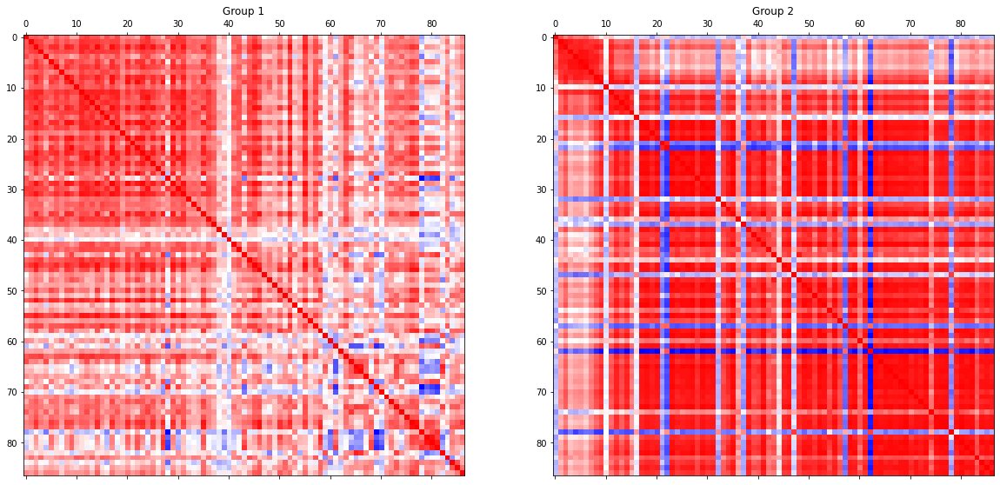

time: 567 ms (started: 2022-12-10 01:51:49 -05:00)


In [16]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20, 20))
axes[0].matshow(matrix_process1, cmap="bwr")
axes[0].set_title("Group 1")
axes[1].matshow(matrix_process2, cmap="bwr")
axes[1].set_title("Group 2")
""" axes[1][0].matshow(matrix_process1, cmap="bwr")
axes[1][0].set_title("Group 1")
axes[1][1].matshow(matrix_process2, cmap="bwr")
axes[1][1].set_title("Group 2") """

""" plt.figure(1, figsize=(30, 30))
plt.matshow(matrix, cmap="bwr")#, vmin=-1, vmax=1)
# plt.xticks(range(len(sdf.columns)), sdf.columns, rotation=90)
# plt.yticks(range(len(sdf.columns)), sdf.columns) """

### With weight

In [17]:
threshold = 0.5

edges_process1 = build_graph_weight(matrix_process1, threshold)
edges_process2 = build_graph_weight(matrix_process2, threshold)

time: 281 ms (started: 2022-12-10 01:51:50 -05:00)


In [18]:
G1 = nx.Graph()
G1.add_weighted_edges_from(edges_process1)

G2 = nx.Graph()
G2.add_weighted_edges_from(edges_process2)

time: 24.6 ms (started: 2022-12-10 01:51:50 -05:00)


In [19]:
degree_G1 = np.array(list(G1.degree()))
max_degree_G1 = degree_G1[degree_G1[:, 1].argsort()[-1]][0]

degree_G2 = np.array(list(G2.degree()))
max_degree_G2 = degree_G2[degree_G2[:, 1].argsort()[-1]][0]

max_degree_G1, max_degree_G2

('132.0303', '118.051')

time: 5.65 ms (started: 2022-12-10 01:51:50 -05:00)


In [20]:
# Change node id name for one graph
edges_process1_ = []
for edge in edges_process1:
  edges_process1_.append(["A" + edge[0], "A" + edge[1], edge[2]])

edges_process2_ = []
for edge in edges_process2:
  edges_process2_.append(["B" + edge[0], "B" + edge[1], edge[2]])

# Join
edges_process = edges_process1_ + edges_process2_
edges_process.append(["A" + max_degree_G1, "B" + max_degree_G2, 0.5])
edges_process[-5:]

[['B808.118', 'B664.117', 0.9159373783139187],
 ['B808.118', 'B665.2139', 0.6593035563737853],
 ['B808.118', 'B766.1076', 0.9639736271278809],
 ['B808.118', 'B784.1495', 0.8995832115739224],
 ['A132.0303', 'B118.051', 0.5]]

time: 8.29 ms (started: 2022-12-10 01:51:50 -05:00)


In [21]:
G = nx.Graph()
G.add_weighted_edges_from(edges_process)

time: 15.9 ms (started: 2022-12-10 01:51:51 -05:00)


Text(0.5, 1.0, 'Group 1 + Group 2')

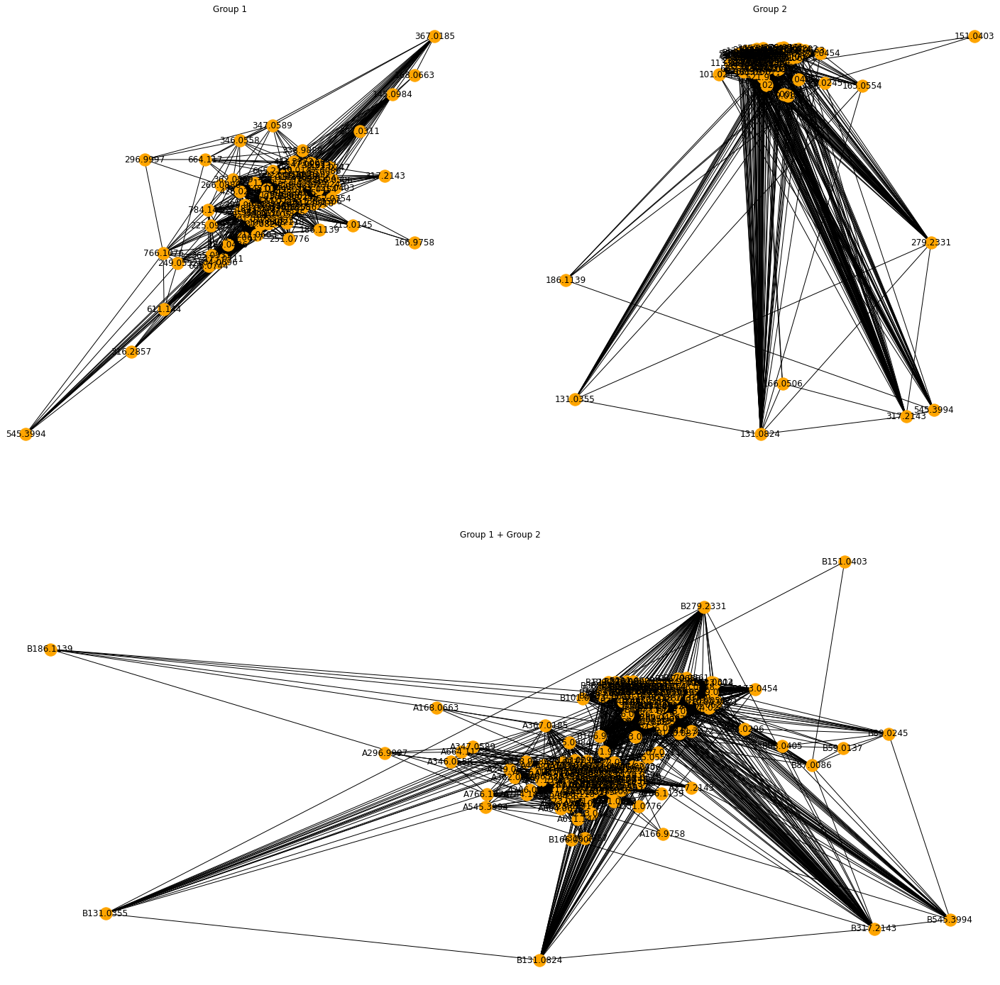

time: 2 s (started: 2022-12-10 01:51:51 -05:00)


In [22]:
# Plot graph
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(25, 25))

gs = axes[1, 0].get_gridspec()
# create sub plots as grid
for ax in axes[1, :]:
    ax.remove()

pos = nx.spring_layout(G1)
nx.draw(G1, pos, with_labels=True, node_color="orange", ax=axes[0, 0])
axes[0, 0].set_title("Group 1")

pos = nx.spring_layout(G2)
nx.draw(G2, pos, with_labels=True, node_color="orange", ax=axes[0, 1])
axes[0, 1].set_title("Group 2")

axsbig = fig.add_subplot(gs[1, :])
nx.draw(G, pos=nx.spring_layout(G, iterations=12, seed=42), with_labels=True, node_color="orange", ax=axsbig)
axsbig.set_title("Group 1 + Group 2")

#### Info graph

In [109]:
print(nx.info(G1))
print(nx.info(G2))
print(nx.info(G))

Name: 
Type: Graph
Number of nodes: 85
Number of edges: 1867
Average degree:  43.9294
Name: 
Type: Graph
Number of nodes: 84
Number of edges: 2537
Average degree:  60.4048
Name: 
Type: Graph
Number of nodes: 169
Number of edges: 4405
Average degree:  52.1302
time: 1.39 ms (started: 2022-12-10 00:45:40 -05:00)


Name: 
Type: Graph
Number of nodes: 85
Number of edges: 1867
Average degree:  43.9294
43.92941176470588


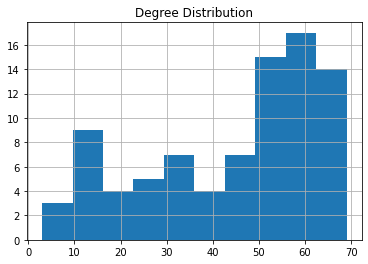

time: 143 ms (started: 2022-12-10 00:45:45 -05:00)


In [110]:
# info_graph(G1)
print(nx.info(G1))
print(np.mean(list(dict(G1.degree()).values())))

plt.clf()
plt.hist(list(dict(G1.degree()).values()))
plt.title("Degree Distribution")
plt.grid()
plt.show()

Name: 
Type: Graph
Number of nodes: 84
Number of edges: 2537
Average degree:  60.4048
60.404761904761905


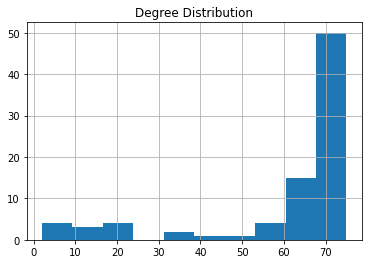

time: 140 ms (started: 2022-12-10 00:45:49 -05:00)


In [111]:
# info_graph(G2)

print(nx.info(G2))
print(np.mean(list(dict(G2.degree()).values())))

plt.clf()
plt.hist(list(dict(G2.degree()).values()))
plt.title("Degree Distribution")
plt.grid()
plt.show()

Name: 
Type: Graph
Number of nodes: 169
Number of edges: 4405
Average degree:  52.1302
52.1301775147929


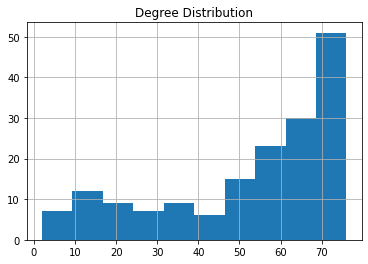

time: 145 ms (started: 2022-12-10 00:45:52 -05:00)


In [112]:
# info_graph(G)

print(nx.info(G))
print(np.mean(list(dict(G.degree()).values())))

plt.clf()
plt.hist(list(dict(G.degree()).values()))
plt.title("Degree Distribution")
plt.grid()
plt.show()

## Graph embedding, Stellar

#### Biased walks

In [ ]:
import random
from functools import partial
from typing import List, Callable

In [ ]:
from networkx.algorithms.shortest_paths import weighted
def _check_value(value, name):
    try:
        _ = 1 / value

    except ZeroDivisionError:
        raise ValueError(
            f"The value of {name} is too small " f"or zero to be used in 1/{name}."
        )


def _undirected(node, graph) -> List[tuple]:
    edges = graph.edges(node)

    return edges


def _directed(node, graph) -> List[tuple]:
    edges = graph.out_edges(node, data=True)

    return edges


def _get_edge_fn(graph) -> Callable:
    fn = _directed if nx.classes.function.is_directed(graph) else _undirected

    fn = partial(fn, graph=graph)
    return fn


def _unweighted(edges: List[tuple]) -> np.ndarray:
    return np.ones(len(edges))


def _weighted(edges: List[tuple]) -> np.ndarray:
    print(edges)
    weights = map(lambda edge: edge[-1]["weight"], edges)

    return np.array([*weights])


def _get_weight_fn(graph) -> Callable:
    fn = _weighted if nx.classes.function.is_weighted(graph) else _unweighted

    return fn


class BiasedRandomWalker:
    """
    Class to do biased second order random walks.
    Args:
        walk_length (int): Number of random walks.
        walk_number (int): Number of nodes in truncated walk.
        p (float): Return parameter (1/p transition probability) to move towards previous node.
        q (float): In-out parameter (1/q transition probability) to move away from previous node.
    """

    walks: list
    graph: nx.classes.graph.Graph
    edge_fn: Callable
    weight_fn: Callable

    def __init__(self, walk_length: int, walk_number: int, p: float, q: float):
        self.walk_length = walk_length
        self.walk_number = walk_number

        _check_value(p, "p")
        self.p = p

        _check_value(q, "q")
        self.q = q

    def do_walk(self, node: int) -> List[str]:
        """
        Doing a single truncated second order random walk from a source node.
        Arg types:
            * **node** *(int)* - The source node of the random walk.
        Return types:
            * **walk** *(list of strings)* - A single truncated random walk.
        """
        walk = [node]
        previous_node = None
        previous_node_neighbors = []
        for _ in range(self.walk_length - 1):
            current_node = walk[-1]
            edges = self.edge_fn(current_node)
            # print(edges)
            current_node_neighbors = np.array([edge[1] for edge in edges])

            weights = []
            for item in edges:
              weights.append(self.graph.get_edge_data(*item)["weight"])
            
            # weights = list(self.graph.edges(data=True)) # self.weight_fn(edges)

            # print("weights", weights)
            probability = np.piecewise(
                weights,
                [
                    current_node_neighbors == previous_node,
                    np.isin(current_node_neighbors, previous_node_neighbors),
                ],
                [lambda w: w / self.p, lambda w: w / 1, lambda w: w / self.q],
            )
            # print("probability", probability)
            probability = abs(probability)
            # print("probability", probability)
            # print("sum(probability)", sum(probability))
            norm_probability = probability / sum(probability)
            # print("norm_probability", norm_probability)
            # print("current_node_neighbors", current_node_neighbors)
            selected = np.random.choice(current_node_neighbors, 1, p=norm_probability)[0]
            # print("selected", selected)
            walk.append(selected)

            previous_node_neighbors = current_node_neighbors
            previous_node = current_node

        walk = [str(w) for w in walk]
        return walk

    def do_walks(self, graph):
        """
        Doing a fixed number of truncated random walk from every node in the graph.
        Arg types:
            * **graph** *(NetworkX graph)* - The graph to run the random walks on.
        """
        self.walks = []
        self.graph = graph

        self.edge_fn = _get_edge_fn(graph)
        self.weight_fn = _get_weight_fn(graph)

        for node in self.graph.nodes():
            for _ in range(self.walk_number):
                walk_from_node = self.do_walk(node)
                self.walks.append(walk_from_node)
        return self.walks

#### Deepwalk

In [ ]:
# Parameters
length = 16 # maximum length of a random walk
n = 16 # number of random walks per root node

In [ ]:
Gs1 = StellarGraph.from_networkx(G1)
rw = UniformRandomWalk(Gs1)

walk_paths1 = rw.run(
    nodes=list(Gs1.nodes()),  # root nodes
    length=length,  # maximum length of a random walk
    n=n,  # number of random walks per root node
    seed=42 #  random number generator seed; default is None
)
print("Number of random walks: {}".format(len(walk_paths1)))
# walk_paths1[:10]

In [ ]:
Gs2 = StellarGraph.from_networkx(G2)
rw = UniformRandomWalk(Gs2)

walk_paths2 = rw.run(
    nodes=list(Gs2.nodes()),  # root nodes
    length=length,  # maximum length of a random walk
    n=n,  # number of random walks per root node
    seed=42 #  random number generator seed; default is None
)
print("Number of random walks: {}".format(len(walk_paths2)))
# walk_paths2[:5]

In [ ]:
Gs3 = StellarGraph.from_networkx(G3)
rw = UniformRandomWalk(Gs3)

walk_paths3 = rw.run(
    nodes=list(Gs3.nodes()),  # root nodes
    length=length,  # maximum length of a random walk
    n=n,  # number of random walks per root node
    seed=42 #  random number generator seed; default is None
)
print("Number of random walks: {}".format(len(walk_paths3)))
# walk_paths3[:10]

In [ ]:
Gs4 = StellarGraph.from_networkx(G4)
rw = UniformRandomWalk(Gs4)

walk_paths4 = rw.run(
    nodes=list(Gs4.nodes()),  # root nodes
    length=length,  # maximum length of a random walk
    n=n,  # number of random walks per root node
    seed=42 #  random number generator seed; default is None
)
print("Number of random walks: {}".format(len(walk_paths4)))
# walk_paths4[:10]

#### Node2vec

In [ ]:
# Parameters
length = 32 # maximum length of a random walk
n = 32 # number of random walks per root node
p = 1.0 # 1.0 # 1.0 # 0.5 # Defines (unormalised) probability, 1/p, of returning to source node
q = 2.0 # 2.0 # 0.5 # 2.0 # Defines (unormalised) probability, 1/q, for moving away from source node

In [ ]:
Gs1 = StellarGraph.from_networkx(G1)
rw = BiasedRandomWalk(Gs1)

walk_paths1 = rw.run(
    nodes=Gs1.nodes(),  # root nodes
    length=length,  # maximum length of a random walk
    n=n,  # number of random walks per root node
    p=p,  # Defines (unormalised) probability, 1/p, of returning to source node
    q=q,  # Defines (unormalised) probability, 1/q, for moving away from source node
    weighted=True,  # for weighted random walks
    seed=42  #  random number generator seed; default is None
)
print("Number of random walks: {}".format(len(walk_paths1)))
# walk_paths1[:1]

In [ ]:
Gs2 = StellarGraph.from_networkx(G2)
rw = BiasedRandomWalk(Gs2)

walk_paths2 = rw.run(
    nodes=Gs2.nodes(),  # root nodes
    length=length,  # maximum length of a random walk
    n=n,  # number of random walks per root node
    p=p,  # Defines (unormalised) probability, 1/p, of returning to source node
    q=q,  # Defines (unormalised) probability, 1/q, for moving away from source node
    weighted=True,  # for weighted random walks
    seed=42  #  random number generator seed; default is None
)
print("Number of random walks: {}".format(len(walk_paths2)))
# walk_paths2[:10]

In [ ]:
""" Gs3 = StellarGraph.from_networkx(G3)
rw = BiasedRandomWalk(Gs3)

walk_paths3 = rw.run(
    nodes=Gs3.nodes(),  # root nodes
    length=length,  # maximum length of a random walk
    n=n,  # number of random walks per root node
    p=p,  # Defines (unormalised) probability, 1/p, of returning to source node
    q=q,  # Defines (unormalised) probability, 1/q, for moving away from source node
    weighted=True,  # for weighted random walks
    seed=42  #  random number generator seed; default is None
)
print("Number of random walks: {}".format(len(walk_paths3)))
# walk_paths3[:10] """

In [ ]:
""" Gs4 = StellarGraph.from_networkx(G4)
rw = BiasedRandomWalk(Gs4)

walk_paths4 = rw.run(
    nodes=Gs4.nodes(),  # root nodes
    length=length,  # maximum length of a random walk
    n=n,  # number of random walks per root node
    p=p,  # Defines (unormalised) probability, 1/p, of returning to source node
    q=q,  # Defines (unormalised) probability, 1/q, for moving away from source node
    weighted=True,  # for weighted random walks
    seed=42  #  random number generator seed; default is None
)
print("Number of random walks: {}".format(len(walk_paths4)))
# walk_paths4[:10] """

##### Random walks biased

In [ ]:
rw1 = BiasedRandomWalker(walk_length=length, walk_number=n, p=p, q=q)
walk_paths1 = rw1.do_walks(G1)

In [ ]:
rw2 = BiasedRandomWalker(walk_length=length, walk_number=n, p=p, q=q)
walk_paths2 = rw1.do_walks(G2)

In [ ]:
rw3 = BiasedRandomWalker(walk_length=length, walk_number=n, p=p, q=q)
walk_paths3 = rw1.do_walks(G3)

In [ ]:
rw4 = BiasedRandomWalker(walk_length=length, walk_number=n, p=p, q=q)
walk_paths4 = rw1.do_walks(G4)

#### Word2vec

In [ ]:
# Train
size = 32
walk_paths1 = [[str(n) for n in walk] for walk in walk_paths1]
model1 = Word2Vec(sentences=walk_paths1, vector_size=size, window=5, min_count=0,
                  seed=42, workers=2, sg=1, hs=0, epochs=20)
print(model1)

walk_paths2 = [[str(n) for n in walk] for walk in walk_paths2]
model2 = Word2Vec(sentences=walk_paths2, vector_size=size, window=5, min_count=0,
                  seed=42, workers=2, sg=1, hs=0, epochs=20)
print(model2)

""" walk_paths3 = [[str(n) for n in walk] for walk in walk_paths3]
model3 = Word2Vec(sentences=walk_paths3, vector_size=size, window=5, min_count=0,
                  seed=42, workers=2, sg=1, hs=0, epochs=20)
print(model3)

walk_paths4 = [[str(n) for n in walk] for walk in walk_paths4]
model4 = Word2Vec(sentences=walk_paths4, vector_size=size, window=5, min_count=0,
                  seed=42, workers=2, sg=1, hs=0, epochs=20)
print(model4) """

In [ ]:
# Get embedding
node_ids1 = model1.wv.index_to_key  # list of node IDs
node_embeddings1 = pd.DataFrame(model1.wv.vectors, index=node_ids1)
print(node_embeddings1.shape)
node_embeddings1.head()

In [ ]:
# Get embedding
node_ids2 = model2.wv.index_to_key  # list of node IDs
node_embeddings2 = pd.DataFrame(model2.wv.vectors, index=node_ids2)
print(node_embeddings2.shape)
node_embeddings2.head()

In [ ]:
""" # Get embedding
node_ids3 = model3.wv.index_to_key  # list of node IDs
node_embeddings3 = pd.DataFrame(model3.wv.vectors, index=node_ids3)
print(node_embeddings3.shape)
node_embeddings3.head() """

In [ ]:
""" # Get embedding
node_ids4 = model4.wv.index_to_key  # list of node IDs
node_embeddings4 = pd.DataFrame(model4.wv.vectors, index=node_ids4)
print(node_embeddings4.shape)
node_embeddings4.head() """



---

##### Test similarity

In [ ]:
# sims = model1.wv.most_similar('288', topn=10)  # get other similar words
# sims

In [ ]:
node_id = "259.0227"

In [ ]:
model4.wv.get_vector(node_id, norm=False)

In [ ]:
model4.wv.get_normed_vectors()

In [ ]:
model4.wv.get_vector(node_id, norm=True)

In [ ]:
model4.wv.key_to_index[node_id]

In [ ]:
x = model4.wv.get_vector("154.062", norm=False)
y = model4.wv.get_vector("128.0355", norm=False)

print(x.shape)
print(y.shape)

In [ ]:
x

In [ ]:
y

In [ ]:
# Get similarity
model4.wv.similarity("154.062", "128.0355")

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity

cosine_similarity([x], [y])

In [ ]:
from sklearn.metrics.pairwise import pairwise_kernels

pairwise_kernels([x], [y], metric="cosine")

In [ ]:
# Save
node_embeddings1.to_csv("{}/Outputs/MatrixEmbedding/node_embeddings1_05.csv".format(dir), index=True)
node_embeddings2.to_csv("{}/Outputs/MatrixEmbedding/node_embeddings2_05.csv".format(dir), index=True)
node_embeddings3.to_csv("{}/Outputs/MatrixEmbedding/node_embeddings3_05.csv".format(dir), index=True)
node_embeddings4.to_csv("{}/Outputs/MatrixEmbedding/node_embeddings4_05.csv".format(dir), index=True)

In [ ]:
# Read
""" node_embeddings1 = pd.read_csv("{}/Outputs/MatrixEmbedding/node_embeddings1.csv".format(dir), index_col="Unnamed: 0")
node_embeddings2 = pd.read_csv("{}/Outputs/MatrixEmbedding/node_embeddings2.csv".format(dir), index_col="Unnamed: 0")
node_embeddings3 = pd.read_csv("{}/Outputs/MatrixEmbedding/node_embeddings3.csv".format(dir), index_col="Unnamed: 0")
node_embeddings4 = pd.read_csv("{}/Outputs/MatrixEmbedding/node_embeddings4.csv".format(dir), index_col="Unnamed: 0") """

##### Draw embeddings

In [ ]:
import plotly.express as px
df = px.data.tips()
fig = px.density_heatmap(node_embeddings1, title="No color bar on this density plot")

fig.update_layout(coloraxis_showscale=False)

fig.show()

In [ ]:
df = px.data.tips()
fig = px.density_heatmap(node_embeddings2, title="No color bar on this density plot")

fig.update_layout(coloraxis_showscale=False)

fig.show()

In [ ]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import numpy as np

fig = make_subplots(1, 2, horizontal_spacing=0.15)
fig.add_trace(go.Heatmap(z=node_embeddings1,
                         x=node_embeddings1.columns,
                         y=node_embeddings1.index,
                         coloraxis="coloraxis"), 1, 1)
fig.add_trace(go.Heatmap(z=node_embeddings2,
                         x=node_embeddings2.columns,
                         y=node_embeddings2.index,
                         coloraxis="coloraxis"), 1, 2)

fig.update_layout(width=1000, height=800, title_text="Embeddings Matrix",
                  showlegend=False, coloraxis={"colorscale": "Rainbow"})
fig.update_xaxes(side="top")
fig.show()

In [ ]:
# sns.heatmap(node_embeddings1, annot=True)

import plotly.express as px
fig = px.imshow(node_embeddings1.values,
                text_auto=False, 
                x=node_embeddings1.columns.values,
                y=node_embeddings1.index,
                color_continuous_scale="Rainbow")
fig.layout.height = 700
fig.layout.width = 700
fig.update_xaxes(side="top")
fig.show()

In [ ]:
fig = px.imshow(node_embeddings2.values,
                text_auto=False, 
                x=node_embeddings2.columns.values,
                y=node_embeddings2.index,
                color_continuous_scale="Rainbow")
fig.layout.height = 700
fig.layout.width = 700
fig.update_xaxes(side="top")
fig.show()

## Graph embedding, Shenweichen

In [113]:
import tensorflow as tf
print(tf.__version__)

1.14.0
time: 1.13 ms (started: 2022-12-10 00:46:00 -05:00)


In [114]:
import numpy
numpy.version.version

'1.19.5'

time: 2.66 ms (started: 2022-12-10 00:46:02 -05:00)


In [23]:
# Parameters
length = 32 # maximum length of a random walk
n = 32 # number of random walks per root node
p = 1.0 # 1.0 # 1.0 # 0.5 # Defines (unormalised) probability, 1/p, of returning to source node
q = 2.0 # 2.0 # 0.5 # 2.0 # Defines (unormalised) probability, 1/q, for moving away from source node
size = 32
epochs = 100

time: 1.32 ms (started: 2022-12-10 01:51:53 -05:00)


#### DeepWalk

In [ ]:
model1 = DeepWalk(G1, walk_length=length, num_walks=n, workers=1)
model1.train(embed_size=size, window_size=5, iter=epochs)
node_embeddings1 = model1.get_embeddings()
node_embeddings1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s finished


Learning embedding vectors...
Learning embedding vectors done!


,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
135.0311,-0.146420,-0.054914,-0.054503,-0.013412,0.055946,0.104107,0.180217,0.259498,-0.103874,0.000929,...,0.189263,0.237890,-0.083084,0.032653,-0.107553,0.024162,-0.024683,-0.137341,-0.000747,0.142922
173.0711,-0.109981,-0.053183,0.184933,-0.022493,0.073011,-0.008277,0.147420,0.115088,-0.227009,0.102187,...,-0.013738,0.293330,0.183240,0.141473,-0.054713,0.046591,0.179880,-0.099947,-0.071552,0.026625
154.062,-0.315016,-0.277622,0.068644,0.073223,-0.070003,0.147556,0.149815,0.172095,-0.266643,0.088495,...,0.184283,0.123635,0.101641,0.001874,-0.140379,-0.213369,0.034534,-0.113997,-0.198544,0.024236
505.9889,-0.253110,-0.060392,0.048722,-0.089073,0.024017,0.055661,0.214078,0.017604,-0.156306,0.014258,...,0.243227,0.256761,-0.021669,0.004006,-0.236599,0.065904,0.045357,-0.026963,0.025552,0.173279
132.0303,-0.135921,-0.302824,0.164848,0.030849,0.013374,0.102765,-0.031866,0.288507,-0.102826,-0.082251,...,0.010315,0.246984,-0.034282,-0.052481,-0.192310,-0.110345,0.014385,-0.008117,-0.200227,0.141776
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
545.3994,-0.016961,0.011795,0.035740,0.092576,-0.045269,0.161786,0.080061,0.079012,-0.234756,0.170584,...,0.154047,0.065405,0.108135,-0.078854,0.005311,-0.148287,-0.025562,-0.093487,0.257553,0.290858
166.9758,-0.161404,-0.029137,0.250375,0.022753,0.175935,0.054399,0.175968,0.252101,0.017478,-0.001567,...,0.025208,0.046754,0.058183,0.205927,0.060098,-0.135596,0.159358,0.084324,-0.040396,-0.090246
766.1076,-0.055221,-0.280647,0.082264,-0.034871,-0.251667,-0.089075,-0.120415,0.011877,-0.387440,-0.014049,...,-0.200951,0.102073,0.246658,0.297495,-0.214608,0.230432,0.301542,-0.569576,0.296117,0.318002
131.0824,-0.402026,-0.025466,0.146894,-0.456354,0.132177,-0.050600,-0.113343,0.053205,-0.208273,0.230635,...,-0.233780,0.323681,-0.121073,-0.213318,0.339509,-0.615873,0.846932,-0.197334,0.198297,-0.261687


time: 5.69 s (started: 2022-11-08 18:53:13 +00:00)


In [ ]:
model2 = DeepWalk(G2, walk_length=length, num_walks=n, workers=1)
model2.train(embed_size=size, window_size=5, iter=epochs)
node_embeddings2 = model2.get_embeddings()
node_embeddings2

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s finished


Learning embedding vectors...
Learning embedding vectors done!


,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
113.0246,-0.146646,-0.020410,-0.016870,0.004637,0.021232,-0.218920,0.138293,0.122715,-0.029775,0.057123,...,0.138397,-0.060447,-0.199349,0.072979,-0.188454,-0.048555,-0.010854,-0.074452,-0.057748,0.203431
604.0696,-0.173414,-0.154125,-0.018251,0.088511,0.003073,0.023720,0.083800,0.236287,-0.158464,-0.081126,...,0.253251,-0.032719,0.049322,-0.111994,-0.086167,0.023657,0.099567,-0.059211,-0.130537,0.139653
441.3372,-0.024094,-0.006499,0.175709,0.061618,0.031999,-0.092571,0.007125,-0.012443,0.032772,-0.081685,...,0.237980,0.052401,0.038925,0.075152,-0.053616,0.096607,0.146497,-0.083949,-0.170597,0.110987
118.051,-0.074539,-0.276850,0.126049,0.055173,0.044025,-0.074333,0.126182,0.163086,-0.047820,0.072042,...,0.170008,-0.007513,-0.061620,-0.076177,-0.141606,0.018625,0.014411,-0.222777,-0.030762,0.138276
784.1495,-0.011439,-0.254102,0.008813,-0.146008,0.062759,0.026554,0.197973,0.015648,-0.147112,0.060646,...,0.211840,0.089949,-0.009796,-0.069646,-0.257688,0.083228,0.037429,-0.087930,0.046647,0.159771
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
218.1033,0.085972,-0.026072,0.166445,0.116953,0.031735,-0.051953,0.029683,0.141785,0.049228,-0.018201,...,0.368561,-0.034754,0.058541,0.053484,-0.090655,-0.026798,-0.051804,-0.134038,-0.050440,0.041641
112.0518,-0.234938,-0.161839,-0.005393,0.135369,-0.060316,-0.204938,0.473965,0.238714,-0.130683,0.163877,...,0.180970,0.086366,-0.039641,0.185021,-0.326965,-0.028240,-0.005882,-0.232078,-0.180100,0.184548
346.0558,0.066295,-0.087852,-0.008902,0.225113,0.160622,-0.199053,0.154896,0.160004,-0.083338,0.063435,...,0.000056,0.019531,0.137488,-0.045124,-0.289881,-0.061145,-0.008266,-0.266550,-0.146519,0.327470
145.0984,0.099841,0.019422,0.107820,0.268786,0.140502,-0.027360,0.146270,0.213556,-0.179799,0.032471,...,0.280396,-0.222472,0.036182,0.178447,-0.119986,-0.036877,0.105765,0.039598,0.044298,0.156541


time: 5.14 s (started: 2022-11-08 18:53:19 +00:00)


In [ ]:
model = DeepWalk(G, walk_length=length, num_walks=n, workers=1)
model.train(embed_size=size, window_size=5, iter=epochs)
node_embeddings = model.get_embeddings()
node_embeddings

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s finished


Learning embedding vectors...
Learning embedding vectors done!


,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
A259.0227,0.467595,-0.198633,0.206822,-0.120296,0.280994,-0.307601,0.579352,0.211806,-0.519395,-0.067671,...,0.604978,-0.161608,0.374980,0.053314,-0.433186,0.138975,-0.083277,-0.384384,-0.094289,0.199505
A173.0454,0.283833,-0.050627,0.320102,0.004206,0.213313,-0.304769,0.478291,0.290792,-0.476360,0.124684,...,0.604805,-0.014807,0.369185,0.394029,-0.653452,0.127137,0.052058,-0.411285,0.001437,0.333232
A152.0354,0.505562,0.006986,0.307342,-0.100113,0.338077,-0.264633,0.558783,0.040658,-0.391049,0.112476,...,0.465609,0.074196,0.353510,0.371447,-0.561226,0.161826,0.031761,-0.353961,0.188265,0.255689
A604.0696,0.345890,-0.092589,0.100046,-0.129252,0.274515,-0.205268,0.531171,0.150331,-0.564928,-0.126393,...,0.496703,-0.197490,0.140471,0.236628,-0.787836,0.030676,0.109531,-0.498251,0.114143,0.402414
A365.0531,0.359423,-0.025166,0.260977,-0.263760,0.348631,-0.250341,0.520291,0.165484,-0.443374,0.040596,...,0.622219,-0.050958,-0.039106,0.321941,-0.765194,-0.045816,0.025381,-0.433959,0.253591,0.378270
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
A545.3994,0.511373,0.281628,0.455894,-0.095456,0.085013,-0.475304,0.381172,0.305206,-0.716523,0.338219,...,0.528865,0.280551,0.259803,0.256854,-0.892485,-0.142622,0.065119,-0.285785,0.200986,0.025796
A766.1076,1.095279,-0.319390,0.559328,-0.215232,0.300488,-0.428346,0.098286,0.701789,-0.691615,-0.154804,...,0.330188,0.189072,0.393072,-0.137778,-0.431310,-0.227461,-0.434368,-0.104200,0.276059,0.235122
A131.0824,0.404838,-0.939931,0.090138,0.901990,-0.005401,-0.773719,0.328486,-0.544919,-0.166846,-0.098204,...,0.749153,-0.185186,0.255520,0.328814,-0.665946,-0.387186,-0.669554,-0.526116,0.471832,0.953045
A346.0558,0.866347,0.104562,-0.234585,-0.301606,0.245479,-0.658468,0.429683,0.904982,0.502859,-0.287144,...,-0.039392,0.450282,0.114340,-0.273059,-1.145400,0.390155,-0.007396,-0.648829,0.134801,0.979658


time: 11 s (started: 2022-11-08 18:53:24 +00:00)


#### LINE

In [ ]:
model1 = LINE(G1, embedding_size=size, order="second") # init model,order can be ['first','second','all']
model1.train(batch_size=1024, epochs=epochs, verbose=0)
node_embeddings1 = model1.get_embeddings()
node_embeddings1

,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
59.0137,0.193940,-0.184734,0.242717,0.220617,-0.219477,-0.223877,0.256849,-0.237269,0.241372,0.236809,...,-0.242489,-0.199458,0.243945,0.252169,-0.230011,-0.216191,0.247656,0.186458,0.250212,0.254574
71.0139,0.257739,-0.192060,0.177808,0.258165,-0.240190,-0.201369,0.260320,-0.192495,0.215474,0.248031,...,-0.191665,-0.208513,0.262082,0.229638,-0.205712,-0.204320,0.203992,0.230286,0.256675,0.260927
74.0249,0.237094,-0.231708,0.221094,0.235250,-0.235488,-0.233390,0.249641,-0.232131,0.256648,0.234679,...,-0.228256,-0.258997,0.201864,0.232874,-0.168501,-0.259025,0.193020,0.191698,0.240695,0.188987
85.0296,0.226524,-0.241395,0.270830,0.191593,-0.244473,-0.267906,0.237777,-0.194294,0.214518,0.188303,...,-0.266230,-0.191617,0.220612,0.205342,-0.192323,-0.223615,0.237260,0.211250,0.266620,0.176918
87.0086,0.247149,-0.199726,0.175906,0.265180,-0.206204,-0.247805,0.189276,-0.234746,0.269215,0.184931,...,-0.267547,-0.267556,0.225563,0.208267,-0.255132,-0.236796,0.249026,0.250407,0.276454,0.261568
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
186.1139,0.041477,0.039894,-0.022404,0.013145,-0.013888,0.013905,-0.003012,0.004105,-0.036246,0.030530,...,0.008260,-0.009106,0.011170,-0.034251,-0.037124,0.044011,-0.043113,-0.047739,0.033220,0.046712
808.118,0.268870,-0.233295,0.207649,0.287358,-0.287342,-0.235136,0.302624,-0.190042,0.278206,0.236449,...,-0.275154,-0.230260,0.317337,0.288098,-0.226455,-0.243080,0.250494,0.221756,0.216289,0.227958
766.1076,0.147994,-0.181669,0.229599,0.174460,-0.208637,-0.243636,0.180650,-0.215498,0.237137,0.222102,...,-0.215068,-0.193341,0.209744,0.136561,-0.218683,-0.131463,0.219144,0.142008,0.191822,0.158337
131.0824,-0.034968,0.045315,-0.026183,0.017335,0.036373,-0.005983,-0.029724,-0.021963,-0.027294,-0.043943,...,0.003484,0.033406,0.010111,-0.031617,0.038827,-0.032558,-0.026866,-0.036394,0.042541,0.036615


time: 2.12 s (started: 2022-11-11 13:51:17 +00:00)


In [ ]:
model2 = LINE(G2, embedding_size=size, order="second") # init model,order can be ['first','second','all']
model2.train(batch_size=1024, epochs=epochs, verbose=0)
node_embeddings2 = model2.get_embeddings()
node_embeddings2

,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
59.0137,-0.171214,-0.208583,-0.204661,-0.226419,0.176741,0.189368,-0.180488,0.220515,-0.249295,-0.187785,...,-0.206207,0.181663,-0.209497,0.172339,-0.217914,0.171848,-0.260924,-0.235876,-0.165929,0.224220
71.0139,-0.236094,-0.212339,-0.195376,-0.203947,0.256726,0.271177,-0.249247,0.249045,-0.254327,-0.204203,...,-0.232126,0.181028,-0.247402,0.148331,-0.249274,0.216953,-0.247555,-0.257944,-0.198147,0.260788
74.0249,-0.189968,-0.209089,-0.253446,-0.277572,0.219644,0.268384,-0.165310,0.241152,-0.266829,-0.237660,...,-0.187937,0.206518,-0.244414,0.144219,-0.264324,0.215004,-0.198576,-0.228206,-0.228034,0.186273
85.0296,-0.178420,-0.246091,-0.182928,-0.264821,0.273955,0.192068,-0.259385,0.194407,-0.225273,-0.266296,...,-0.182730,0.177699,-0.256896,0.214612,-0.249284,0.209338,-0.202160,-0.269794,-0.159800,0.176809
87.0086,-0.261828,-0.220197,-0.210048,-0.221900,0.241557,0.228985,-0.242968,0.248468,-0.250263,-0.266630,...,-0.258216,0.240034,-0.236573,0.197628,-0.172721,0.234943,-0.210602,-0.245915,-0.216126,0.227717
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
186.1139,-0.257708,-0.315877,-0.331900,-0.310361,0.348512,0.302694,-0.302210,0.212290,-0.272383,-0.284586,...,-0.360230,0.216066,-0.297677,0.257248,-0.365430,0.288157,-0.352474,-0.358446,-0.300776,0.307703
316.2857,-0.286928,-0.251508,-0.232382,-0.295974,0.245064,0.234487,-0.293726,0.205120,-0.274224,-0.235754,...,-0.309034,0.181758,-0.265930,0.243531,-0.303955,0.214793,-0.282307,-0.282985,-0.188312,0.225525
545.3994,-0.190661,-0.188077,-0.217485,-0.201387,0.167193,0.218468,-0.165304,0.171319,-0.227593,-0.141426,...,-0.162777,0.202632,-0.237294,0.221253,-0.264417,0.170178,-0.222607,-0.199925,-0.159986,0.178091
611.144,0.015816,-0.037391,0.009745,0.002873,0.040010,0.042700,-0.042584,-0.038096,-0.011946,-0.024104,...,-0.048208,0.045978,-0.027968,-0.022217,0.031732,0.018144,0.003632,-0.041924,0.010433,-0.024008


time: 2.81 s (started: 2022-11-11 13:51:19 +00:00)


In [ ]:
model = LINE(G, embedding_size=size, order="second") # init model,order can be ['first','second','all']
model.train(batch_size=1024, epochs=epochs, verbose=0)
node_embeddings = model.get_embeddings()
node_embeddings

,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
A59.0137,0.226223,0.260679,0.244062,0.275428,0.182768,0.209304,-0.137452,-0.120702,0.213611,0.307309,...,0.225031,-0.113723,-0.164943,0.207809,-0.208981,0.211690,-0.178703,0.273384,0.130347,-0.422235
A71.0139,0.193083,0.268827,0.267231,0.302717,0.168848,0.277528,-0.144174,-0.166488,0.253154,0.325015,...,0.196894,-0.110938,-0.181676,0.236776,-0.222299,0.265797,-0.193994,0.244608,0.122332,-0.398389
A74.0249,0.190891,0.234436,0.174194,0.305705,0.229049,0.268298,-0.102185,-0.151889,0.220321,0.319126,...,0.183821,-0.174764,-0.158833,0.250597,-0.265651,0.159828,-0.233806,0.200400,0.188457,-0.409102
A85.0296,0.206855,0.276745,0.209753,0.304861,0.237518,0.198761,-0.121839,-0.217533,0.236553,0.371632,...,0.197749,-0.111331,-0.144542,0.228289,-0.194539,0.184949,-0.237703,0.283191,0.185483,-0.422865
A87.0086,0.182162,0.265138,0.233932,0.271873,0.198955,0.207872,-0.151562,-0.196555,0.266377,0.354683,...,0.208650,-0.144639,-0.129482,0.242257,-0.256095,0.204001,-0.190909,0.250660,0.159767,-0.473804
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
B186.1139,0.310989,0.309105,0.378997,0.351245,0.373269,0.327662,-0.353652,-0.399579,0.328489,0.262397,...,0.374364,-0.415561,-0.397725,0.387209,-0.321759,0.336808,-0.407170,0.428849,0.319069,-0.288700
B316.2857,0.276936,0.308728,0.288172,0.270610,0.347822,0.327814,-0.295690,-0.374982,0.271980,0.271510,...,0.279599,-0.344390,-0.325973,0.311887,-0.334245,0.319942,-0.258908,0.296041,0.319575,-0.269011
B545.3994,0.208522,0.205461,0.235477,0.291027,0.283301,0.207686,-0.257044,-0.248028,0.223675,0.218223,...,0.296156,-0.260954,-0.243476,0.262949,-0.220932,0.200974,-0.284877,0.255684,0.232712,-0.201767
B611.144,-0.011227,0.029806,0.009682,0.028845,-0.003356,0.047068,0.004831,0.014902,0.003712,-0.044912,...,0.023179,-0.032116,-0.035753,-0.049364,-0.022620,0.025011,-0.031252,0.021011,0.024197,-0.041281


time: 4.2 s (started: 2022-11-11 13:51:22 +00:00)


#### Node2vec

In [ ]:
model1 = Node2Vec(G1, walk_length=length, num_walks=n, p=p, q=q, workers=1)
model1.train(embed_size=size, window_size=5, iter=epochs)
node_embeddings1 = model1.get_embeddings()
node_embeddings1

Preprocess transition probs...


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s finished


Learning embedding vectors...
Learning embedding vectors done!


,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
146.0458,0.091673,-0.111169,-0.106258,0.010172,0.191406,-0.095077,0.174481,-0.072616,-0.049313,0.025608,...,0.291086,0.007028,0.077862,0.145487,-0.121359,0.056403,0.139174,-0.084676,-0.070154,0.191814
130.0875,-0.118019,-0.258331,0.144857,0.061945,0.080243,-0.006337,0.229854,0.097626,0.073722,-0.099669,...,0.209287,0.089187,0.141533,0.183776,-0.128582,-0.031246,0.011707,-0.127235,0.008161,0.138524
128.0355,0.027681,-0.160671,0.161629,-0.036354,0.200769,0.109005,0.335584,0.138975,0.047633,0.070827,...,0.188684,0.097410,0.208783,0.011613,-0.100469,0.106315,0.113723,-0.132383,0.049053,0.048359
154.062,-0.069118,-0.227063,-0.106682,-0.058420,0.125797,0.132798,0.158137,-0.121426,-0.000257,0.080540,...,0.222190,0.100954,0.071976,0.125221,-0.069059,0.001577,0.124766,0.004981,-0.123238,0.060319
129.0192,-0.100579,-0.194032,0.281828,0.031816,0.227650,0.212634,0.221653,0.102449,-0.001222,0.075705,...,0.439705,0.087575,0.009113,0.068649,-0.061332,0.008488,0.096202,-0.274943,-0.059078,0.038666
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
545.3994,-0.095405,-0.252469,0.181975,0.240380,-0.003141,0.143947,0.281387,0.474913,-0.104404,0.030758,...,0.038776,0.062441,0.109658,-0.159239,0.113278,0.335969,0.277972,0.018210,0.092495,0.075548
166.9758,-0.117471,-0.436283,0.219359,0.053288,-0.036796,0.264391,0.165380,0.166724,0.105293,0.129089,...,0.175051,0.191150,0.352207,0.053478,0.058735,0.136613,0.144201,-0.224174,-0.193782,0.127029
766.1076,-0.468508,-0.094047,-0.288035,-0.006741,-0.143588,-0.225669,0.337551,0.137033,-0.702572,0.285937,...,-0.053684,0.273624,-0.060284,0.443753,-0.025308,0.409802,-0.159348,-0.524209,0.190599,-0.101647
131.0824,-0.072064,-0.571362,-0.215694,-0.579011,0.315663,-0.360504,-0.327287,0.318446,-0.122545,0.036759,...,0.872848,-0.299720,0.180348,-0.169679,-0.600554,-0.137286,0.174528,-0.204338,-0.167261,0.264729


time: 4.27 s (started: 2022-11-08 23:54:27 +00:00)


In [ ]:
model2 = Node2Vec(G2, walk_length=length, num_walks=n, p=p, q=q, workers=1)
model2.train(embed_size=size, window_size=5, iter=epochs)
node_embeddings2 = model2.get_embeddings()
node_embeddings2

Preprocess transition probs...


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s finished


Learning embedding vectors...
Learning embedding vectors done!


,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
179.0561,-0.126455,-0.228880,0.029525,-0.149569,-0.020007,0.151133,0.162525,0.246457,0.127317,0.038983,...,0.358093,0.246630,0.126336,0.016106,0.107772,-0.091996,-0.066190,-0.188034,0.067434,0.068705
132.0303,-0.074857,-0.199095,0.118515,0.033788,0.137131,0.080822,0.133775,0.047893,-0.080936,-0.019798,...,0.263768,0.051977,0.038834,0.035041,-0.244959,0.078689,-0.066913,-0.275111,-0.123242,0.050069
237.0282,-0.138777,-0.066441,-0.024595,-0.016578,-0.046188,0.168820,0.194013,0.157076,0.072615,0.119916,...,0.136633,0.047110,0.117393,0.057433,-0.261847,-0.097391,0.150340,-0.228248,-0.125908,0.145403
85.0296,0.014620,-0.224529,0.101228,0.028862,0.085341,0.158019,0.156065,0.144980,0.069286,-0.198636,...,0.213154,0.064643,0.175299,0.085604,-0.095496,-0.098665,0.163989,-0.143681,-0.275989,0.133576
88.0405,0.026739,-0.279388,0.182614,-0.053256,0.247689,0.062051,0.163931,0.047520,-0.006461,0.016521,...,0.199821,0.129318,0.108696,0.110249,0.006159,-0.006286,0.062881,-0.268323,0.005835,0.072105
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
665.2139,-0.193851,-0.223140,0.154377,-0.006851,0.147914,0.036620,0.027170,0.190723,-0.093714,0.033942,...,-0.024947,0.248362,0.047758,-0.007085,-0.261636,0.212531,0.003423,-0.252250,-0.090215,0.124622
171.0302,-0.273388,-0.207562,-0.087489,0.029298,0.028561,0.126253,0.320753,0.179304,0.015454,0.007520,...,0.265972,0.135502,0.226569,-0.094650,-0.036891,0.023935,-0.161702,-0.264434,0.015123,0.129617
112.0518,-0.190617,-0.129465,0.108757,-0.261322,-0.054078,-0.348042,-0.202100,0.129365,-0.359696,0.080130,...,0.066973,0.025148,0.256768,0.113003,-0.358473,0.000526,0.004467,-0.421908,0.023793,0.464730
186.1139,-0.006752,-0.099953,0.173560,-0.343112,0.077011,-0.334177,-0.353581,0.090078,-0.151538,-0.129844,...,0.302354,0.103937,0.181136,0.096357,-0.105851,-0.027269,-0.047320,-0.680412,-0.185551,0.253454


time: 4.53 s (started: 2022-11-08 23:54:31 +00:00)


In [ ]:
model = Node2Vec(G, walk_length=length, num_walks=n, p=p, q=q, workers=1)
model.train(embed_size=size, window_size=5, iter=epochs)
node_embeddings = model.get_embeddings()
node_embeddings

Preprocess transition probs...


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.9s finished


Learning embedding vectors...
Learning embedding vectors done!


,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
A145.0617,-0.144160,-0.234891,0.279618,0.234671,0.029663,-0.187104,0.581378,-0.166816,-0.101836,-0.170053,...,0.597360,-0.147487,0.259250,0.348166,-0.493721,0.292134,0.013709,-0.075379,-0.094836,-0.343466
A323.0277,0.101457,-0.399077,0.305059,0.376618,0.077229,-0.063870,0.553435,-0.126270,-0.103646,-0.214050,...,0.509528,-0.295384,0.307749,0.297911,-0.505538,0.300237,-0.016838,-0.240440,-0.129079,-0.286128
A128.0355,-0.152714,-0.278197,0.183198,0.183642,0.057118,-0.323020,0.489340,-0.121157,-0.167656,-0.152790,...,0.567411,-0.173193,0.247184,0.387496,-0.439878,0.226367,0.141459,-0.280306,-0.096531,-0.334526
A604.0696,-0.020037,-0.294492,0.217068,0.189977,-0.064650,-0.221314,0.404170,-0.228223,-0.055467,-0.185800,...,0.664911,-0.288625,0.179459,0.394276,-0.300680,0.109131,0.092443,-0.230432,-0.110411,-0.345507
A168.0663,-0.131869,-0.282844,0.273935,0.186189,0.010538,-0.295873,0.390661,-0.227906,-0.109521,-0.173861,...,0.578372,-0.088965,0.409243,0.531307,-0.415026,0.229698,-0.059124,-0.264913,-0.041077,-0.300986
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
A166.9758,-0.129945,0.148367,-0.093792,0.117627,-0.013660,0.047291,0.478981,-0.041433,0.213941,0.069351,...,0.290311,-0.536309,0.251149,0.713337,-0.574698,0.534977,0.110307,-0.647941,0.171938,-0.457421
A766.1076,0.069299,0.141359,0.650755,0.187922,0.108962,0.012836,0.758201,0.193221,0.141595,0.056583,...,1.033611,0.182231,-0.110418,-0.115375,-0.374276,-0.095952,-0.705476,-0.507595,-0.399867,-0.126434
A131.0824,0.102011,0.092616,-0.021570,0.863821,0.785845,-0.314022,0.324601,0.359104,-0.413973,0.284757,...,1.096046,0.666497,0.166181,0.632522,0.006594,0.416489,-0.331152,-0.247783,-0.378241,0.435624
A346.0558,0.183970,-0.278156,0.338338,0.455539,0.606703,-0.299598,1.233246,0.361831,0.408842,-0.138682,...,0.399008,0.055620,0.323826,0.226737,-0.509422,0.411936,-0.972357,0.015675,-0.004226,0.314339


time: 11.2 s (started: 2022-11-08 23:54:36 +00:00)


#### **SDNE**

In [24]:
model1 = SDNE(G1, hidden_size=[256, size])
model1.train(batch_size=16, epochs=epochs, verbose=0)
node_embeddings1 = model1.get_embeddings()
node_embeddings1

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Use `tf.cast` instead.


,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
59.0137,0.000000,1.873139,1.795589,0.000000,0.000000,1.279923,0.576184,0.000000,0.395581,0.799205,...,0.0,0.000000,0.318781,0.000000,1.121139,0.712727,1.108031,0.000000,0.000000,0.000000
71.0139,0.000000,2.125510,1.437923,0.000000,0.000000,0.655090,0.696903,0.303266,0.000000,0.823127,...,0.0,0.355754,0.182154,0.000000,0.330306,1.025252,0.096977,0.000000,0.000000,0.296754
74.0249,0.194339,3.717924,1.141668,0.483393,0.817634,1.516360,0.000000,0.618444,0.000000,0.199394,...,0.0,0.936951,0.621282,0.081012,0.376163,1.626737,0.522334,0.280307,0.000000,0.350065
85.0296,0.000000,2.281991,1.137088,0.000000,0.406754,0.523441,0.937770,0.231498,0.000000,0.676568,...,0.0,0.897945,0.000000,0.000000,0.000000,1.489331,0.000000,0.000000,0.000000,0.000000
87.0086,0.000000,1.849719,1.056646,0.225726,0.000000,1.323913,0.520533,0.428840,0.823885,1.168373,...,0.0,0.000000,0.347397,0.000000,0.673946,1.294764,1.127689,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
347.0589,0.000000,0.000000,0.489962,0.000000,0.029222,0.155388,0.183430,0.082353,1.139274,0.461547,...,0.0,0.188134,0.629933,0.400184,0.126927,0.102954,0.730278,0.027028,0.484154,0.155094
664.117,0.108602,0.000000,0.077226,0.095700,0.269987,0.086887,0.184031,0.000000,0.496639,0.365825,...,0.0,0.240315,0.139136,0.313948,0.163542,0.000000,0.476836,0.024550,0.432123,0.049457
545.3994,0.000000,0.000000,0.093884,0.000000,0.155588,0.072955,0.318686,0.018016,0.371801,0.135021,...,0.0,0.281340,0.232505,0.180486,0.346997,0.036469,0.412062,0.054008,0.291140,0.120999
766.1076,0.087934,0.000000,0.061636,0.077000,0.214011,0.069885,0.167523,0.000000,0.439425,0.288530,...,0.0,0.221910,0.144272,0.257366,0.186770,0.003147,0.407548,0.033890,0.361335,0.048494


time: 2.95 s (started: 2022-12-10 01:51:53 -05:00)


In [25]:
model2 = SDNE(G2, hidden_size=[256, size]) # init model
model2.train(batch_size=16, epochs=epochs, verbose=0)
node_embeddings2 = model2.get_embeddings()
node_embeddings2

,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
59.0137,0.000000,0.042685,0.233136,0.044470,0.207568,0.144994,0.000000,0.025263,0.000000,0.0,...,0.000000,0.000000,0.0,0.000000,0.182458,0.000000,0.035505,0.000000,0.000000,0.000000
71.0139,0.000000,0.000000,1.119640,0.210642,0.252032,0.455064,0.456440,0.000000,0.000000,0.0,...,0.000000,0.454229,0.0,0.000000,1.782349,0.000000,0.000000,1.009701,0.000000,0.000000
74.0249,0.000000,0.048968,1.874277,0.000000,0.151932,0.502964,0.000000,0.000000,0.000000,0.0,...,0.336053,1.082819,0.0,1.564831,1.271434,1.662413,0.729379,1.566322,0.420316,0.555209
85.0296,0.000000,0.000000,0.440329,0.285740,0.075390,0.149722,0.000000,0.000000,0.000000,0.0,...,0.000000,0.642661,0.0,0.000000,1.545654,0.000000,0.182117,1.012011,0.000000,0.047792
87.0086,0.000000,0.000000,0.521402,0.025846,0.009887,0.099201,0.073425,0.000000,0.000000,0.0,...,0.000000,0.709915,0.0,0.000000,1.647809,0.000000,0.343796,1.201002,0.000000,0.041249
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307.0311,0.094233,0.520804,0.000000,0.058953,0.003947,0.111696,0.000000,0.000000,0.000000,0.0,...,0.016876,0.000000,0.0,0.000000,0.160210,0.000000,0.059433,0.000000,0.000000,0.000000
166.0506,0.000000,0.133756,0.000000,0.024415,0.017953,0.070179,0.009771,0.000000,0.008648,0.0,...,0.090585,0.000000,0.0,0.000000,0.169953,0.000000,0.000000,0.041453,0.000000,0.000000
131.0355,0.000000,0.073315,0.017897,0.016554,0.011157,0.077577,0.000000,0.063241,0.151806,0.0,...,0.220037,0.000000,0.0,0.015832,0.280210,0.000000,0.038871,0.098675,0.000000,0.000000
165.0554,0.087693,0.491671,0.000000,0.056548,0.003628,0.108216,0.000000,0.000000,0.000000,0.0,...,0.021450,0.000000,0.0,0.000000,0.156666,0.000000,0.051926,0.000000,0.000000,0.000000


time: 3 s (started: 2022-12-10 01:51:56 -05:00)


In [26]:
model = SDNE(G, hidden_size=[256, size])
model.train(batch_size=16, epochs=epochs, verbose=0)
node_embeddings = model.get_embeddings()
node_embeddings

,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
A59.0137,0.000000,0.000000,0.529047,0.039410,1.372254,1.831901,0.929309,1.048937,0.000000,0.0,...,0.708730,0.000000,0.000000,0.000000,0.000000,2.465805,0.613013,0.000000,1.943602,0.000000
A71.0139,0.000000,0.000000,0.000000,0.000000,1.110845,1.777877,1.115147,0.744827,0.000000,0.0,...,0.779194,0.000000,0.000000,0.000000,0.000000,2.893577,0.177224,0.000000,2.131273,0.199009
A74.0249,0.000000,0.000000,0.000000,0.000000,1.404531,1.794984,0.253169,0.915372,0.000000,0.0,...,0.340676,0.224820,0.205974,0.000000,0.000000,3.674323,0.000000,0.000000,1.449916,0.009404
A85.0296,0.000000,0.000000,0.000000,0.111165,1.397901,1.619017,0.972304,0.286317,0.000000,0.0,...,0.892875,0.081988,0.000000,0.000000,0.000000,3.120252,0.000000,0.000000,2.032459,0.101517
A87.0086,0.000000,0.000000,0.827567,0.470904,1.209963,1.639323,1.061328,0.681796,0.000000,0.0,...,0.354894,0.000000,0.000000,0.000000,0.000000,2.372055,0.487537,0.000000,1.137777,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
B307.0311,0.000000,0.191919,0.183564,0.000000,0.074226,0.074330,0.241680,0.155274,0.030931,0.0,...,0.036488,0.000000,0.274670,0.000000,0.007715,0.000000,0.415234,0.233544,0.028131,0.000000
B166.0506,0.000000,0.115747,0.144045,0.000108,0.074455,0.124169,0.051382,0.066065,0.124010,0.0,...,0.114666,0.038979,0.190626,0.020116,0.042505,0.000000,0.248524,0.103317,0.021080,0.000000
B131.0355,0.066055,0.000000,0.140889,0.006888,0.154567,0.217092,0.000000,0.107445,0.059244,0.0,...,0.040338,0.052139,0.195520,0.000000,0.125240,0.102537,0.294388,0.309022,0.019037,0.000000
B165.0554,0.000000,0.185916,0.180044,0.000000,0.074315,0.076415,0.225913,0.146952,0.037608,0.0,...,0.041986,0.000000,0.266580,0.000000,0.011401,0.000000,0.400626,0.222448,0.028747,0.000000


time: 4.44 s (started: 2022-12-10 01:51:59 -05:00)


#### Struc2vec

In [ ]:
model1 = Struc2Vec(G1, walk_length=length, num_walks=n, workers=1, verbose=0)
model1.train(embed_size=size, window_size=5, workers=1, iter=epochs)
node_embeddings1 = model1.get_embeddings()
node_embeddings1

Learning representation...
Learning representation done!


,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
118.9807,0.096630,-0.523762,-0.118578,0.490463,-1.036602,0.026850,-0.526461,0.012554,-0.418626,0.116330,...,-0.113006,0.176999,0.254556,0.214505,0.411569,-0.386432,-0.106219,0.002218,-0.632361,-0.399442
89.0245,0.119724,-0.579725,-0.115324,0.660067,-0.923874,0.066291,-0.349278,0.064670,-0.227508,0.103873,...,-0.165258,0.167855,0.206499,0.190256,0.473390,-0.452732,-0.032352,0.112536,-0.621482,-0.275987
131.0355,0.049176,-0.620791,-0.018265,0.406463,-0.867645,0.173153,-0.173473,0.134917,-0.136100,0.083855,...,-0.204738,0.425918,0.218052,0.103072,0.490423,-0.363125,-0.244534,-0.001497,-0.519992,-0.482808
179.0561,0.109278,-0.324131,-0.051717,0.505259,-0.985836,-0.106801,-0.365145,0.061920,-0.360427,0.164575,...,-0.161038,0.087135,0.299205,0.202242,0.468497,-0.578971,-0.188958,0.161368,-0.503952,-0.256349
113.0246,0.121290,-0.473092,-0.107547,0.355418,-0.815936,0.155914,-0.084518,0.280234,-0.072636,0.132529,...,-0.118855,0.380238,0.191231,0.060097,0.476878,-0.466297,-0.420075,0.027602,-0.545889,-0.265802
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
88.0405,-0.133446,-0.482214,0.816481,0.355676,-0.058747,0.377602,0.442653,0.468606,-0.155440,-0.654551,...,0.710557,-0.052460,-0.341010,-0.196790,-0.240569,-0.016066,-0.192792,0.105045,-0.376669,0.361248
604.0696,0.425673,-0.375728,0.545800,-0.199028,0.096316,-0.327327,-0.035265,0.189983,-0.629809,-0.331500,...,0.887795,0.592972,-0.262497,-0.130059,0.451022,0.418127,0.365897,-0.040462,-0.698504,0.336771
211.0603,-0.086265,-0.985597,0.234478,0.391952,-0.962621,0.070045,0.295962,0.633831,-0.044932,0.087645,...,0.452195,0.104245,0.525425,0.164969,0.195359,-0.742235,-0.107800,-0.333060,0.033499,-0.233148
279.2331,-0.239046,-0.662477,-0.153464,-0.103174,-0.797684,-0.544173,-1.229370,0.448585,0.821832,0.387798,...,-0.092241,-0.059498,-0.642107,0.828591,0.267632,-0.479240,-0.523414,0.412752,-0.833398,-0.313106


time: 14.3 s (started: 2022-12-08 18:46:45 -05:00)


In [ ]:
model2 = Struc2Vec(G2, walk_length=length, num_walks=n, workers=1, verbose=0)
model2.train(embed_size=size, window_size=5, workers=1, iter=epochs)
node_embeddings2 = model2.get_embeddings()
node_embeddings2

Learning representation...
Learning representation done!


,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
59.0137,0.088549,0.224845,0.206837,0.746794,-0.511195,-0.139694,0.890980,0.375869,-0.339411,0.511934,...,0.411501,-0.472706,0.259390,-0.086805,-0.493589,-0.133246,-0.680754,-0.152062,0.148713,-0.051065
173.0711,0.008808,0.131748,0.117197,1.010303,-0.492366,-0.235806,0.912281,0.264120,-0.167118,0.528014,...,0.389169,-0.478875,0.333889,-0.279626,-0.433586,-0.285904,-0.749040,-0.293602,0.251683,-0.100335
211.0603,-0.358010,-0.165241,0.179530,-0.162581,-0.129378,0.139680,0.799877,0.753551,0.381195,0.036689,...,1.086888,-0.568698,0.627400,0.511987,0.679173,-0.674736,-0.160352,0.132918,0.080261,-0.116563
237.0282,-0.312554,-0.240596,0.112964,-0.243078,-0.004410,0.080748,0.840678,0.627872,0.304974,-0.121961,...,1.052316,-0.598171,0.660245,0.363095,0.572499,-0.689970,-0.115181,0.006552,0.079850,-0.185434
213.0145,0.039565,0.032999,0.168214,0.724478,-0.283160,-0.291028,0.929258,0.403077,-0.289231,0.263188,...,0.421377,-0.532488,0.131544,-0.298819,-0.311622,-0.231778,-0.773462,-0.253446,0.067777,-0.072091
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
165.0554,-0.169480,0.079874,0.217757,0.698188,-0.080955,0.274342,0.318476,0.193629,-0.427325,-0.383902,...,0.807087,-1.538811,-0.193068,0.564244,0.970831,0.277872,-0.195027,-0.549972,-0.462252,0.042947
152.0354,-0.838376,-0.256891,0.533930,0.359236,-0.363485,0.735192,0.262925,-0.031848,-0.473012,-0.135337,...,0.595233,-1.605030,-0.558165,0.872329,0.828484,0.388125,-0.254497,-0.257450,0.500068,-0.305473
316.2857,-1.365297,-0.537447,0.509148,0.490321,0.033230,-0.394732,0.061479,-0.159793,0.501607,-0.570230,...,0.944768,0.079131,0.598468,0.008381,-0.026321,0.412916,-0.090125,-0.037446,-0.595743,0.350876
147.0297,-0.466596,0.035383,-0.563965,-0.134576,-0.750575,0.124100,0.571346,0.168743,0.670073,-0.661747,...,0.150708,-0.096498,0.153152,-0.486637,-0.964306,-0.122338,-0.671424,-0.550873,-0.323756,-0.107185


time: 16.1 s (started: 2022-12-08 18:46:59 -05:00)


In [ ]:
model = Struc2Vec(G, walk_length=length, num_walks=n, workers=1, verbose=0, opt3_num_layers=None)
model.train(embed_size=size, window_size=5, workers=1, iter=epochs)
node_embeddings = model.get_embeddings()
node_embeddings

Learning representation...
Learning representation done!


,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
A611.144,-0.078574,-0.438739,0.807939,-0.193093,0.840282,-0.165743,0.261071,0.358324,0.954999,-0.130912,...,1.192989,-0.151647,-1.632147,1.116945,-1.135426,-0.096944,-0.032655,0.574252,-0.374377,1.033224
A109.0407,-1.130459,0.802121,0.133667,-0.877713,0.650479,-0.373688,0.923503,-0.072672,0.721045,-0.468633,...,0.728726,-0.209245,0.271619,-0.193705,-0.108753,-0.312227,0.482714,0.426805,0.310616,0.628316
A118.9807,-0.247151,-0.434517,0.311418,-0.113762,-0.098768,-0.347354,0.036455,0.152173,0.758540,-0.482630,...,0.471983,-0.243580,-0.224143,0.925055,-0.891369,-1.271320,0.253235,0.112763,-0.081002,0.563618
A89.0245,-0.286656,-0.323284,0.232796,-0.190632,-0.019049,-0.333973,0.033150,0.232664,0.784549,-0.414521,...,0.407493,-0.232899,-0.335778,0.930080,-0.940534,-1.159138,0.205185,0.120356,0.007818,0.448953
A505.9889,-1.179470,0.792166,0.009848,-0.831231,0.625769,-0.425588,0.904297,-0.022826,0.783566,-0.393628,...,0.732770,-0.185337,0.243249,-0.230676,-0.172235,-0.139216,0.552548,0.346628,0.445369,0.560373
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
B102.0562,0.017094,-0.404243,-0.082301,-0.385140,1.008000,-0.342424,0.966991,-0.013216,0.449528,-1.008487,...,0.510288,-1.135840,0.735185,-0.796497,-0.242731,-0.668867,0.010174,-0.442291,-0.178264,-0.593483
B147.0297,0.079959,-0.878644,0.435645,0.059192,-0.558790,-0.088738,0.460254,0.128098,0.721762,-0.477862,...,1.036073,-0.313663,0.051289,0.053442,0.870146,0.678264,-0.547405,-0.441661,-0.075035,0.230721
B118.9807,-0.908340,-0.117501,-0.560306,-0.714971,-0.275820,0.359689,0.912849,0.371233,0.799233,-0.100394,...,0.084093,-0.448569,0.542026,-0.101382,-0.503223,0.310785,0.546341,0.344347,0.963843,0.624516
A279.2331,0.598635,-0.527343,0.225973,-0.371569,0.481332,-0.776332,0.031223,0.522618,-0.095735,0.130152,...,0.450518,0.096773,-0.700194,0.662938,-0.679931,-0.635735,-0.135012,-0.045458,0.655714,0.344485


time: 47.6 s (started: 2022-12-08 18:47:15 -05:00)


In [ ]:
model.opt3_num_layers

time: 543 µs (started: 2022-12-08 18:48:03 -05:00)


## Graph embedding, GEM

In [ ]:
import tensorflow as tf
print(tf.__version__)

1.14.0


In [ ]:
import numpy
numpy.version.version

'1.19.5'

In [ ]:
# Parameters
length = 32 # maximum length of a random walk
n = 32 # number of random walks per root node
p = 1.0 # 1.0 # 1.0 # 0.5 # Defines (unormalised) probability, 1/p, of returning to source node
q = 2.0 # 2.0 # 0.5 # 2.0 # Defines (unormalised) probability, 1/q, for moving away from source node
size = 32
epochs = 100

#### DeepWalk

In [ ]:
model1 = DeepWalk(G1, walk_length=length, num_walks=n, workers=1)
model1.train(embed_size=size, window_size=5, iter=epochs)
node_embeddings1 = model1.get_embeddings()
node_embeddings1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s finished


Learning embedding vectors...
Learning embedding vectors done!


,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
135.0311,-0.146420,-0.054914,-0.054503,-0.013412,0.055946,0.104107,0.180217,0.259498,-0.103874,0.000929,...,0.189263,0.237890,-0.083084,0.032653,-0.107553,0.024162,-0.024683,-0.137341,-0.000747,0.142922
173.0711,-0.109981,-0.053183,0.184933,-0.022493,0.073011,-0.008277,0.147420,0.115088,-0.227009,0.102187,...,-0.013738,0.293330,0.183240,0.141473,-0.054713,0.046591,0.179880,-0.099947,-0.071552,0.026625
154.062,-0.315016,-0.277622,0.068644,0.073223,-0.070003,0.147556,0.149815,0.172095,-0.266643,0.088495,...,0.184283,0.123635,0.101641,0.001874,-0.140379,-0.213369,0.034534,-0.113997,-0.198544,0.024236
505.9889,-0.253110,-0.060392,0.048722,-0.089073,0.024017,0.055661,0.214078,0.017604,-0.156306,0.014258,...,0.243227,0.256761,-0.021669,0.004006,-0.236599,0.065904,0.045357,-0.026963,0.025552,0.173279
132.0303,-0.135921,-0.302824,0.164848,0.030849,0.013374,0.102765,-0.031866,0.288507,-0.102826,-0.082251,...,0.010315,0.246984,-0.034282,-0.052481,-0.192310,-0.110345,0.014385,-0.008117,-0.200227,0.141776
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
545.3994,-0.016961,0.011795,0.035740,0.092576,-0.045269,0.161786,0.080061,0.079012,-0.234756,0.170584,...,0.154047,0.065405,0.108135,-0.078854,0.005311,-0.148287,-0.025562,-0.093487,0.257553,0.290858
166.9758,-0.161404,-0.029137,0.250375,0.022753,0.175935,0.054399,0.175968,0.252101,0.017478,-0.001567,...,0.025208,0.046754,0.058183,0.205927,0.060098,-0.135596,0.159358,0.084324,-0.040396,-0.090246
766.1076,-0.055221,-0.280647,0.082264,-0.034871,-0.251667,-0.089075,-0.120415,0.011877,-0.387440,-0.014049,...,-0.200951,0.102073,0.246658,0.297495,-0.214608,0.230432,0.301542,-0.569576,0.296117,0.318002
131.0824,-0.402026,-0.025466,0.146894,-0.456354,0.132177,-0.050600,-0.113343,0.053205,-0.208273,0.230635,...,-0.233780,0.323681,-0.121073,-0.213318,0.339509,-0.615873,0.846932,-0.197334,0.198297,-0.261687


time: 5.69 s (started: 2022-11-08 18:53:13 +00:00)


In [ ]:
model2 = DeepWalk(G2, walk_length=length, num_walks=n, workers=1)
model2.train(embed_size=size, window_size=5, iter=epochs)
node_embeddings2 = model2.get_embeddings()
node_embeddings2

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s finished


Learning embedding vectors...
Learning embedding vectors done!


,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
113.0246,-0.146646,-0.020410,-0.016870,0.004637,0.021232,-0.218920,0.138293,0.122715,-0.029775,0.057123,...,0.138397,-0.060447,-0.199349,0.072979,-0.188454,-0.048555,-0.010854,-0.074452,-0.057748,0.203431
604.0696,-0.173414,-0.154125,-0.018251,0.088511,0.003073,0.023720,0.083800,0.236287,-0.158464,-0.081126,...,0.253251,-0.032719,0.049322,-0.111994,-0.086167,0.023657,0.099567,-0.059211,-0.130537,0.139653
441.3372,-0.024094,-0.006499,0.175709,0.061618,0.031999,-0.092571,0.007125,-0.012443,0.032772,-0.081685,...,0.237980,0.052401,0.038925,0.075152,-0.053616,0.096607,0.146497,-0.083949,-0.170597,0.110987
118.051,-0.074539,-0.276850,0.126049,0.055173,0.044025,-0.074333,0.126182,0.163086,-0.047820,0.072042,...,0.170008,-0.007513,-0.061620,-0.076177,-0.141606,0.018625,0.014411,-0.222777,-0.030762,0.138276
784.1495,-0.011439,-0.254102,0.008813,-0.146008,0.062759,0.026554,0.197973,0.015648,-0.147112,0.060646,...,0.211840,0.089949,-0.009796,-0.069646,-0.257688,0.083228,0.037429,-0.087930,0.046647,0.159771
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
218.1033,0.085972,-0.026072,0.166445,0.116953,0.031735,-0.051953,0.029683,0.141785,0.049228,-0.018201,...,0.368561,-0.034754,0.058541,0.053484,-0.090655,-0.026798,-0.051804,-0.134038,-0.050440,0.041641
112.0518,-0.234938,-0.161839,-0.005393,0.135369,-0.060316,-0.204938,0.473965,0.238714,-0.130683,0.163877,...,0.180970,0.086366,-0.039641,0.185021,-0.326965,-0.028240,-0.005882,-0.232078,-0.180100,0.184548
346.0558,0.066295,-0.087852,-0.008902,0.225113,0.160622,-0.199053,0.154896,0.160004,-0.083338,0.063435,...,0.000056,0.019531,0.137488,-0.045124,-0.289881,-0.061145,-0.008266,-0.266550,-0.146519,0.327470
145.0984,0.099841,0.019422,0.107820,0.268786,0.140502,-0.027360,0.146270,0.213556,-0.179799,0.032471,...,0.280396,-0.222472,0.036182,0.178447,-0.119986,-0.036877,0.105765,0.039598,0.044298,0.156541


time: 5.14 s (started: 2022-11-08 18:53:19 +00:00)


In [ ]:
model = DeepWalk(G, walk_length=length, num_walks=n, workers=1)
model.train(embed_size=size, window_size=5, iter=epochs)
node_embeddings = model.get_embeddings()
node_embeddings

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s finished


Learning embedding vectors...
Learning embedding vectors done!


,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
A259.0227,0.467595,-0.198633,0.206822,-0.120296,0.280994,-0.307601,0.579352,0.211806,-0.519395,-0.067671,...,0.604978,-0.161608,0.374980,0.053314,-0.433186,0.138975,-0.083277,-0.384384,-0.094289,0.199505
A173.0454,0.283833,-0.050627,0.320102,0.004206,0.213313,-0.304769,0.478291,0.290792,-0.476360,0.124684,...,0.604805,-0.014807,0.369185,0.394029,-0.653452,0.127137,0.052058,-0.411285,0.001437,0.333232
A152.0354,0.505562,0.006986,0.307342,-0.100113,0.338077,-0.264633,0.558783,0.040658,-0.391049,0.112476,...,0.465609,0.074196,0.353510,0.371447,-0.561226,0.161826,0.031761,-0.353961,0.188265,0.255689
A604.0696,0.345890,-0.092589,0.100046,-0.129252,0.274515,-0.205268,0.531171,0.150331,-0.564928,-0.126393,...,0.496703,-0.197490,0.140471,0.236628,-0.787836,0.030676,0.109531,-0.498251,0.114143,0.402414
A365.0531,0.359423,-0.025166,0.260977,-0.263760,0.348631,-0.250341,0.520291,0.165484,-0.443374,0.040596,...,0.622219,-0.050958,-0.039106,0.321941,-0.765194,-0.045816,0.025381,-0.433959,0.253591,0.378270
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
A545.3994,0.511373,0.281628,0.455894,-0.095456,0.085013,-0.475304,0.381172,0.305206,-0.716523,0.338219,...,0.528865,0.280551,0.259803,0.256854,-0.892485,-0.142622,0.065119,-0.285785,0.200986,0.025796
A766.1076,1.095279,-0.319390,0.559328,-0.215232,0.300488,-0.428346,0.098286,0.701789,-0.691615,-0.154804,...,0.330188,0.189072,0.393072,-0.137778,-0.431310,-0.227461,-0.434368,-0.104200,0.276059,0.235122
A131.0824,0.404838,-0.939931,0.090138,0.901990,-0.005401,-0.773719,0.328486,-0.544919,-0.166846,-0.098204,...,0.749153,-0.185186,0.255520,0.328814,-0.665946,-0.387186,-0.669554,-0.526116,0.471832,0.953045
A346.0558,0.866347,0.104562,-0.234585,-0.301606,0.245479,-0.658468,0.429683,0.904982,0.502859,-0.287144,...,-0.039392,0.450282,0.114340,-0.273059,-1.145400,0.390155,-0.007396,-0.648829,0.134801,0.979658


time: 11 s (started: 2022-11-08 18:53:24 +00:00)


#### LINE

In [ ]:
model1 = LINE(G1, embedding_size=size, order="second") # init model,order can be ['first','second','all']
model1.train(batch_size=1024, epochs=epochs, verbose=0)
node_embeddings1 = model1.get_embeddings()
node_embeddings1

,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
59.0137,0.193940,-0.184734,0.242717,0.220617,-0.219477,-0.223877,0.256849,-0.237269,0.241372,0.236809,...,-0.242489,-0.199458,0.243945,0.252169,-0.230011,-0.216191,0.247656,0.186458,0.250212,0.254574
71.0139,0.257739,-0.192060,0.177808,0.258165,-0.240190,-0.201369,0.260320,-0.192495,0.215474,0.248031,...,-0.191665,-0.208513,0.262082,0.229638,-0.205712,-0.204320,0.203992,0.230286,0.256675,0.260927
74.0249,0.237094,-0.231708,0.221094,0.235250,-0.235488,-0.233390,0.249641,-0.232131,0.256648,0.234679,...,-0.228256,-0.258997,0.201864,0.232874,-0.168501,-0.259025,0.193020,0.191698,0.240695,0.188987
85.0296,0.226524,-0.241395,0.270830,0.191593,-0.244473,-0.267906,0.237777,-0.194294,0.214518,0.188303,...,-0.266230,-0.191617,0.220612,0.205342,-0.192323,-0.223615,0.237260,0.211250,0.266620,0.176918
87.0086,0.247149,-0.199726,0.175906,0.265180,-0.206204,-0.247805,0.189276,-0.234746,0.269215,0.184931,...,-0.267547,-0.267556,0.225563,0.208267,-0.255132,-0.236796,0.249026,0.250407,0.276454,0.261568
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
186.1139,0.041477,0.039894,-0.022404,0.013145,-0.013888,0.013905,-0.003012,0.004105,-0.036246,0.030530,...,0.008260,-0.009106,0.011170,-0.034251,-0.037124,0.044011,-0.043113,-0.047739,0.033220,0.046712
808.118,0.268870,-0.233295,0.207649,0.287358,-0.287342,-0.235136,0.302624,-0.190042,0.278206,0.236449,...,-0.275154,-0.230260,0.317337,0.288098,-0.226455,-0.243080,0.250494,0.221756,0.216289,0.227958
766.1076,0.147994,-0.181669,0.229599,0.174460,-0.208637,-0.243636,0.180650,-0.215498,0.237137,0.222102,...,-0.215068,-0.193341,0.209744,0.136561,-0.218683,-0.131463,0.219144,0.142008,0.191822,0.158337
131.0824,-0.034968,0.045315,-0.026183,0.017335,0.036373,-0.005983,-0.029724,-0.021963,-0.027294,-0.043943,...,0.003484,0.033406,0.010111,-0.031617,0.038827,-0.032558,-0.026866,-0.036394,0.042541,0.036615


time: 2.12 s (started: 2022-11-11 13:51:17 +00:00)


In [ ]:
model2 = LINE(G2, embedding_size=size, order="second") # init model,order can be ['first','second','all']
model2.train(batch_size=1024, epochs=epochs, verbose=0)
node_embeddings2 = model2.get_embeddings()
node_embeddings2

,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
59.0137,-0.171214,-0.208583,-0.204661,-0.226419,0.176741,0.189368,-0.180488,0.220515,-0.249295,-0.187785,...,-0.206207,0.181663,-0.209497,0.172339,-0.217914,0.171848,-0.260924,-0.235876,-0.165929,0.224220
71.0139,-0.236094,-0.212339,-0.195376,-0.203947,0.256726,0.271177,-0.249247,0.249045,-0.254327,-0.204203,...,-0.232126,0.181028,-0.247402,0.148331,-0.249274,0.216953,-0.247555,-0.257944,-0.198147,0.260788
74.0249,-0.189968,-0.209089,-0.253446,-0.277572,0.219644,0.268384,-0.165310,0.241152,-0.266829,-0.237660,...,-0.187937,0.206518,-0.244414,0.144219,-0.264324,0.215004,-0.198576,-0.228206,-0.228034,0.186273
85.0296,-0.178420,-0.246091,-0.182928,-0.264821,0.273955,0.192068,-0.259385,0.194407,-0.225273,-0.266296,...,-0.182730,0.177699,-0.256896,0.214612,-0.249284,0.209338,-0.202160,-0.269794,-0.159800,0.176809
87.0086,-0.261828,-0.220197,-0.210048,-0.221900,0.241557,0.228985,-0.242968,0.248468,-0.250263,-0.266630,...,-0.258216,0.240034,-0.236573,0.197628,-0.172721,0.234943,-0.210602,-0.245915,-0.216126,0.227717
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
186.1139,-0.257708,-0.315877,-0.331900,-0.310361,0.348512,0.302694,-0.302210,0.212290,-0.272383,-0.284586,...,-0.360230,0.216066,-0.297677,0.257248,-0.365430,0.288157,-0.352474,-0.358446,-0.300776,0.307703
316.2857,-0.286928,-0.251508,-0.232382,-0.295974,0.245064,0.234487,-0.293726,0.205120,-0.274224,-0.235754,...,-0.309034,0.181758,-0.265930,0.243531,-0.303955,0.214793,-0.282307,-0.282985,-0.188312,0.225525
545.3994,-0.190661,-0.188077,-0.217485,-0.201387,0.167193,0.218468,-0.165304,0.171319,-0.227593,-0.141426,...,-0.162777,0.202632,-0.237294,0.221253,-0.264417,0.170178,-0.222607,-0.199925,-0.159986,0.178091
611.144,0.015816,-0.037391,0.009745,0.002873,0.040010,0.042700,-0.042584,-0.038096,-0.011946,-0.024104,...,-0.048208,0.045978,-0.027968,-0.022217,0.031732,0.018144,0.003632,-0.041924,0.010433,-0.024008


time: 2.81 s (started: 2022-11-11 13:51:19 +00:00)


In [ ]:
model = LINE(G, embedding_size=size, order="second") # init model,order can be ['first','second','all']
model.train(batch_size=1024, epochs=epochs, verbose=0)
node_embeddings = model.get_embeddings()
node_embeddings

,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
A59.0137,0.226223,0.260679,0.244062,0.275428,0.182768,0.209304,-0.137452,-0.120702,0.213611,0.307309,...,0.225031,-0.113723,-0.164943,0.207809,-0.208981,0.211690,-0.178703,0.273384,0.130347,-0.422235
A71.0139,0.193083,0.268827,0.267231,0.302717,0.168848,0.277528,-0.144174,-0.166488,0.253154,0.325015,...,0.196894,-0.110938,-0.181676,0.236776,-0.222299,0.265797,-0.193994,0.244608,0.122332,-0.398389
A74.0249,0.190891,0.234436,0.174194,0.305705,0.229049,0.268298,-0.102185,-0.151889,0.220321,0.319126,...,0.183821,-0.174764,-0.158833,0.250597,-0.265651,0.159828,-0.233806,0.200400,0.188457,-0.409102
A85.0296,0.206855,0.276745,0.209753,0.304861,0.237518,0.198761,-0.121839,-0.217533,0.236553,0.371632,...,0.197749,-0.111331,-0.144542,0.228289,-0.194539,0.184949,-0.237703,0.283191,0.185483,-0.422865
A87.0086,0.182162,0.265138,0.233932,0.271873,0.198955,0.207872,-0.151562,-0.196555,0.266377,0.354683,...,0.208650,-0.144639,-0.129482,0.242257,-0.256095,0.204001,-0.190909,0.250660,0.159767,-0.473804
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
B186.1139,0.310989,0.309105,0.378997,0.351245,0.373269,0.327662,-0.353652,-0.399579,0.328489,0.262397,...,0.374364,-0.415561,-0.397725,0.387209,-0.321759,0.336808,-0.407170,0.428849,0.319069,-0.288700
B316.2857,0.276936,0.308728,0.288172,0.270610,0.347822,0.327814,-0.295690,-0.374982,0.271980,0.271510,...,0.279599,-0.344390,-0.325973,0.311887,-0.334245,0.319942,-0.258908,0.296041,0.319575,-0.269011
B545.3994,0.208522,0.205461,0.235477,0.291027,0.283301,0.207686,-0.257044,-0.248028,0.223675,0.218223,...,0.296156,-0.260954,-0.243476,0.262949,-0.220932,0.200974,-0.284877,0.255684,0.232712,-0.201767
B611.144,-0.011227,0.029806,0.009682,0.028845,-0.003356,0.047068,0.004831,0.014902,0.003712,-0.044912,...,0.023179,-0.032116,-0.035753,-0.049364,-0.022620,0.025011,-0.031252,0.021011,0.024197,-0.041281


time: 4.2 s (started: 2022-11-11 13:51:22 +00:00)


#### Node2vec

In [ ]:
model1 = Node2Vec(G1, walk_length=length, num_walks=n, p=p, q=q, workers=1)
model1.train(embed_size=size, window_size=5, iter=epochs)
node_embeddings1 = model1.get_embeddings()
node_embeddings1

Preprocess transition probs...


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s finished


Learning embedding vectors...
Learning embedding vectors done!


,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
146.0458,0.091673,-0.111169,-0.106258,0.010172,0.191406,-0.095077,0.174481,-0.072616,-0.049313,0.025608,...,0.291086,0.007028,0.077862,0.145487,-0.121359,0.056403,0.139174,-0.084676,-0.070154,0.191814
130.0875,-0.118019,-0.258331,0.144857,0.061945,0.080243,-0.006337,0.229854,0.097626,0.073722,-0.099669,...,0.209287,0.089187,0.141533,0.183776,-0.128582,-0.031246,0.011707,-0.127235,0.008161,0.138524
128.0355,0.027681,-0.160671,0.161629,-0.036354,0.200769,0.109005,0.335584,0.138975,0.047633,0.070827,...,0.188684,0.097410,0.208783,0.011613,-0.100469,0.106315,0.113723,-0.132383,0.049053,0.048359
154.062,-0.069118,-0.227063,-0.106682,-0.058420,0.125797,0.132798,0.158137,-0.121426,-0.000257,0.080540,...,0.222190,0.100954,0.071976,0.125221,-0.069059,0.001577,0.124766,0.004981,-0.123238,0.060319
129.0192,-0.100579,-0.194032,0.281828,0.031816,0.227650,0.212634,0.221653,0.102449,-0.001222,0.075705,...,0.439705,0.087575,0.009113,0.068649,-0.061332,0.008488,0.096202,-0.274943,-0.059078,0.038666
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
545.3994,-0.095405,-0.252469,0.181975,0.240380,-0.003141,0.143947,0.281387,0.474913,-0.104404,0.030758,...,0.038776,0.062441,0.109658,-0.159239,0.113278,0.335969,0.277972,0.018210,0.092495,0.075548
166.9758,-0.117471,-0.436283,0.219359,0.053288,-0.036796,0.264391,0.165380,0.166724,0.105293,0.129089,...,0.175051,0.191150,0.352207,0.053478,0.058735,0.136613,0.144201,-0.224174,-0.193782,0.127029
766.1076,-0.468508,-0.094047,-0.288035,-0.006741,-0.143588,-0.225669,0.337551,0.137033,-0.702572,0.285937,...,-0.053684,0.273624,-0.060284,0.443753,-0.025308,0.409802,-0.159348,-0.524209,0.190599,-0.101647
131.0824,-0.072064,-0.571362,-0.215694,-0.579011,0.315663,-0.360504,-0.327287,0.318446,-0.122545,0.036759,...,0.872848,-0.299720,0.180348,-0.169679,-0.600554,-0.137286,0.174528,-0.204338,-0.167261,0.264729


time: 4.27 s (started: 2022-11-08 23:54:27 +00:00)


In [ ]:
model2 = Node2Vec(G2, walk_length=length, num_walks=n, p=p, q=q, workers=1)
model2.train(embed_size=size, window_size=5, iter=epochs)
node_embeddings2 = model2.get_embeddings()
node_embeddings2

Preprocess transition probs...


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s finished


Learning embedding vectors...
Learning embedding vectors done!


,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
179.0561,-0.126455,-0.228880,0.029525,-0.149569,-0.020007,0.151133,0.162525,0.246457,0.127317,0.038983,...,0.358093,0.246630,0.126336,0.016106,0.107772,-0.091996,-0.066190,-0.188034,0.067434,0.068705
132.0303,-0.074857,-0.199095,0.118515,0.033788,0.137131,0.080822,0.133775,0.047893,-0.080936,-0.019798,...,0.263768,0.051977,0.038834,0.035041,-0.244959,0.078689,-0.066913,-0.275111,-0.123242,0.050069
237.0282,-0.138777,-0.066441,-0.024595,-0.016578,-0.046188,0.168820,0.194013,0.157076,0.072615,0.119916,...,0.136633,0.047110,0.117393,0.057433,-0.261847,-0.097391,0.150340,-0.228248,-0.125908,0.145403
85.0296,0.014620,-0.224529,0.101228,0.028862,0.085341,0.158019,0.156065,0.144980,0.069286,-0.198636,...,0.213154,0.064643,0.175299,0.085604,-0.095496,-0.098665,0.163989,-0.143681,-0.275989,0.133576
88.0405,0.026739,-0.279388,0.182614,-0.053256,0.247689,0.062051,0.163931,0.047520,-0.006461,0.016521,...,0.199821,0.129318,0.108696,0.110249,0.006159,-0.006286,0.062881,-0.268323,0.005835,0.072105
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
665.2139,-0.193851,-0.223140,0.154377,-0.006851,0.147914,0.036620,0.027170,0.190723,-0.093714,0.033942,...,-0.024947,0.248362,0.047758,-0.007085,-0.261636,0.212531,0.003423,-0.252250,-0.090215,0.124622
171.0302,-0.273388,-0.207562,-0.087489,0.029298,0.028561,0.126253,0.320753,0.179304,0.015454,0.007520,...,0.265972,0.135502,0.226569,-0.094650,-0.036891,0.023935,-0.161702,-0.264434,0.015123,0.129617
112.0518,-0.190617,-0.129465,0.108757,-0.261322,-0.054078,-0.348042,-0.202100,0.129365,-0.359696,0.080130,...,0.066973,0.025148,0.256768,0.113003,-0.358473,0.000526,0.004467,-0.421908,0.023793,0.464730
186.1139,-0.006752,-0.099953,0.173560,-0.343112,0.077011,-0.334177,-0.353581,0.090078,-0.151538,-0.129844,...,0.302354,0.103937,0.181136,0.096357,-0.105851,-0.027269,-0.047320,-0.680412,-0.185551,0.253454


time: 4.53 s (started: 2022-11-08 23:54:31 +00:00)


In [ ]:
model = Node2Vec(G, walk_length=length, num_walks=n, p=p, q=q, workers=1)
model.train(embed_size=size, window_size=5, iter=epochs)
node_embeddings = model.get_embeddings()
node_embeddings

Preprocess transition probs...


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.9s finished


Learning embedding vectors...
Learning embedding vectors done!


,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
A145.0617,-0.144160,-0.234891,0.279618,0.234671,0.029663,-0.187104,0.581378,-0.166816,-0.101836,-0.170053,...,0.597360,-0.147487,0.259250,0.348166,-0.493721,0.292134,0.013709,-0.075379,-0.094836,-0.343466
A323.0277,0.101457,-0.399077,0.305059,0.376618,0.077229,-0.063870,0.553435,-0.126270,-0.103646,-0.214050,...,0.509528,-0.295384,0.307749,0.297911,-0.505538,0.300237,-0.016838,-0.240440,-0.129079,-0.286128
A128.0355,-0.152714,-0.278197,0.183198,0.183642,0.057118,-0.323020,0.489340,-0.121157,-0.167656,-0.152790,...,0.567411,-0.173193,0.247184,0.387496,-0.439878,0.226367,0.141459,-0.280306,-0.096531,-0.334526
A604.0696,-0.020037,-0.294492,0.217068,0.189977,-0.064650,-0.221314,0.404170,-0.228223,-0.055467,-0.185800,...,0.664911,-0.288625,0.179459,0.394276,-0.300680,0.109131,0.092443,-0.230432,-0.110411,-0.345507
A168.0663,-0.131869,-0.282844,0.273935,0.186189,0.010538,-0.295873,0.390661,-0.227906,-0.109521,-0.173861,...,0.578372,-0.088965,0.409243,0.531307,-0.415026,0.229698,-0.059124,-0.264913,-0.041077,-0.300986
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
A166.9758,-0.129945,0.148367,-0.093792,0.117627,-0.013660,0.047291,0.478981,-0.041433,0.213941,0.069351,...,0.290311,-0.536309,0.251149,0.713337,-0.574698,0.534977,0.110307,-0.647941,0.171938,-0.457421
A766.1076,0.069299,0.141359,0.650755,0.187922,0.108962,0.012836,0.758201,0.193221,0.141595,0.056583,...,1.033611,0.182231,-0.110418,-0.115375,-0.374276,-0.095952,-0.705476,-0.507595,-0.399867,-0.126434
A131.0824,0.102011,0.092616,-0.021570,0.863821,0.785845,-0.314022,0.324601,0.359104,-0.413973,0.284757,...,1.096046,0.666497,0.166181,0.632522,0.006594,0.416489,-0.331152,-0.247783,-0.378241,0.435624
A346.0558,0.183970,-0.278156,0.338338,0.455539,0.606703,-0.299598,1.233246,0.361831,0.408842,-0.138682,...,0.399008,0.055620,0.323826,0.226737,-0.509422,0.411936,-0.972357,0.015675,-0.004226,0.314339


time: 11.2 s (started: 2022-11-08 23:54:36 +00:00)


#### **SDNE**

In [ ]:
model1 = SDNE(G1, hidden_size=[256, size])
model1.train(batch_size=16, epochs=epochs, verbose=0)
node_embeddings1 = model1.get_embeddings()
node_embeddings1

In [ ]:
model2 = SDNE(G2, hidden_size=[256, size]) # init model
model2.train(batch_size=16, epochs=epochs, verbose=0)
node_embeddings2 = model2.get_embeddings()
node_embeddings2

In [ ]:
model = SDNE(d=size, beta=5, alpha=1e-5, nu1=1e-6, nu2=1e-6,
              K=3,n_units=[50, 15,], rho=0.3, n_iter=epochs,
              xeta=0.01,n_batch=100,
              modelfile=['enc_model.json','dec_model.json'],
              weightfile=['enc_weights.hdf5','dec_weights.hdf5'])
model.learn_embedding(graph=G, is_weighted=True, no_python=True)

node_embeddings = model.get_embedding()
node_embeddings

In [ ]:
node_embeddings.shape

(164, 32)

time: 4.47 ms (started: 2022-12-06 18:12:30 +00:00)


In [ ]:
node_embeddings = pd.DataFrame(model.get_embedding())
node_embeddings

,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
159,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
160,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
161,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
162,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


time: 48 ms (started: 2022-12-06 18:12:32 +00:00)


In [ ]:
#@title Draw embedding
import plotly.express as px
fig = px.imshow(node_embeddings.values,
                text_auto=False, 
                x=node_embeddings.columns.values,
                y=node_embeddings.index,
                color_continuous_scale="Rainbow")
fig.layout.height = 700
fig.layout.width = 700
fig.update_xaxes(side="top")
fig.show()

time: 2.87 s (started: 2022-12-06 18:14:55 +00:00)


#### Struc2vec

In [ ]:
model1 = Struc2Vec(G1, walk_length=length, num_walks=n, workers=1, verbose=0)
model1.train(embed_size=size, window_size=5, workers=1, iter=epochs)
node_embeddings1 = model1.get_embeddings()
node_embeddings1

Learning representation...
Learning representation done!


,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
71.0139,0.144119,-0.395926,0.348050,-0.185168,-0.085953,-0.327251,-0.077726,0.286827,-0.203218,0.665775,...,0.227879,-0.156896,-0.425420,-0.196647,-0.232457,0.020789,0.396791,0.051891,0.021447,0.513111
89.0245,0.138522,-0.408561,0.237415,-0.181966,-0.028408,-0.373034,0.030633,0.422988,-0.233783,0.644649,...,0.244085,-0.096130,-0.244798,-0.202477,-0.101577,0.063180,0.548441,0.067439,-0.030154,0.517982
101.0243,0.238208,-0.360594,0.321002,-0.263845,-0.115415,-0.399373,-0.077134,0.377723,-0.124187,0.616529,...,0.257490,0.047634,-0.409893,-0.154507,-0.255956,-0.023145,0.297857,0.183464,-0.035619,0.487756
74.0249,0.180506,-0.410193,0.314341,-0.120114,-0.042275,-0.468676,-0.091576,0.322441,-0.266305,0.610747,...,0.325328,-0.060753,-0.340529,-0.103873,-0.206299,0.038690,0.457997,0.139527,0.019069,0.505454
102.0562,0.146731,-0.509671,0.312747,-0.157244,0.020720,-0.328364,-0.121518,0.326200,-0.141116,0.671280,...,0.122066,-0.153803,-0.318600,-0.293908,-0.202728,0.012578,0.425478,0.115682,-0.128947,0.714466
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
338.9889,0.321000,-0.438031,-0.023539,0.476462,-0.302920,-0.029738,0.667758,0.405967,-0.398553,-0.066129,...,0.107972,0.744145,-0.871961,-0.407156,-0.513393,0.352250,-0.150139,-0.395153,0.132665,0.561886
347.0589,0.313665,-0.187779,0.096804,0.800872,-0.310792,0.161320,0.559721,0.851569,-0.197280,0.386630,...,-0.309706,0.409495,-1.299136,-0.137411,-0.819448,-0.022161,-0.088095,-0.164578,0.068843,0.514047
766.1076,0.595370,-0.153904,0.357658,0.417984,-0.075328,0.270059,0.695242,0.169816,-0.481755,0.749910,...,-0.354475,0.170182,-1.909228,-0.135800,-0.397931,0.415839,0.387816,-0.287753,-0.205223,0.214783
426.0221,0.066297,-0.571633,0.441024,0.136625,0.029978,-0.301557,-0.074345,0.287369,0.068868,0.681366,...,0.259926,-0.082844,-0.166291,-0.047729,-0.236788,0.099134,0.799909,0.128360,-0.267235,0.545744


time: 21.2 s (started: 2022-11-11 23:43:03 +00:00)


In [ ]:
model2 = Struc2Vec(G2, walk_length=length, num_walks=n, workers=1, verbose=0)
model2.train(embed_size=size, window_size=5, workers=1, iter=epochs)
node_embeddings2 = model2.get_embeddings()
node_embeddings2

Learning representation...
Learning representation done!


,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
85.0296,0.039595,0.085628,0.032047,0.097716,-0.286005,-0.030448,0.211869,0.056996,-0.076127,0.157586,...,0.305649,0.373680,0.449813,0.104813,-0.246007,0.015851,0.203300,-0.037963,-0.271763,0.082714
71.0139,0.042958,0.051713,0.212934,0.010135,-0.277577,-0.130463,0.301595,0.175966,0.046985,0.263446,...,0.298379,0.286808,0.356541,0.013142,-0.154965,0.080096,0.114719,-0.037323,-0.289547,0.094348
88.0405,0.083618,0.140499,0.192635,0.081592,-0.223364,0.046800,0.150615,0.250353,-0.103850,0.152013,...,0.374487,0.296366,0.342251,0.137559,-0.224604,-0.056092,0.055527,-0.063340,-0.322928,0.163030
113.0246,0.104872,0.128735,0.148360,0.092594,-0.217592,-0.067728,0.218683,0.261948,-0.118992,0.261995,...,0.338160,0.346681,0.449480,0.065504,-0.149927,0.064047,0.098103,-0.076591,-0.223578,0.156122
74.0249,-0.010044,0.196642,0.179260,0.057766,-0.261900,-0.040723,0.113470,0.093612,-0.068636,0.226954,...,0.383676,0.349448,0.350335,0.104440,-0.127870,-0.031339,0.146344,0.043535,-0.212359,0.137225
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
521.984,0.014894,-0.211275,0.007254,-0.011356,-0.335848,-0.052843,0.147084,0.356744,-0.139944,0.036829,...,0.070111,0.267471,0.528117,0.281515,0.148541,-0.045190,0.040420,0.037177,-0.202497,-0.010579
179.0561,0.253985,-0.094950,-0.017177,-0.007522,-0.099666,0.061427,0.025754,0.115232,-0.295904,0.122388,...,0.222154,0.357476,0.588402,0.198634,-0.030535,-0.023379,0.074249,0.063956,-0.248940,0.194919
317.2143,-0.257374,-0.031939,0.051165,-0.007396,-0.321532,-0.048335,0.076067,0.365987,-0.277847,0.088351,...,0.304779,0.303735,0.299258,0.251038,0.007588,0.190541,-0.065237,0.017749,-0.288306,-0.223985
109.0407,0.179215,-0.201790,0.395078,-0.374040,-0.070775,-0.086191,0.282843,-0.043156,-0.096072,-0.081435,...,-0.033592,0.847543,0.062844,0.092504,-0.088164,0.248079,-0.216008,0.222774,-0.195998,0.168934


time: 23 s (started: 2022-11-11 23:42:40 +00:00)


In [ ]:
model = Struc2Vec(G, walk_length=length, num_walks=n, workers=1, verbose=0, opt3_num_layers=None)
model.train(embed_size=size, window_size=5, workers=1, iter=epochs)
node_embeddings = model.get_embeddings()
node_embeddings

Learning representation...
Learning representation done!


,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
B74.0249,-0.216265,-0.425406,0.318909,-0.278580,-0.412448,-0.371670,0.362643,0.256000,0.159856,0.244122,...,0.086864,0.219542,0.544735,0.186072,-0.621552,0.072279,-0.331574,-0.101891,-0.090080,-0.052221
B87.0086,-0.171651,-0.489541,0.400008,-0.212071,-0.345625,-0.233799,0.270667,0.202815,0.086967,0.174235,...,0.195399,0.242770,0.556652,0.181875,-0.630937,0.003274,-0.274135,-0.194274,-0.052236,-0.146618
B85.0296,-0.201869,-0.459746,0.312788,-0.256917,-0.352047,-0.349980,0.360588,0.199530,0.107166,0.300054,...,0.130724,0.225458,0.562351,0.129067,-0.538311,0.119784,-0.361494,-0.198481,-0.034835,-0.185146
B71.0139,-0.218420,-0.462592,0.376500,-0.220643,-0.265198,-0.252317,0.361935,0.242444,0.120496,0.181630,...,0.056591,0.128744,0.550926,0.182443,-0.592484,0.112397,-0.420022,-0.132777,0.039630,-0.131797
B102.0562,0.017289,-0.479023,0.385307,-0.181402,-0.428163,-0.494264,0.182275,0.103256,-0.063003,0.401652,...,0.092834,0.194971,0.532138,0.340024,-0.591462,0.181816,-0.453061,-0.271239,0.020578,-0.021075
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
B109.0407,-0.019505,0.203752,0.957613,0.139263,-1.143281,-0.529994,0.442337,-0.788397,-0.606226,0.409772,...,-0.440815,0.140707,0.344745,0.038410,-0.732644,-0.031182,-0.400586,0.273133,0.352585,-0.005818
B545.3994,-0.686430,0.088864,0.603314,0.539863,0.460727,-0.734151,0.629414,-0.422417,-0.130871,-0.459527,...,0.384094,-0.596090,-0.874729,0.907986,-0.612182,0.223199,-0.173649,0.766185,-0.174353,-0.030111
B347.0589,-0.012148,0.857737,0.425348,0.102003,0.470982,0.386907,0.258605,0.506715,0.254002,-0.666383,...,0.082170,0.043546,-0.482329,0.349821,-0.009800,-0.516555,0.229932,-0.813793,0.626952,1.502427
B131.0824,1.502176,0.125259,1.165496,-0.757496,0.239264,-0.760953,-0.394712,0.137423,-1.818990,0.205014,...,0.548429,-0.464581,-2.005644,-0.094758,-0.558348,0.699791,0.480404,1.055103,-0.803688,0.622269


time: 1min 9s (started: 2022-11-11 23:54:30 +00:00)


In [ ]:
model.opt3_num_layers

512

time: 4.29 ms (started: 2022-11-11 23:55:48 +00:00)


## Dimensionality reduction

### PCA

#### With normalizer

In [ ]:
scaler = Normalizer()

node_embeddings1_scaler = scaler.fit_transform(node_embeddings1)
node_embeddings2_scaler = scaler.fit_transform(node_embeddings2)
node_embeddings_scaler = scaler.fit_transform(node_embeddings)

transform = PCA(n_components=2, random_state=42)

node_embeddings_2d1_transform = transform.fit_transform(node_embeddings1_scaler)
node_embeddings_2d2_transform = transform.fit_transform(node_embeddings2_scaler)
node_embeddings_2d_transform = transform.fit_transform(node_embeddings_scaler)

node_embeddings_2d1 = pd.DataFrame(node_embeddings_2d1_transform, node_embeddings1.index)
node_embeddings_2d2 = pd.DataFrame(node_embeddings_2d2_transform, node_embeddings2.index)
node_embeddings_2d = pd.DataFrame(node_embeddings_2d_transform, node_embeddings.index)

visualization_embeddings([node_embeddings_2d1, node_embeddings_2d2, node_embeddings_2d])

time: 72.9 ms (started: 2022-12-08 16:45:30 -05:00)


#### Without normalizer

In [ ]:
transform = PCA(n_components=2, random_state=42)

node_embeddings_2d1_transform = transform.fit_transform(node_embeddings1)
node_embeddings_2d2_transform = transform.fit_transform(node_embeddings2)
node_embeddings_2d_transform = transform.fit_transform(node_embeddings)

node_embeddings_2d1 = pd.DataFrame(node_embeddings_2d1_transform, node_embeddings1.index)
node_embeddings_2d2 = pd.DataFrame(node_embeddings_2d2_transform, node_embeddings2.index)
node_embeddings_2d = pd.DataFrame(node_embeddings_2d_transform, node_embeddings.index)

visualization_embeddings([node_embeddings_2d1, node_embeddings_2d2, node_embeddings_2d])

### Kernel PCA

#### With normalizer

In [ ]:
scaler = Normalizer()

node_embeddings1_scaler = scaler.fit_transform(node_embeddings1)
node_embeddings2_scaler = scaler.fit_transform(node_embeddings2)
node_embeddings_scaler = scaler.fit_transform(node_embeddings)

transform = KernelPCA(n_components=2, kernel="poly", random_state=42, n_jobs=-1)

node_embeddings_2d1_transform = transform.fit_transform(node_embeddings1_scaler)
node_embeddings_2d2_transform = transform.fit_transform(node_embeddings2_scaler)
node_embeddings_2d_transform = transform.fit_transform(node_embeddings_scaler)

node_embeddings_2d1 = pd.DataFrame(node_embeddings_2d1_transform, node_embeddings1.index)
node_embeddings_2d2 = pd.DataFrame(node_embeddings_2d2_transform, node_embeddings2.index)
node_embeddings_2d = pd.DataFrame(node_embeddings_2d_transform, node_embeddings.index)

visualization_embeddings([node_embeddings_2d1, node_embeddings_2d2, node_embeddings_2d])

#### Without normalizer

In [ ]:
transform = KernelPCA(n_components=2, kernel="poly", random_state=42, n_jobs=-1)

node_embeddings_2d1_transform = transform.fit_transform(node_embeddings1)
node_embeddings_2d2_transform = transform.fit_transform(node_embeddings2)
node_embeddings_2d_transform = transform.fit_transform(node_embeddings)

node_embeddings_2d1 = pd.DataFrame(node_embeddings_2d1_transform, node_embeddings1.index)
node_embeddings_2d2 = pd.DataFrame(node_embeddings_2d2_transform, node_embeddings2.index)
node_embeddings_2d = pd.DataFrame(node_embeddings_2d_transform, node_embeddings.index)

visualization_embeddings([node_embeddings_2d1, node_embeddings_2d2, node_embeddings_2d])

### T-SNE

#### With normalizer

In [ ]:
scaler = Normalizer()

node_embeddings1_scaler = scaler.fit_transform(node_embeddings1)
node_embeddings2_scaler = scaler.fit_transform(node_embeddings2)
node_embeddings_scaler = scaler.fit_transform(node_embeddings)

transform = TSNE(n_components=2, learning_rate="auto", metric="euclidean", init="random", random_state=42, n_jobs=-1, square_distances=True)
# transform = TSNE(n_components=2, perplexity=50, learning_rate="auto", init="random", random_state=42, square_distances=True)

node_embeddings_2d1_transform = transform.fit_transform(node_embeddings1_scaler)
node_embeddings_2d2_transform = transform.fit_transform(node_embeddings2_scaler)
node_embeddings_2d_transform = transform.fit_transform(node_embeddings_scaler)

node_embeddings_2d1 = pd.DataFrame(node_embeddings_2d1_transform, node_embeddings1.index)
node_embeddings_2d2 = pd.DataFrame(node_embeddings_2d2_transform, node_embeddings2.index)
node_embeddings_2d = pd.DataFrame(node_embeddings_2d_transform, node_embeddings.index)

visualization_embeddings([node_embeddings_2d1, node_embeddings_2d2, node_embeddings_2d])

UFuncTypeError: ignored

time: 193 ms (started: 2022-12-08 17:36:13 -05:00)


#### Without normalizer

In [ ]:
transform = TSNE(n_components=2, learning_rate="auto", metric="euclidean", init="random", random_state=42, n_jobs=-1, square_distances=True)

node_embeddings_2d1_transform = transform.fit_transform(node_embeddings1)
node_embeddings_2d2_transform = transform.fit_transform(node_embeddings2)
node_embeddings_2d_transform = transform.fit_transform(node_embeddings)

node_embeddings_2d1 = pd.DataFrame(node_embeddings_2d1_transform, node_embeddings1.index)
node_embeddings_2d2 = pd.DataFrame(node_embeddings_2d2_transform, node_embeddings2.index)
node_embeddings_2d = pd.DataFrame(node_embeddings_2d_transform, node_embeddings.index)

visualization_embeddings([node_embeddings_2d1, node_embeddings_2d2, node_embeddings_2d])

UFuncTypeError: ignored

time: 185 ms (started: 2022-12-08 16:09:25 -05:00)


### UMAP

#### With normalizer

In [27]:
scaler = Normalizer()

node_embeddings1_scaler = scaler.fit_transform(node_embeddings1)
node_embeddings2_scaler = scaler.fit_transform(node_embeddings2)
node_embeddings_scaler = scaler.fit_transform(node_embeddings)

transform = UMAP(n_components=2, init="random", random_state=42)
# transform = UMAP(n_components=2, densmap=True, init="random", random_state=42)

node_embeddings_2d1_transform = transform.fit_transform(node_embeddings1_scaler)
node_embeddings_2d2_transform = transform.fit_transform(node_embeddings2_scaler)
node_embeddings_2d_transform = transform.fit_transform(node_embeddings_scaler)

node_embeddings_2d1 = pd.DataFrame(node_embeddings_2d1_transform, node_embeddings1.index)
node_embeddings_2d2 = pd.DataFrame(node_embeddings_2d2_transform, node_embeddings2.index)
node_embeddings_2d = pd.DataFrame(node_embeddings_2d_transform, node_embeddings.index)

visualization_embeddings([node_embeddings_2d1, node_embeddings_2d2, node_embeddings_2d])

time: 8.37 s (started: 2022-12-10 01:52:03 -05:00)


#### Without normalizer

In [ ]:
transform = UMAP(n_components=2, init="random", random_state=42)

node_embeddings_2d1_transform = transform.fit_transform(node_embeddings1)
node_embeddings_2d2_transform = transform.fit_transform(node_embeddings2)
node_embeddings_2d_transform = transform.fit_transform(node_embeddings)

node_embeddings_2d1 = pd.DataFrame(node_embeddings_2d1_transform, node_embeddings1.index)
node_embeddings_2d2 = pd.DataFrame(node_embeddings_2d2_transform, node_embeddings2.index)
node_embeddings_2d = pd.DataFrame(node_embeddings_2d_transform, node_embeddings.index)

visualization_embeddings([node_embeddings_2d1, node_embeddings_2d2, node_embeddings_2d])

## Clustering

### Split dataset

In [29]:
# X_train, X_test = train_test_split(x_red, test_size=0.2, random_state=42)
X_train1 = node_embeddings_2d1.values
X_train1.shape

X_train2 = node_embeddings_2d2.values
X_train2.shape

X_train = node_embeddings_2d.values
X_train.shape

(169, 2)

time: 2.47 ms (started: 2022-12-10 01:52:19 -05:00)


### Get parameters

#### K-means

For n_clusters = 2 The average silhouette_score is : 0.5151364
For n_clusters = 3 The average silhouette_score is : 0.63848114
For n_clusters = 4 The average silhouette_score is : 0.67098886
For n_clusters = 5 The average silhouette_score is : 0.66912675
For n_clusters = 6 The average silhouette_score is : 0.66155916
For n_clusters = 7 The average silhouette_score is : 0.5980005
For n_clusters = 8 The average silhouette_score is : 0.57368994
For n_clusters = 9 The average silhouette_score is : 0.5668827


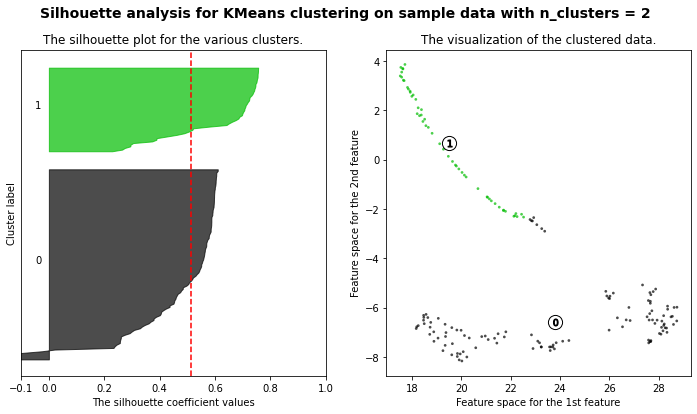

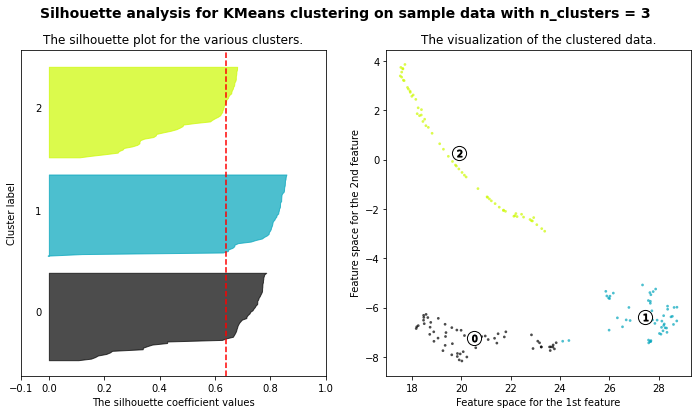

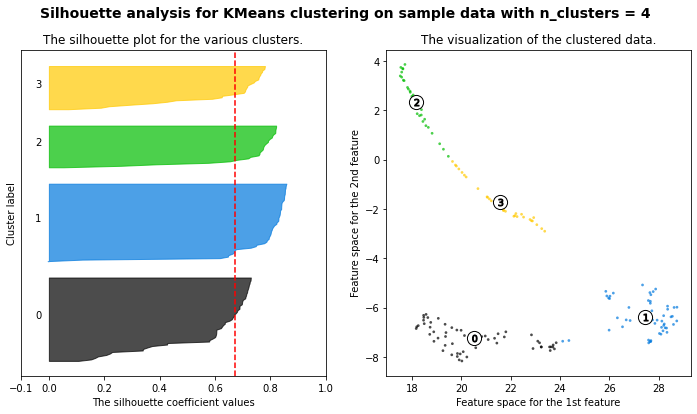

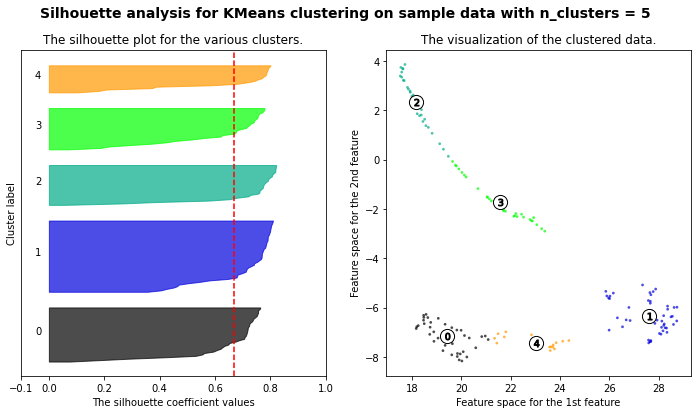

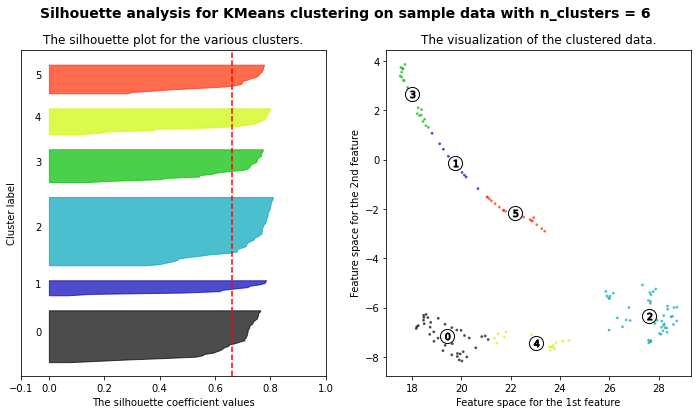

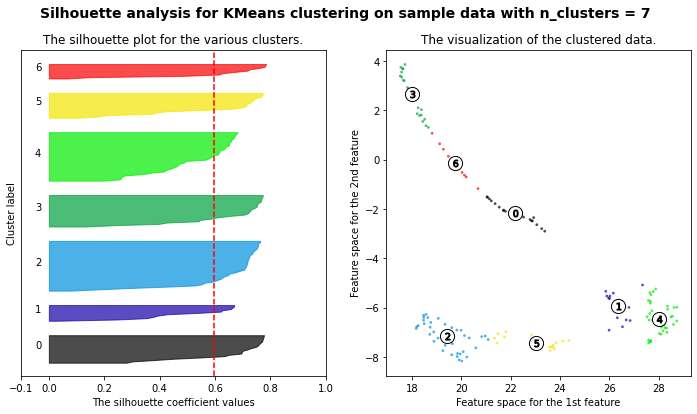

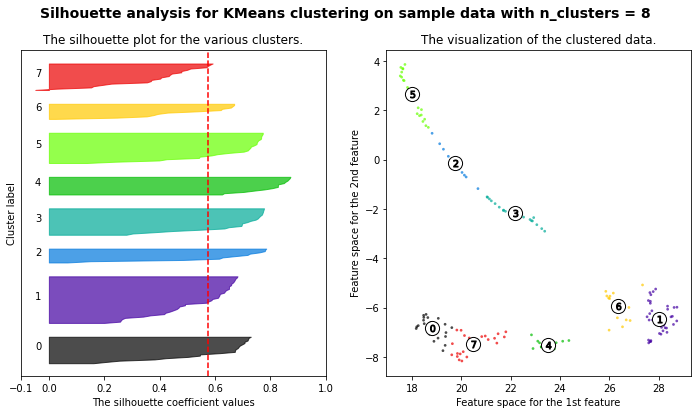

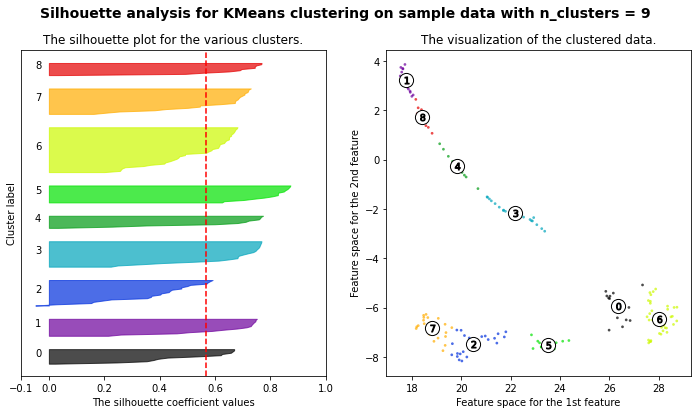

time: 3.11 s (started: 2022-12-10 01:49:55 -05:00)


In [29]:
silhouette(X_train, 10)

#### Optics

In [ ]:
X = X_train2
i = 1
range_ = np.arange(1, 0, -0.05)

fig = plt.figure(figsize=(15, 4*len(range_)))
fig.subplots_adjust(hspace=.15, wspace=.1)

for eps in range_:
    db = OPTICS(min_samples=10*X.shape[1], eps=eps, metric="euclidean").fit(X)
    labels = db.labels_
    
    # print(eps)
    ax = fig.add_subplot(len(range_)/2, 2, i)
    ax.set_title("eps = {}".format(round(eps, 3)), fontsize=14)
    sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=["Cluster: {}".format(x) for x in labels])
    
    i += 1

#### DBSCAN

In [ ]:
X = X_train
i = 1
range_ = np.arange(2, 0, -0.01)

fig = plt.figure(figsize=(15, 3*len(range_)))
fig.subplots_adjust(hspace=.15, wspace=.1)

for eps in range_:
    db = DBSCAN(eps=eps, min_samples=20, metric="euclidean").fit(X)
    core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
    core_samples_mask[db.core_sample_indices_] = True
    labels = db.labels_
    # print(labels)

    if len(np.unique(labels)) >= 2:
      # print(eps)
      ax = fig.add_subplot(len(range_)/2, 2, i)
      ax.set_title("eps = {}".format(round(eps, 3)), fontsize=14)
      sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=["Cluster: {}".format(x) for x in labels], s=50)
      
      i += 1

#### HDBSCAN, euclidean

/home/win7/Project/I.A./VirtualEnv_GE_3.6/lib/python3.6/site-packages/ipykernel_launcher.py:17: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

/home/win7/Project/I.A./VirtualEnv_GE_3.6/lib/python3.6/site-packages/ipykernel_launcher.py:17: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

/home/win7/Project/I.A./VirtualEnv_GE_3.6/lib/python3.6/site-packages/ipykernel_launcher.py:17: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

/home/win7/Project/I.A./VirtualEnv_GE_3.6/lib/python3.6/site-packages/ipykernel_launcher.py:17: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be

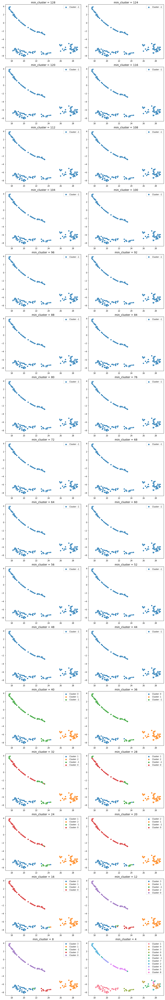

time: 5.62 s (started: 2022-12-10 01:50:14 -05:00)


In [30]:
# Select
X = X_train
i = 1
range_ = np.arange(128, 0, -4)

fig = plt.figure(figsize=(15, 3*len(range_)))
fig.subplots_adjust(hspace=.15, wspace=.1)

for min_cluster in range_:
    cluster = HDBSCAN(min_cluster_size=int(min_cluster), min_samples=None, core_dist_n_jobs=-1, 
                      allow_single_cluster=False)
    labels = cluster.fit_predict(X)
    # print(labels)

    if len(np.unique(labels)) >= 1:
      # print(min_cluster)
      ax = fig.add_subplot(len(range_)/2, 2, i)
      ax.set_title("min_cluster = {}".format(round(min_cluster, 2)), fontsize=14)
      sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=["Cluster: {}".format(x) for x in labels], s=50)
      
      i += 1

#### HDBSCAN, cosine

/home/win7/Project/I.A./VirtualEnv_GE_3.6/lib/python3.6/site-packages/ipykernel_launcher.py:20: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

/home/win7/Project/I.A./VirtualEnv_GE_3.6/lib/python3.6/site-packages/ipykernel_launcher.py:20: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

/home/win7/Project/I.A./VirtualEnv_GE_3.6/lib/python3.6/site-packages/ipykernel_launcher.py:20: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

/home/win7/Project/I.A./VirtualEnv_GE_3.6/lib/python3.6/site-packages/ipykernel_launcher.py:20: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be

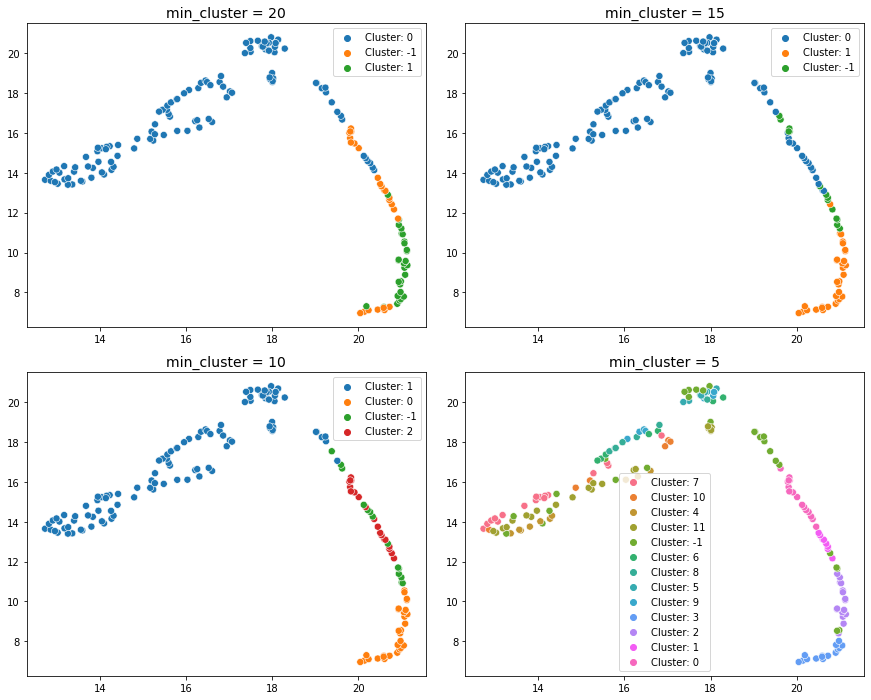

time: 1.09 s (started: 2022-12-08 20:30:40 -05:00)


In [ ]:
X = X_train
i = 1
range_ = np.arange(20, 0, -5)

fig = plt.figure(figsize=(15, 3*len(range_)))
fig.subplots_adjust(hspace=.15, wspace=.1)

for min_cluster in range_:
    pw_distance = pairwise_distances(X, metric="cosine", n_jobs=-1)
    # pw_distance = pairwise_kernels(X, metric="cosine", n_jobs=-1)
    # pw_distance = cosine_similarity(X)

    clusterer = HDBSCAN(min_cluster_size=int(min_cluster), metric='precomputed')
    clusterer.fit(pw_distance.astype('float64'))
    
    labels = clusterer.labels_

    if len(np.unique(labels)) >= 2:
      # print(eps)
      ax = fig.add_subplot(len(range_)/2, 2, i)
      ax.set_title("min_cluster = {}".format(round(min_cluster, 3)), fontsize=14)
      sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=["Cluster: {}".format(x) for x in labels], s=50)
      
      i += 1

### Training

#### HDBSCAN

In [30]:
""" clustering = HDBSCAN(min_cluster_size=24, min_samples=1, core_dist_n_jobs=-1, allow_single_cluster=False)
clustering.fit(X_train1)
node_embeddings_2d1["labels"] = clustering.labels_

clustering = HDBSCAN(min_cluster_size=4, min_samples=1, core_dist_n_jobs=-1, allow_single_cluster=False)
clustering.fit(X_train2)
node_embeddings_2d2["labels"] = clustering.labels_ """

clustering = HDBSCAN(min_cluster_size=16, min_samples=None, core_dist_n_jobs=-1, allow_single_cluster=False)
clustering.fit(X_train)
node_embeddings_2d["labels"] = clustering.labels_

time: 6.32 ms (started: 2022-12-10 01:52:22 -05:00)


#### K-means

In [ ]:
clustering = KMeans(n_clusters=2, init="k-means++", max_iter=300, random_state=42)
clustering.fit(X_train)
node_embeddings_2d["labels"] = clustering.labels_

time: 18.5 ms (started: 2022-12-08 21:36:38 -05:00)


### Clustering Visualization

In [31]:
# visualization_cluster_embeddings([node_embeddings_2d1, node_embeddings_2d2, node_embeddings_2d])
visualization_cluster_embeddings([node_embeddings_2d])

time: 46.4 ms (started: 2022-12-10 01:52:26 -05:00)


## Analysis

### Matching

In [ ]:
# matching(node_embeddings_2d1, node_embeddings_2d2, node_embeddings_2d)

In [ ]:
# df_ = get_node_class(node_embeddings_2d1, node_embeddings_2d2)
# df_.head(20)

### Common nodes

In [32]:
node_embeddings_2d_filter = node_embeddings_2d.copy() # node_embeddings_2d[node_embeddings_2d["labels"] != -1]
node_embeddings_2d_filter

# Check nodes by clusters in embedding global
clusters_ = np.array(list(zip(node_embeddings_2d_filter.index, node_embeddings_2d_filter["labels"])))
clusters_[:10]

clusters = []
for i, item in enumerate(clusters_.tolist()):
  clusters.append([item[0][1:], item[0][0], item[1]])

clusters = np.array(clusters)
clusters = clusters[clusters[:, 0].argsort()]
clusters = clusters[clusters[:, 2].argsort(kind="mergesort")]
# clusters = clusters[clusters[:, 1].argsort(kind="mergesort")]
clusters[:10]

commond_nodes = []

a = clusters[0]
for item in clusters[1:]:
  b = item
  if a[0] == b[0]:
    commond_nodes.append([a[0]])
    commond_nodes.append([b[0]])
  a = b
commond_nodes[:10]

intersection_raw1_raw2_ = np.unique(np.array(commond_nodes)[:,0])
intersection_raw1_raw2_

array(['251.0776', '307.0311', '317.2143', '323.0277', '338.9889',
       '441.3372', '545.3994', '611.144'], dtype='<U8')

time: 6.43 ms (started: 2022-12-10 01:52:37 -05:00)


In [ ]:
wt = ['101.0243', '113.0246', '118.9807', '151.0403', '153.0173',
       '166.0506', '173.0454', '71.0139', '85.0296', '87.0086', '89.0245']

time: 553 µs (started: 2022-12-09 00:18:34 -05:00)


In [ ]:
#@title Aux script
# Get set for Raw data
set1_ = ['131.0824', '186.1139', '316.2857', '338.9889', '346.0558', '347.0589', '362.0509', '365.0531', '367.0185', '388.9441', '397.1319', '401.0173', '426.0221','441.3372','489.9937', '505.9889', '521.984', '545.3994', '604.0696', '606.0744','611.144', '664.117', '665.2139', '766.1076', '784.1495','808.118']
set2_ = intersection_raw1_raw2_

set1 = set(set1_)
set2 = set(set2_)

# Intersection Raw data
intersection = np.array(list(set1 & set2))
print(sorted(intersection))

# Difference Raw data
diff = np.array(list(set1 - set2))
print(sorted(diff))

# Difference Raw data
diff = np.array(list(set2 - set1))
print(sorted(diff))

In [ ]:
#@title Aux script
# Get set for Raw data
set1_ = ['131.0355', '131.0824', '151.0403', '165.0554', '166.0506',
       '173.0454', '186.1139', '251.0776', '279.2331', '307.0311',
       '317.2143', '441.3372', '545.3994', '59.0137', '604.0696',
       '71.0139', '85.0296', '87.0086', '88.0405', '89.0245']

set2_ = ['131.0355', '131.0824', '151.0403', '165.0554', '166.0506',
       '168.0663', '173.0454', '173.0711', '186.1139', '211.0603',
       '251.0776', '266.0886', '279.2331', '307.0311', '317.2143',
       '397.1319', '401.0173', '426.0221', '441.3372', '489.9937',
       '505.9889', '521.984', '545.3994', '59.0137', '604.0696',
       '606.0744', '611.144', '664.117', '665.2139', '71.0139',
       '766.1076', '784.1495', '808.118', '85.0296', '87.0086', '88.0405',
       '89.0245']

set3_ = ['131.0355', '131.0824', '151.0403', '165.0554', '166.0506',
       '173.0454', '186.1139', '251.0776', '279.2331', '307.0311',
       '317.2143', '441.3372', '545.3994', '59.0137', '604.0696',
       '71.0139', '85.0296', '87.0086', '88.0405', '89.0245']

set4_ = ['131.0355', '131.0824', '151.0403', '165.0554', '166.0506',
       '186.1139', '251.0776', '279.2331', '307.0311', '317.2143',
       '441.3372', '545.3994', '59.0137', '71.0139', '85.0296', '87.0086',
       '88.0405', '89.0245']

set5_ = ['131.0355', '131.0824', '151.0403', '165.0554', '166.0506',
       '168.0663', '173.0454', '173.0711', '186.1139', '251.0776',
       '266.0886', '279.2331', '307.0311', '317.2143', '441.3372',
       '545.3994', '59.0137', '604.0696']

set1 = set(set1_)
set2 = set(set2_)
set3 = set(set3_)
set4 = set(set4_)
set5 = set(set5_)

# Intersection Raw data
intersection = np.array(list(set1 & set2 & set3 & set4 & set5))
print(sorted(intersection))

In [ ]:
# Get set for Raw data
set1_ = ['101.0243', '102.0562', '109.0407', '113.0246', '115.0038', '117.0195', '118.051',
			'118.9807', '145.0144', '145.0984', '147.0655', '151.0403', '152.0354', '153.0173', '165.0554', 
			'166.0506', '173.0454', '179.0348', '266.0886', '59.0137', '71.0139', '74.0249', '808.118', '85.0296', 
			'87.0086', '88.0405', '89.0245']

set2_ = ['131.0355', '131.0824', '151.0403', '165.0554', '166.0506', '186.1139', '251.0776', 
			'279.2331', '307.0311', '317.2143', '441.3372', '545.3994', '59.0137']

set1 = set(set1_)
set2 = set(set2_)

# Intersection Raw data
intersection = np.array(list(set1 & set2 ))
print(sorted(intersection))

### Graph visualization

In [ ]:
base = 100
weight = 100

""" node_size1 = []
for node_id in node_embeddings_2d1.index:
  node_size1.append(base + weight * G1.degree(node_id))

node_size2 = []
for node_id in node_embeddings_2d2.index:
  node_size2.append(base + weight * G2.degree(node_id)) """

node_size = []
for node_id in node_embeddings_2d.index:
  node_size.append(base + weight * G.degree(node_id))


time: 3.25 ms (started: 2022-11-15 22:02:33 +00:00)


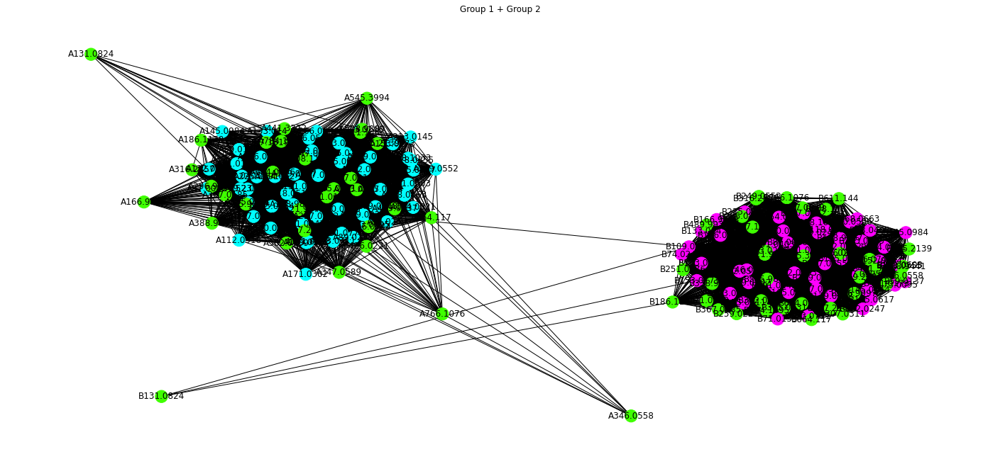

time: 2.79 s (started: 2022-11-15 22:02:34 +00:00)


In [ ]:
# cmap = plt.get_cmap("viridis")

fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(25, 25))

""" cmap = ListedColormap(list(np.array(colors)[np.unique(node_embeddings_2d1["labels"])]))
nx.draw(G1, pos=nx.spring_layout(G1, k=0.10, seed=42), nodelist=list(map(str, node_embeddings_2d1.index)),
        edgecolors="black", font_size=8, with_labels=True, 
        node_color=node_embeddings_2d1["labels"], cmap=cmap, ax=axes[0])
axes[0].set_title("Raw data: 111-125")

cmap = ListedColormap(list(np.array(colors)[np.unique(node_embeddings_2d2["labels"])]))
nx.draw(G2, pos=nx.spring_layout(G2, k=0.10, seed=42), nodelist=list(map(str, node_embeddings_2d2.index)),
        edgecolors="black", font_size=8, with_labels=True, 
        node_color=node_embeddings_2d2["labels"], cmap=cmap, ax=axes[1])
axes[1].set_title("Raw data: 411-425") """

cmap = ListedColormap(list(np.array(colors)[np.unique(node_embeddings_2d["labels"])]))
nx.draw(G, pos=nx.spring_layout(G, iterations=12, seed=42), nodelist=list(map(str, node_embeddings_2d.index)),
        with_labels=True, node_color=node_embeddings_2d["labels"], cmap=cmap, ax=axes[0])
axes[0].set_title("Group 1 + Group 2")

axes[1].remove()

In [ ]:
#@title Colors

%%html
<style>
    div {
      width: 50%;
    }
    .div-1 {
        background-color: #FF00FF;
    }
    
    .div-2 {
    	background-color: #3FFF00;
    }
    
    .div-3 {
    	background-color: #00FFFF;
    }
    .div-4 {
    	background-color: #FFF700;
    }
</style>

<body>
    <div class="div-1"> 0 </div>
    <div class="div-2"> 1 </div>
    <div class="div-3"> 2 </div>
    <div class="div-4"> 3 </div>
</body>

time: 7.64 ms (started: 2022-11-13 15:27:58 +00:00)


## Filter data

### Sub graph visualization

In [ ]:
intersection_raw1_raw2_

array(['131.0824', '186.1139', '296.9997', '307.0311', '316.2857',
       '317.2143', '323.0277', '338.9889', '346.0558', '347.0589',
       '362.0509', '365.0531', '367.0185', '388.9441', '397.1319',
       '401.0173', '426.0221', '441.3372', '489.9937', '505.9889',
       '521.984', '545.3994', '604.0696', '606.0744', '611.144',
       '664.117', '665.2139', '766.1076', '784.1495', '808.118'],
      dtype='<U8')

time: 6.25 ms (started: 2022-11-15 22:02:50 +00:00)


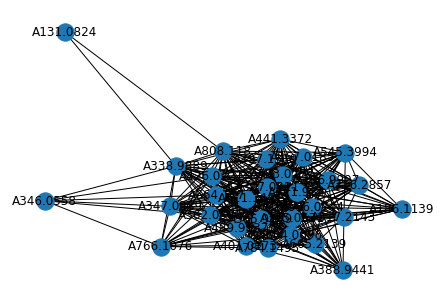

time: 504 ms (started: 2022-11-15 22:02:52 +00:00)


In [ ]:
nodes_g1 = []
for node_id in intersection_raw1_raw2_:
  nodes_g1.append("A" + node_id)

SG1 = G.subgraph(nodes_g1)
nx.draw(SG1, with_labels=True)

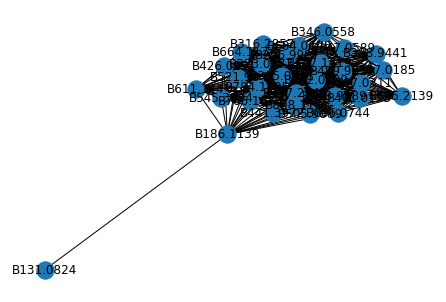

time: 1.13 s (started: 2022-11-15 22:02:54 +00:00)


In [ ]:
nodes_g2 = []
for node_id in intersection_raw1_raw2_:
  nodes_g2.append("B" + node_id)

SG2 = G.subgraph(nodes_g2)
nx.draw(SG2, with_labels=True)

In [ ]:
print(nx.info(SG1))
print(nx.info(SG2))

Graph with 30 nodes and 345 edges
Graph with 30 nodes and 394 edges
time: 15.6 ms (started: 2022-11-15 22:02:57 +00:00)


In [ ]:
edges, weights  = zip(*nx.get_edge_attributes(SG1, "weight").items())
print(min(weights))

edges, weights  = zip(*nx.get_edge_attributes(SG2, "weight").items())
print(min(weights))

edges, weights  = zip(*nx.get_edge_attributes(G, "weight").items())
print(min(weights))

0.5008014161343037
0.5074051351825869
0.5
time: 43.4 ms (started: 2022-11-15 22:03:01 +00:00)


### Get common nodes with changes

In [ ]:
# Get changes by commond node
changes = []

v1 = []
v2 = []
w1 = []
w2 = []

for comm_node_id in intersection_raw1_raw2_:
  # print("Node id:", node_id_comm)

  e1 = []
  e2 = []

  node_id = "A" + comm_node_id
  neighbors1 = sorted(list(G.neighbors(node_id)))
  for node_id_ in neighbors1:
    w = G.get_edge_data(node_id, node_id_)["weight"]
    e1.append([node_id, node_id_, round(w, 2)])
    
  node_id = "B" + comm_node_id
  neighbors2 = sorted(list(G.neighbors(node_id)))
  for node_id_ in neighbors2:
    w = G.get_edge_data(node_id, node_id_)["weight"]
    e2.append([node_id, node_id_, round(w, 2)])
  
  # Searching
  # print(e1)
  # print(e2)
  for item1 in e1:
    for item2 in e2:
      if item1[0][1:] == item2[0][1:] and item1[1][1:] == item2[1][1:]: # and item1[0] < item1[1]:
        changes.append([item1[0][1:], item2[1][1:], item1[2], item2[2]])
        break

df_changes = pd.DataFrame(changes, columns=["Node u", "Node v", "Weight1", "Weight2"])
df_changes["Difference"] = df_changes["Weight1"] - df_changes["Weight2"]
df_changes["Difference"] = df_changes["Difference"].abs()

time: 118 ms (started: 2022-11-15 22:03:05 +00:00)


In [ ]:
df_changes

,Node u,Node v,Weight1,Weight2,Difference
0,184.0021,101.0243,0.76,0.92,0.16
1,184.0021,102.0562,0.89,0.95,0.06
2,184.0021,109.0407,0.84,0.94,0.10
3,184.0021,112.0518,0.68,0.60,0.08
4,184.0021,113.0246,0.73,0.97,0.24
...,...,...,...,...,...
2964,808.118,784.1495,0.85,0.96,0.11
2965,808.118,85.0296,0.63,0.93,0.30
2966,808.118,87.0086,0.64,0.93,0.29
2967,808.118,88.0405,0.66,0.94,0.28


time: 20.8 ms (started: 2022-11-15 16:00:39 +00:00)


In [ ]:
# Save
# df_changes.to_csv("{}/Outputs/Changes/df_new_changes_05_04.csv".format(dir), index=False)

time: 578 ms (started: 2022-10-25 22:56:43 +00:00)


In [ ]:
# Read
# df_changes = pd.read_csv("{}/Outputs/Changes/df_new_changes_05_04.csv".format(dir), index_col="Unnamed: 0")
# df_changes

In [ ]:
df_changes_filter = df_changes.loc[df_changes["Difference"] >= 0.3] # >= 0.4
df_changes_filter

,Node u,Node v,Weight1,Weight2,Difference
102,296.9997,338.9889,0.57,0.87,0.30
159,307.0311,166.9758,0.52,0.83,0.31
261,316.2857,397.1319,0.52,0.83,0.31
354,317.2143,808.118,0.54,0.91,0.37
389,323.0277,166.9758,0.57,0.87,0.30
...,...,...,...,...,...
2056,808.118,317.2143,0.54,0.91,0.37
2063,808.118,397.1319,0.55,0.94,0.39
2076,808.118,71.0139,0.63,0.93,0.30
2080,808.118,85.0296,0.63,0.93,0.30


time: 54.1 ms (started: 2022-11-15 22:03:10 +00:00)


### Common nodes visualization

In [ ]:
# Plot common node id

for comm_node_id in intersection_raw1_raw2_:
  # print("Node id:", node_id)
  fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20, 10))
  axes = axes.flatten()

  G1_ = nx.Graph()
  G2_ = nx.Graph()

  e1 = []
  c1 = []

  e2 = []
  c2 = []
  
  node_id = "A" + comm_node_id
  neighbors1 = sorted(list(G.neighbors(node_id)))
  for node_id_ in neighbors1:
    w = G.get_edge_data(node_id, node_id_)["weight"]
    e1.append([node_id, node_id_, round(w, 2)])
    if w >= 0:
      c1.append("red")
    else:
      c1.append("blue")
  G1_.add_weighted_edges_from(e1)

  node_id = "B" + comm_node_id
  neighbors2 = sorted(list(G.neighbors(node_id)))
  for node_id_ in neighbors2:
    w = G.get_edge_data(node_id, node_id_)["weight"]
    e2.append([node_id, node_id_, round(w, 2)])
    if w >= 0:
      c2.append("red")
    else:
      c2.append("blue")
  G2_.add_weighted_edges_from(e2)
  
  # Plot
  pos = nx.circular_layout(G1_)
  # pos = nx.spring_layout(G1_)
  nx.draw(G1_, pos, edge_color=c1, with_labels=True, node_color="orange", ax=axes[0])
  labels1=nx.get_edge_attributes(G1_, "weight")
  colors1={e: G1_.edges[e]['weight'] for e in G1_.edges}
  nx.draw_networkx_edge_labels(G1_, pos, edge_labels=labels1, ax=axes[0])
  axes[0].set_title("Group 1")

  pos = nx.circular_layout(G2_)
  # pos = nx.kamada_kawai_layout(G2_)
  nx.draw(G2_, pos, edge_color=c2, with_labels=True, node_color="orange", ax=axes[1])
  labels2=nx.get_edge_attributes(G2_, "weight")
  nx.draw_networkx_edge_labels(G2_, pos, edge_labels=labels2, ax=axes[1])
  axes[1].set_title("Group 2")

### Get kind of changes

In [ ]:
# Detect kind of change
threshold = 0.8
df_kind_changes = df_changes_filter.copy()
conditions = [
    ((df_kind_changes["Weight1"] < 0) & (df_kind_changes["Weight2"] > 0) & (df_kind_changes["Weight1"] > -threshold) & (df_kind_changes["Weight2"] < threshold)),
    ((df_kind_changes["Weight1"] < 0) & (df_kind_changes["Weight2"] > 0) & (df_kind_changes["Weight1"] > -threshold) & (df_kind_changes["Weight2"] >= threshold)),
    ((df_kind_changes["Weight1"] < 0) & (df_kind_changes["Weight2"] > 0) & (df_kind_changes["Weight1"] <= -threshold) & (df_kind_changes["Weight2"] < threshold)),
    ((df_kind_changes["Weight1"] < 0) & (df_kind_changes["Weight2"] > 0) & (df_kind_changes["Weight1"] <= -threshold) & (df_kind_changes["Weight2"] >= threshold)),

    ((df_kind_changes["Weight1"] > 0) & (df_kind_changes["Weight2"] < 0) & (df_kind_changes["Weight1"] < threshold) & (df_kind_changes["Weight2"] > -threshold)),
    ((df_kind_changes["Weight1"] > 0) & (df_kind_changes["Weight2"] < 0) & (df_kind_changes["Weight1"] >= threshold) & (df_kind_changes["Weight2"] > -threshold)),
    ((df_kind_changes["Weight1"] > 0) & (df_kind_changes["Weight2"] < 0) & (df_kind_changes["Weight1"] < threshold) & (df_kind_changes["Weight2"] <= -threshold)),
    ((df_kind_changes["Weight1"] > 0) & (df_kind_changes["Weight2"] < 0) & (df_kind_changes["Weight1"] >= threshold) & (df_kind_changes["Weight2"] <= -threshold)),

    ((df_kind_changes["Weight1"] > 0) & (df_kind_changes["Weight2"] > 0) & (df_kind_changes["Weight1"] >= threshold) & (df_kind_changes["Weight2"] >= threshold)),
    ((df_kind_changes["Weight1"] > 0) & (df_kind_changes["Weight2"] > 0) & (df_kind_changes["Weight1"] < threshold) & (df_kind_changes["Weight2"] < threshold)),
    ((df_kind_changes["Weight1"] > 0) & (df_kind_changes["Weight2"] > 0) & (df_kind_changes["Weight1"] >= threshold) & (df_kind_changes["Weight2"] < threshold)),
    ((df_kind_changes["Weight1"] > 0) & (df_kind_changes["Weight2"] > 0) & (df_kind_changes["Weight1"] < threshold) & (df_kind_changes["Weight2"] >= threshold)),

    ((df_kind_changes["Weight1"] < 0) & (df_kind_changes["Weight2"] < 0) & (df_kind_changes["Weight1"] <= -threshold) & (df_kind_changes["Weight2"] <= -threshold)),
    ((df_kind_changes["Weight1"] < 0) & (df_kind_changes["Weight2"] < 0) & (df_kind_changes["Weight1"] > -threshold) & (df_kind_changes["Weight2"] > -threshold)),
    ((df_kind_changes["Weight1"] < 0) & (df_kind_changes["Weight2"] < 0) & (df_kind_changes["Weight1"] <= -threshold) & (df_kind_changes["Weight2"] > -threshold)),
    ((df_kind_changes["Weight1"] < 0) & (df_kind_changes["Weight2"] < 0) & (df_kind_changes["Weight1"] > -threshold) & (df_kind_changes["Weight2"] <= -threshold)),
]
values = ["np", "nP", "Np", "NP", "pn", "Pn", "pN", "PN", "PP", "pp", "Pp", "pP", "NN", "nn", "Nn", "nN"]
df_kind_changes["Kind change"] = np.select(conditions, values)
df_kind_changes

,Node u,Node v,Weight1,Weight2,Difference,Kind change
102,296.9997,338.9889,0.57,0.87,0.30,pP
159,307.0311,166.9758,0.52,0.83,0.31,pP
261,316.2857,397.1319,0.52,0.83,0.31,pP
354,317.2143,808.118,0.54,0.91,0.37,pP
389,323.0277,166.9758,0.57,0.87,0.30,pP
...,...,...,...,...,...,...
2056,808.118,317.2143,0.54,0.91,0.37,pP
2063,808.118,397.1319,0.55,0.94,0.39,pP
2076,808.118,71.0139,0.63,0.93,0.30,pP
2080,808.118,85.0296,0.63,0.93,0.30,pP


time: 50 ms (started: 2022-11-15 22:03:21 +00:00)


In [ ]:
# Counting frequencies node U
df_temp1 = df_changes_filter["Node u"].value_counts(ascending=False, dropna=False)
df_temp1 = df_temp1.to_frame()
df_temp1.reset_index(drop=False, inplace=True)
df_temp1.columns = ["Node id", "Count"]

print(len(df_temp1), sum(df_temp1["Count"].values))
df_temp1[:10]

23 87


,Node id,Count
0,808.118,19
1,766.1076,13
2,441.3372,9
3,338.9889,6
4,397.1319,6
5,347.0589,5
6,426.0221,4
7,545.3994,3
8,784.1495,3
9,323.0277,2


time: 17.3 ms (started: 2022-11-15 22:03:24 +00:00)


In [ ]:
# Counting frequencies node V
df_temp2 = df_changes_filter["Node v"].value_counts(ascending=False, dropna=False)
df_temp2 = df_temp2.to_frame()
df_temp2.reset_index(drop=False, inplace=True)
df_temp2.columns = ["Node id", "Count"]

print(len(df_temp2), sum(df_temp2["Count"].values))
df_temp2[:10]

50 87


,Node id,Count
0,766.1076,6
1,166.9758,5
2,397.1319,4
3,89.0245,4
4,179.0561,4
5,441.3372,3
6,113.0246,3
7,338.9889,3
8,225.0991,3
9,365.0531,2


time: 20.2 ms (started: 2022-11-15 22:03:27 +00:00)


In [ ]:
# Join frequencies for Node u and Node v
df_frequencies = pd.concat([df_temp1, df_temp2])
df_frequencies.sort_values(by=["Count"], ascending=False, inplace=True)
df_frequencies.drop_duplicates(inplace=True)
df_frequencies

,Node id,Count
0,808.118,19
1,766.1076,13
2,441.3372,9
3,338.9889,6
4,397.1319,6
...,...,...
24,168.0663,1
25,151.0403,1
26,266.0886,1
27,173.0454,1


time: 31.8 ms (started: 2022-11-15 22:03:30 +00:00)


In [ ]:
# Save
# df_frequencies.to_csv("{}/df_new_node_degree_05_04.csv".format(dir), index=True)

time: 504 µs (started: 2022-10-26 14:04:14 +00:00)


In [ ]:
# Get changes accorinng to most frequencies node
list_node_frequencies = np.unique(df_frequencies["Node id"].values)
print(len(list_node_frequencies))
list_node_frequencies

54


array(['109.0407', '113.0246', '115.0038', '118.9807', '129.0192',
       '130.0506', '135.0311', '145.0144', '145.0617', '147.0297',
       '151.0403', '153.0173', '154.062', '165.0554', '166.0506',
       '166.9758', '168.0663', '173.0095', '173.0454', '173.0711',
       '179.0348', '179.0561', '184.0021', '225.0991', '249.0552',
       '251.0776', '259.0227', '266.0886', '296.9997', '307.0311',
       '316.2857', '317.2143', '323.0277', '338.9889', '346.0558',
       '347.0589', '362.0509', '365.0531', '388.9441', '397.1319',
       '401.0173', '426.0221', '441.3372', '505.9889', '521.984',
       '545.3994', '604.0696', '664.117', '71.0139', '766.1076',
       '784.1495', '808.118', '85.0296', '89.0245'], dtype=object)

time: 9.41 ms (started: 2022-11-15 22:03:33 +00:00)


### Get metadata

In [ ]:
# Get metabolite name by node id
list_metabolite = df_meta.loc[list_node_frequencies, ["Metabolites - Approved by Nicola", "Chemical Formula (based on BioCyc)"]]
# list_metabolite["Alignment ID"] = list_metabolite.index.values
list_metabolite.head()

,Metabolites - Approved by Nicola,Chemical Formula (based on BioCyc)
Corrected (m/z),,
109.0407,Acetylimidazole,C5H6N2O
113.0246,C5H6O3,C5H6O3
115.0038,Fumaric acid / Maleic acid,C4H4O4
118.9807,Methylthiopropionic acid,C4H8O2S
129.0192,Acetylpyruvate,C5H6O4


time: 18.5 ms (started: 2022-11-15 22:03:36 +00:00)


In [ ]:
# Save
# list_metabolite.to_csv("{}/Outputs/Metabolites/df_new_names_05_04.csv".format(dir), index=True)

time: 1.11 s (started: 2022-10-26 14:04:14 +00:00)


In [ ]:
# list_metabolite = pd.read_csv("{}/Outputs/Metabolites/df_new_names_05_04.csv".format(dir), index_col="Alignment ID")
# list_metabolite

time: 634 µs (started: 2022-10-26 14:04:15 +00:00)


In [ ]:
list_metabolite_formula = list_metabolite.loc[pd.notnull(list_metabolite["Chemical Formula (based on BioCyc)"])]
list_metabolite_no_formula = list_metabolite.loc[~pd.notnull(list_metabolite["Chemical Formula (based on BioCyc)"])]

list_metabolite_formula.head()

,Metabolites - Approved by Nicola,Chemical Formula (based on BioCyc)
Corrected (m/z),,
109.0407,Acetylimidazole,C5H6N2O
113.0246,C5H6O3,C5H6O3
115.0038,Fumaric acid / Maleic acid,C4H4O4
118.9807,Methylthiopropionic acid,C4H8O2S
129.0192,Acetylpyruvate,C5H6O4


time: 28 ms (started: 2022-11-15 22:03:39 +00:00)


In [ ]:
# Search one node
list_metabolite.loc["766.1076"]

Metabolites - Approved by Nicola          Coenzyme A
Chemical Formula (based on BioCyc)    C21H36N7O16P3S
Name: 766.1076, dtype: object

time: 9.33 ms (started: 2022-11-15 22:03:44 +00:00)


## Plot graph using metadata

### Global

In [ ]:
edges_w = df_kind_changes[["Node u", "Node v", "Kind change"]].values.tolist()
edges_w[:10]

[['296.9997', '338.9889', 'pP'],
 ['307.0311', '166.9758', 'pP'],
 ['316.2857', '397.1319', 'pP'],
 ['317.2143', '808.118', 'pP'],
 ['323.0277', '166.9758', 'pP'],
 ['323.0277', '766.1076', 'pP'],
 ['338.9889', '153.0173', 'pP'],
 ['338.9889', '179.0561', 'pP'],
 ['338.9889', '225.0991', 'pP'],
 ['338.9889', '296.9997', 'pP']]

time: 10.2 ms (started: 2022-11-15 22:03:46 +00:00)


54
['pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP', 'pP']


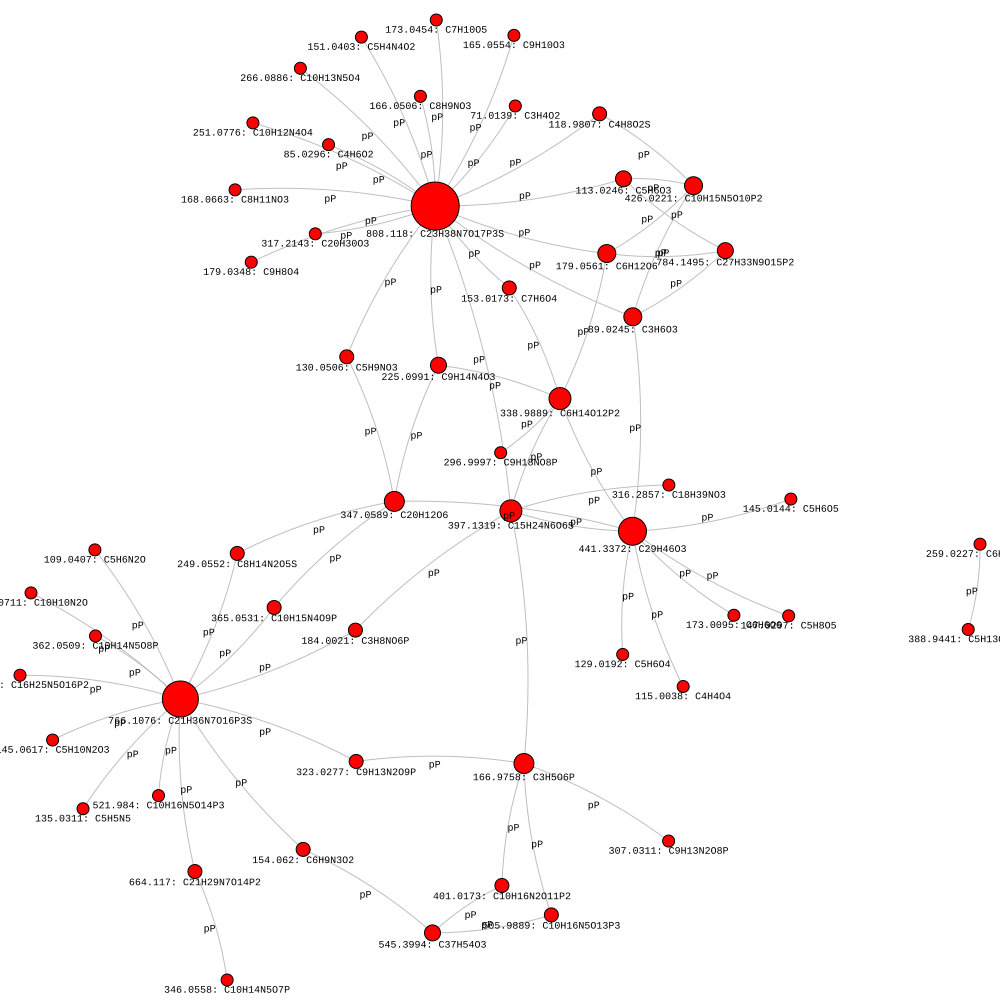

time: 144 ms (started: 2022-11-15 22:03:56 +00:00)


In [ ]:
# Plot using all nodes with Formula

edges_tuples = [(str(x[0]), str(x[1]), x[2]) for x in edges_w]
# print(edges_tuples)
IG = ig.Graph.TupleList(edges_tuples, directed=False, weights=True)
print(len(IG.vs["name"]))
print(IG.es["weight"])

IG = IG.simplify(combine_edges="first")

# remove null Formula nodes
""" # delete_ids = [g2.vs["name"].index(node_id) for node_id in list_metabolite_no_formula.index.values if node_id in g2.vs["name"]]
delete_ids = np.where(np.isin(g2.vs["name"], list_metabolite_no_formula.index.values))[0]
g2.delete_vertices(delete_ids)
print(len(g2.vs["name"])) """

# remove low degree nodes
""" delete_ids = [v.index for v in g2.vs if v.degree() == 0]
g2.delete_vertices(delete_ids)
print(len(g2.vs["name"]))
print(g2.summary()) """

formula = ["{}: {}".format(thing[0], thing[1]) for thing in zip(IG.vs["name"],
                                                                list_metabolite_formula["Chemical Formula (based on BioCyc)"].loc[IG.vs["name"]].values)]
IG.vs["formula"] = formula
# g2.es["weights"] = df_kind_changes["Kind change"].values # df_kind_change["Kind change"].filter(items=g2.vs["name"], axis=0).values # label edges

layout = IG.layout_fruchterman_reingold()
# layout = IG.layout_davidson_harel()
# layout = IG.layout_lgl()

visual_style={}
visual_style["bbox"] = (1000, 1000)
visual_style["vertex_size"] = 10
visual_style["vertex_size"] = [10 + w * 2 for w in IG.degree()]
visual_style["vertex_label"] = IG.vs["formula"]

visual_style["labels"] = IG.vs["name"]
# visual_style["vertex_label_color"] = "red"
visual_style["vertex_label_dist"] =1
visual_style["vertex_label_size"] = 10
visual_style["edge_label"] = IG.es["weight"] # g2.es["weights"]
visual_style["edge_color"] = "grey"
visual_style["edge_width"] = 1
visual_style["edge_label_size"] = 10
visual_style["edge_curved"] = 0.1
# visual_style["edge_curved"] = [False] * g2.ecount()
# visual_style["edge_label_color"] = "red"

""" fig, ax = plt.subplots(figsize=(30, 30))
ig.plot(g2, layout=layout, target=ax, **visual_style)
plt.axis("off") """

ig.plot(IG, layout=layout, **visual_style, target="graph_new_full.pdf")

### Clustering

Dendrogram, 54 elements, 52 merges
Clustering with 54 elements and 7 clusters
[7, 7, 12, 14, 6, 6, 2]
IGRAPH UNW- 14 14 --
+ attr: formula (v), name (v), weight (e)
+ edges (vertex names):
766.1076--664.117, 346.0558--664.117, 347.0589--130.0506, 766.1076--249.0552,
347.0589--249.0552, 766.1076--365.0531, 347.0589--365.0531,
766.1076--362.0509, 766.1076--521.984, 766.1076--604.0696, 766.1076--109.0407,
766.1076--135.0311, 766.1076--145.0617, 766.1076--173.0711
[0, 0, 1, 1, 0, 0, 2, 2, 1, 3, 0, 4, 0, 5, 3, 3, 3, 3, 3, 3, 3, 6, 6, 0, 1, 1, 4, 4, 4, 4, 5, 5, 5, 5, 5, 1, 3, 1, 3, 3, 3, 3, 3, 4, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2]


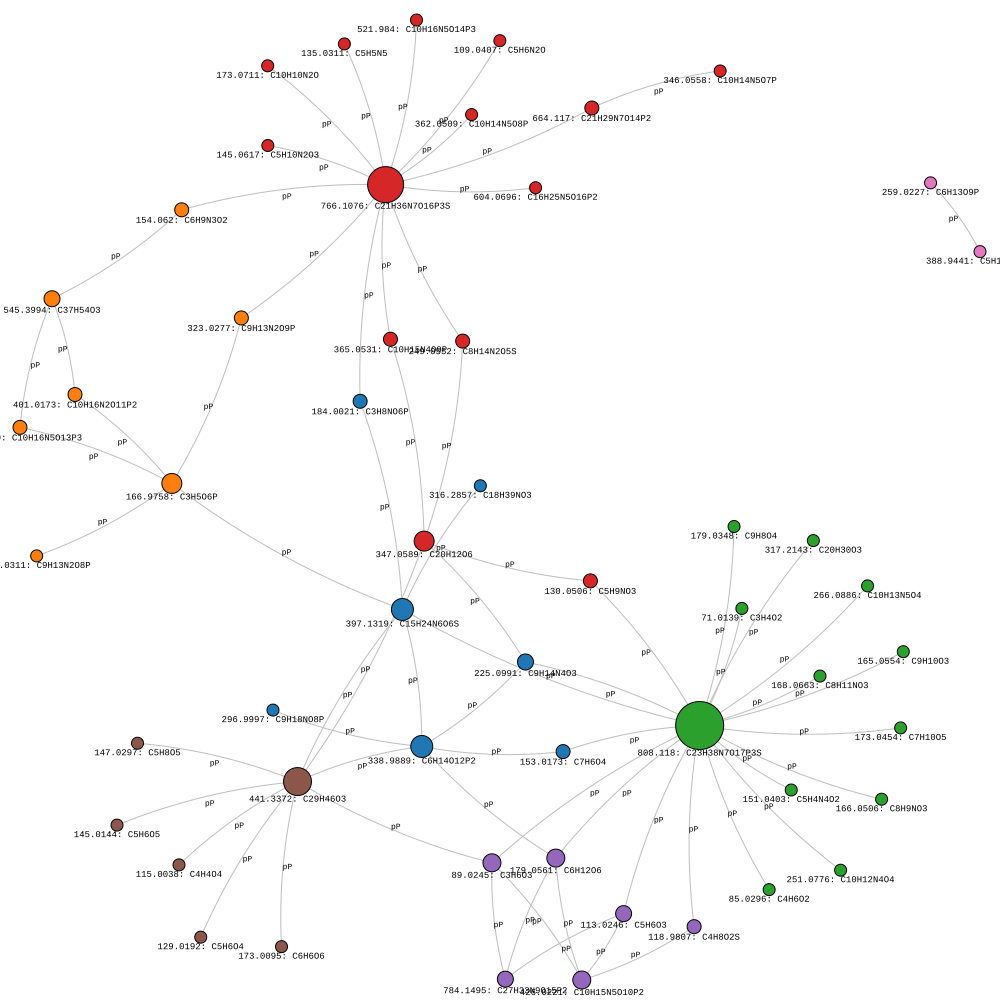

time: 76.5 ms (started: 2022-11-15 22:04:05 +00:00)


In [ ]:
dend_k = IG.community_fastgreedy()
clusters_k = dend_k.as_clustering()
nodes_membership = clusters_k.membership

print(dend_k.summary())
print(clusters_k.summary())
print(clusters_k.sizes())
print(clusters_k.giant())
print(nodes_membership)

palette = sns.color_palette("tab10", len(clusters_k.sizes()), 1)

layout = IG.layout_fruchterman_reingold()
# layout = IG.layout_davidson_harel()
# layout = IG.layout_lgl()
# layout = IG.layout_star()
# layout = IG.layout_graphopt()
# layout = IG.layout_reingold_tilford()
# layout = IG.layout_sugiyama()

visual_style={}
visual_style["bbox"] = (1000, 1000)
visual_style["vertex_size"] = 10
visual_style["vertex_color"] = [palette[m] for m in nodes_membership]
visual_style["vertex_size"] = [10 + w * 2 for w in IG.degree()]

#visual_style["vertex_label"] = [p.get_pinyin(n, "",tone_marks='numbers') for n in g2.vs['name']]
visual_style["vertex_label"] = IG.vs["formula"]
visual_style["labels"] = IG.vs["name"]
visual_style["vertex_label_dist"] =1
visual_style["vertex_label_size"]= 9
#visual_style["vertex_label_size"] = [12 if vd>6 else 6 for vd in v_degree]
#visual_style["vertex_shape"] = "circle"
visual_style["edge_label"] = IG.es["weight"]
visual_style["edge_color"] = "grey"
visual_style["edge_width"] = 1
visual_style["edge_label_size"] = 8
visual_style["edge_curved"] = 0.1

""" fig, ax = plt.subplots(figsize=(30, 30))
ig.plot(g2, layout=layout, target=ax, **visual_style)
plt.axis("off") """

ig.plot(IG, layout=layout, **visual_style, target="graph_new_full_cluster.pdf")

## BioCyc

### Get information from clusters

In [ ]:
# Get formula by node id into clusters
df_cluster_formula = pd.DataFrame()
for k in range(len(clusters_k.sizes())):
  before = df_process1[clusters_k.subgraph(k).vs["name"]].mean(axis=0).values
  after = df_process2[clusters_k.subgraph(k).vs["name"]].mean(axis=0).values

  additional = pd.DataFrame({"Cluster {}: {}".format(k + 1, "Alignment"): clusters_k.subgraph(k).vs["name"],
                             # "Cluster {}: {}".format(k + 1, "INCHIKEY"): list_metabolite_formula["INCHIKEY"].loc[clusters_k.subgraph(k).vs["name"]].values,
                             # "Cluster {}: {}".format(k + 1, "Average Rt(min)"): list_metabolite_formula["Average Rt(min)"].loc[clusters_k.subgraph(k).vs["name"]].values,
                             "Cluster {}: {}".format(k + 1, "Formula"): list_metabolite_formula["Chemical Formula (based on BioCyc)"].loc[clusters_k.subgraph(k).vs["name"]].values,
                             # "Cluster {}: {}".format(k + 1, "Daltons"): list_metabolite_formula["Formula"].loc[clusters_k.subgraph(k).vs["name"]].apply(lambda formula: get_daltons(formula)),
                             "Cluster {}: {}".format(k + 1, "Before"): np.log10(before),
                             "Cluster {}: {}".format(k + 1, "After"): np.log10(after),
                             "Cluster {}: {}".format(k + 1, "Ratio"): np.log10(np.divide(after, before))
                             })
  df_cluster_formula = pd.concat([df_cluster_formula, additional], axis=1)
  
df_cluster_formula

,Cluster 1: Alignment,Cluster 1: Formula,Cluster 1: Before,Cluster 1: After,Cluster 1: Ratio,Cluster 2: Alignment,Cluster 2: Formula,Cluster 2: Before,Cluster 2: After,Cluster 2: Ratio,...,Cluster 6: Alignment,Cluster 6: Formula,Cluster 6: Before,Cluster 6: After,Cluster 6: Ratio,Cluster 7: Alignment,Cluster 7: Formula,Cluster 7: Before,Cluster 7: After,Cluster 7: Ratio
0,296.9997,C9H18NO8P,3.558299,3.896102,0.337802,307.0311,C9H13N2O8P,3.402969,3.557602,0.154633,...,441.3372,C29H46O3,3.792341,3.907998,0.115657,388.9441,C5H13O14P3,3.367316,3.456270,0.088954
1,338.9889,C6H14O12P2,4.984029,5.134561,0.150532,166.9758,C3H5O6P,3.373987,3.565083,0.191096,...,115.0038,C4H4O4,3.879885,4.213218,0.333333,259.0227,C6H13O9P,4.973661,5.323832,0.350171
2,316.2857,C18H39NO3,3.569251,3.890319,0.321069,323.0277,C9H13N2O9P,4.039703,4.257001,0.217298,...,129.0192,C5H6O4,3.942193,4.177890,0.235697,NaN,NaN,NaN,NaN,NaN
3,397.1319,C15H24N6O6S,3.615598,3.711946,0.096347,401.0173,C10H16N2O11P2,3.443035,3.685997,0.242962,...,145.0144,C5H6O5,3.785330,4.090280,0.304950,NaN,NaN,NaN,NaN,NaN
4,153.0173,C7H6O4,4.000286,4.037978,0.037692,545.3994,C37H54O3,4.099119,4.444326,0.345207,...,147.0297,C5H8O5,4.295049,4.572064,0.277015,NaN,NaN,NaN,NaN,NaN
5,225.0991,C9H14N4O3,3.587354,3.779764,0.192411,505.9889,C10H16N5O13P3,5.439090,5.757286,0.318196,...,173.0095,C6H6O6,4.018133,4.374250,0.356117,NaN,NaN,NaN,NaN,NaN
6,184.0021,C3H8NO6P,4.703183,5.235204,0.532021,154.062,C6H9N3O2,5.198886,5.530745,0.331859,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


time: 138 ms (started: 2022-11-15 22:22:29 +00:00)


In [ ]:
# Save
# df_cluster_formula.to_csv("{}/Outputs/Clusters/df_new_full_cluster_formula_ratio_05_04.csv".format(dir), index=True)

time: 741 µs (started: 2022-11-13 19:17:34 +00:00)


### Get daltons

In [ ]:
# =(E3*12)+(F3*1.00782503207)+(G3*14.0030740048)+(H3*15.99491461956)+
#(I3*30.97376163)+(J3*31.972071)+(L3*18.99840322)+(M3*34.96885268)+(N3*78.9183371)+(P3*13.0033548378)+(Q3*2.0141017778)+(R3*15.0001088982)+(S3*17.999161)+(K3*27.9769265325)+(O3*126.904473)

In [ ]:
formula = "C11H12O12"
# formula = "C18H14F4N2O4S"
formula = "C17H12O5"
get_daltons(formula)

296.06847348264

time: 4.52 ms (started: 2022-11-15 16:04:24 +00:00)


In [ ]:
# Get formula by node id into clusters and save one by one
for k in range(len(clusters_k.sizes())):
  before = df_process1[clusters_k.subgraph(k).vs["name"]].mean(axis=0).values
  after = df_process2[clusters_k.subgraph(k).vs["name"]].mean(axis=0).values

  df_cluster_formula = pd.DataFrame({"Alignment": clusters_k.subgraph(k).vs["name"],
                                     # "INCHIKEY": list_metabolite_formula["INCHIKEY"].loc[clusters_k.subgraph(k).vs["name"]].values,
                                     "Formula": list_metabolite_formula["Chemical Formula (based on BioCyc)"].loc[clusters_k.subgraph(k).vs["name"]].values,
                                     "Before": np.log10(before),
                                     "After": np.log10(after),
                                     "Ratio": np.log10(np.divide(after, before))})
  
  df_cluster_formula["Daltons"] = df_cluster_formula["Formula"].apply(lambda formula: get_daltons(formula))
  # first_column = df_cluster_formula.pop("INCHIKEY") 
  # df_cluster_formula.insert(0, "INCHIKEY", first_column)
  # df_cluster_formula["INCHIKEY"] = "InChIKey=" + df_cluster_formula["INCHIKEY"].astype("str")
  
  # Save
  df_cluster_formula.to_csv("{}/Outputs/Clusters/formula/df_biocyc_full_cluster{}_formula_ratio_daltons_05_04.csv".format(dir, k + 1), index=None, sep="\t")
  print(df_cluster_formula)
  print()

  Alignment      Formula    Before     After     Ratio     Daltons
0  296.9997    C9H18NO8P  3.558299  3.896102  0.337802  299.077003
1  338.9889   C6H14O12P2  4.984029  5.134561  0.150532  339.996049
2  316.2857    C18H39NO3  3.569251  3.890319  0.321069  317.292994
3  397.1319  C15H24N6O6S  3.615598  3.711946  0.096347  416.147804
4  153.0173       C7H6O4  4.000286  4.037978  0.037692  154.026609
5  225.0991    C9H14N4O3  3.587354  3.779764  0.192411  226.106590
6  184.0021     C3H8NO6P  4.703183  5.235204  0.532021  185.008924

  Alignment        Formula    Before     After     Ratio     Daltons
0  307.0311     C9H13N2O8P  3.402969  3.557602  0.154633  308.040952
1  166.9758        C3H5O6P  3.373987  3.565083  0.191096  167.982375
2  323.0277     C9H13N2O9P  4.039703  4.257001  0.217298  324.035867
3  401.0173  C10H16N2O11P2  3.443035  3.685997  0.242962  402.022933
4  545.3994       C37H54O3  4.099119  4.444326  0.345207  546.407296
5  505.9889  C10H16N5O13P3  5.439090  5.757286  0

### Get metabolites

In [ ]:
# Get formula by node id into clusters and save one by one
for k in range(len(clusters_k.sizes())):
  # before = df_raw1.loc[clusters_k.subgraph(k).vs["name"]].mean(axis=1).values
  # after = df_raw2.loc[clusters_k.subgraph(k).vs["name"]].mean(axis=1).values

  before = df_process1[clusters_k.subgraph(k).vs["name"]].mean(axis=0).values
  after = df_process2[clusters_k.subgraph(k).vs["name"]].mean(axis=0).values

  df_cluster_formula = pd.DataFrame({# "Alignment": clusters_k.subgraph(k).vs["name"],
                                     # "INCHIKEY": list_metabolite_formula["INCHIKEY"].loc[clusters_k.subgraph(k).vs["name"]].values,
                                     # "Formula": list_metabolite_formula["Chemical Formula (based on BioCyc)"].loc[clusters_k.subgraph(k).vs["name"]].values,
                                     "Metabolities": list_metabolite_formula["Metabolites - Approved by Nicola"].loc[clusters_k.subgraph(k).vs["name"]].values,
                                     "Before": np.log10(before),
                                     "After": np.log10(after),
                                     "Ratio": np.log10(np.divide(after, before))})
  
  # Save
  df_cluster_formula.to_csv("{}/Outputs/Clusters/metabolite/df_biocyc_full_cluster{}_metabolities_ratio_05_04.csv".format(dir, k + 1), index=None, sep="\t")
  print(df_cluster_formula)
  print()

                Metabolities    Before     After     Ratio
0                  C9H18NO8P  3.558299  3.896102  0.337802
1  Fructose 1,6-bisphosphate  4.984029  5.134561  0.150532
2           Phytosphingosine  3.569251  3.890319  0.321069
3                C15H24N6O6S  3.615598  3.711946  0.096347
4               C5H8O4 + Na?  4.000286  4.037978  0.037692
5                  C9H14N4O3  3.587354  3.779764  0.192411
6             Phospho-serine  4.703183  5.235204  0.532021

                                        Metabolities    Before     After  \
0                                    C7H15N2O8P + Na  3.402969  3.557602   
1                            Phosphoenolpyruvic acid  3.373987  3.565083   
2                              Uridine monophosphate  4.039703  4.257001   
3                                               dTDP  3.443035  3.685997   
4                                           C37H54O3  4.099119  4.444326   
5  Adenosine triphosphate/deoxy-Guanosine triphos...  5.439090  5.75728

### Other filter with degree

In [ ]:
# Plot using all nodes with Formula and filter by degree

edges_tuples = [(int(x[0]), int(x[1]), x[2]) for x in edges_w]
# print(edges_tuples)
g2 = ig.Graph.TupleList(edges_tuples, directed=False, weights=False)
print(len(g2.vs["name"]))
# print(g2.es["weight"])

g2 = g2.simplify()

# remove null Formula nodes
# delete_ids = [g2.vs["name"].index(node_id) for node_id in list_metabolite_no_formula.index.values if node_id in g2.vs["name"]]
delete_ids = np.where(np.isin(g2.vs["name"], list_metabolite_no_formula.index.values))[0]
g2.delete_vertices(delete_ids)
print(len(g2.vs["name"]))

# remove high degree nodes
delete_ids = [v.index for v in g2.vs if v.degree() > 50]
g2.delete_vertices(delete_ids)
print(len(g2.vs["name"]))

# remove low degree nodes
delete_ids = [v.index for v in g2.vs if v.degree() == 0]
g2.delete_vertices(delete_ids)
print(len(g2.vs["name"]))
print(g2.summary())

formula = ["{}: {}".format(thing[0], thing[1]) for thing in zip(g2.vs["name"], list_metabolite_formula["Formula"].loc[g2.vs["name"]].values)]
g2.vs["formula"] = formula
g2.es["weights"] = df_kind_changes["Kind change"].filter(items=g2.vs["name"], axis=0).values # label edges

layout = g2.layout_fruchterman_reingold()
# layout = g2.layout_davidson_harel()
# layout = g2.layout_lgl()

visual_style={}
visual_style["bbox"] = (2000, 2000)
visual_style["vertex_size"] = 10
# visual_style['vertex_size'] = [10 + w for w in g2.degree()]
visual_style["vertex_label"] = g2.vs["formula"]

visual_style["labels"] = g2.vs["name"]
# visual_style["vertex_label_color"] = "red"
visual_style["vertex_label_dist"] =1
visual_style["vertex_label_size"] = 10
visual_style["edge_label"] = g2.es["weights"]
visual_style["edge_color"] = "grey"
visual_style["edge_width"] = 1
visual_style["edge_label_size"] = 10
visual_style["edge_curved"] = 0.1
# visual_style["edge_curved"] = [False] * g2.ecount()

#visual_style["edge_label_color"] = "red"

""" fig, ax = plt.subplots(figsize=(30, 30))
ig.plot(g2, layout=layout, target=ax, **visual_style)
plt.axis("off") """

ig.plot(g2, layout=layout, **visual_style, target="graph_filter.pdf")

ValueError: ignored

time: 46.8 ms (started: 2022-11-13 04:46:58 +00:00)


Dendrogram, 185 elements, 183 merges
Clustering with 185 elements and 10 clusters
[37, 23, 30, 18, 14, 21, 32, 2, 5, 3]
IGRAPH UN-- 37 54 --
+ attr: formula (v), name (v), weights (e)
+ edges (vertex names):
273--1479, 268--614, 268--1340, 585--1482, 268--1482, 273--1708, 268--1708,
273--542, 268--542, 268--744, 585--745, 268--745, 585--789, 268--789,
273--1321, 585--1321, 268--1321, 268--1399, 585--1494, 268--1494, 585--1506,
268--1506, 268--1713, 268--180, 273--775, 273--1365, 585--1365, 268--1365,
585--1379, 268--1379, 585--1384, 268--1384, 268--1387, 585--1389, 268--1389,
268--1597, 273--753, 585--753, 268--753, 1597--753, 268--759, 268--1348,
268--1391, 268--757, 268--1493, 268--1618, 273--1671, 585--1671, 268--1671,
273--736, 745--736, 273--751, 273--769, 585--799
[0, 1, 0, 2, 3, 1, 4, 5, 3, 6, 2, 3, 5, 5, 5, 3, 5, 5, 0, 3, 4, 4, 1, 1, 1, 7, 0, 2, 2, 8, 2, 1, 7, 5, 5, 0, 5, 6, 2, 1, 1, 1, 2, 3, 0, 1, 2, 2, 0, 3, 1, 1, 3, 2, 0, 4, 1, 5, 5, 4, 4, 1, 5, 1, 4, 6, 6, 3, 2, 0, 4, 1, 6,

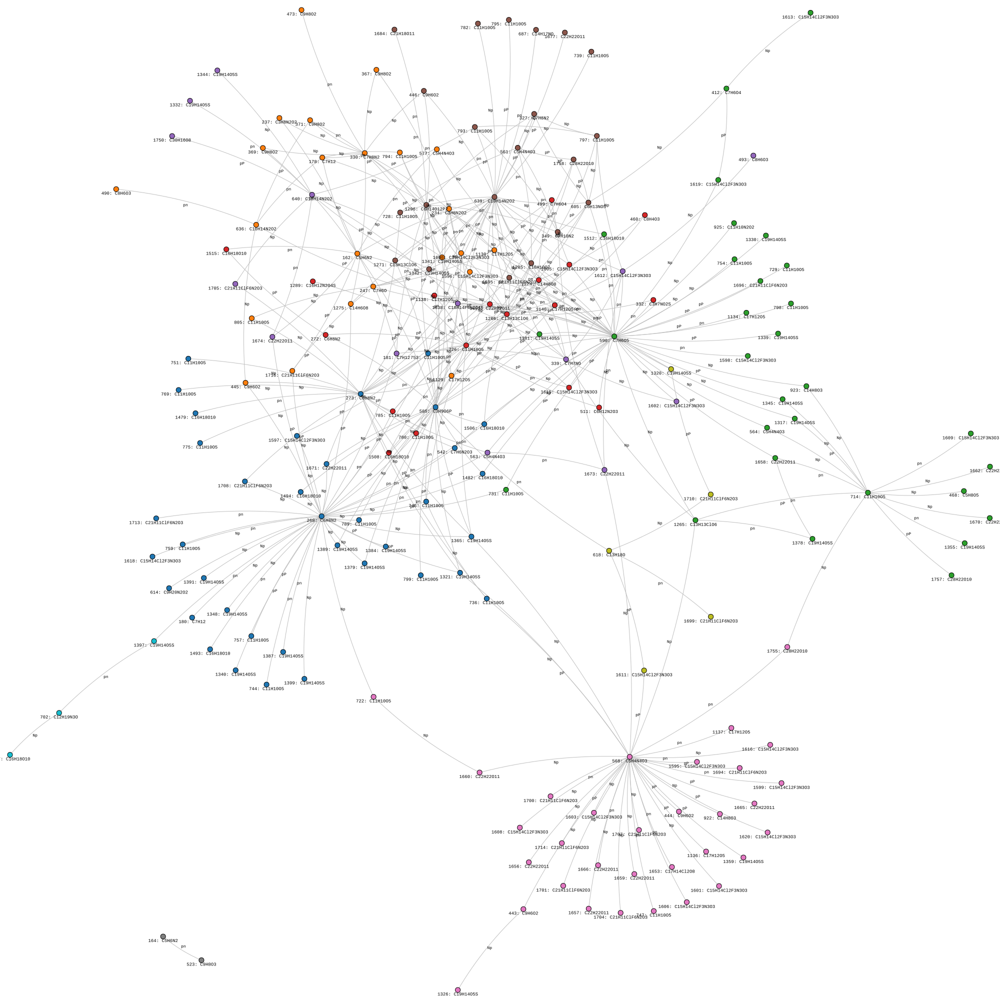

time: 325 ms (started: 2022-07-26 00:25:26 +00:00)


In [ ]:
# Plot clustering

dend_k = g2.community_fastgreedy()
clusters_k = dend_k.as_clustering()
nodes_membership = clusters_k.membership

print(dend_k.summary())
print(clusters_k.summary())
print(clusters_k.sizes())
print(clusters_k.giant())
print(nodes_membership)

palette = sns.color_palette("tab10", len(clusters_k.sizes()), 1)

layout = g2.layout_fruchterman_reingold()
# layout = g2.layout_davidson_harel()
# layout = g2.layout_lgl()
# layout = g2.layout_star()
# layout = g2.layout_graphopt()
# layout = g2.layout_reingold_tilford()
# layout = g2.layout_sugiyama()

visual_style={}
visual_style["bbox"] = (2000, 2000)
visual_style["vertex_size"] = 10
visual_style["vertex_color"] = [palette[m] for m in nodes_membership]

#visual_style["vertex_label"] = [p.get_pinyin(n, "",tone_marks='numbers') for n in g2.vs['name']]
visual_style["vertex_label"] = g2.vs["formula"]
visual_style["labels"] = g2.vs["name"]
visual_style["vertex_label_dist"] =1
visual_style["vertex_label_size"]= 9
#visual_style["vertex_label_size"] = [12 if vd>6 else 6 for vd in v_degree]
#visual_style["vertex_shape"] = "circle"
visual_style["edge_label"] = g2.es["weights"]
visual_style["edge_color"] = "grey"
visual_style["edge_width"] = 1
visual_style["edge_label_size"] = 8
visual_style["edge_curved"] = 0.1

""" fig, ax = plt.subplots(figsize=(30, 30))
ig.plot(g2, layout=layout, target=ax, **visual_style)
plt.axis("off") """

ig.plot(g2, layout=layout, **visual_style, target="graph_filter_cluster.pdf")